# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle
import random
from random import sample

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/CenterLossVAE/ex22/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [9]:
#train_features = ext_data['train']['features']

In [10]:
#train_features.shape

## training

In [11]:
def random_feature_selection(x, t_d=3776, d=2048):
    idx = torch.tensor(sample(range(0, t_d), d)) # t_d(特徴量)の中からランダムにd個サンプリングする(ぜんぶやると重いから) # わからん
    # 0~t_d idxの中からランダムにd個サンプリングする
    x = np.take(x, idx, 1)
    return x

In [12]:
#ext_data['train'].keys()

In [13]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    #for machine in machine_types:
    #    if machine_type == machine:
    #        ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #    else:
    #        ext_data_ = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #        ext_data['train']['features'] = np.concatenate([ext_data['train']['features'],
    #                                                        ext_data_['train']['features']], axis=0)
    #        ext_data['train']['labels'] = np.concatenate([ext_data['train']['labels'],
    #                                                     ext_data_['train']['labels']], axis=0)
    #        ext_data['train']['wav_names'] = np.concatenate([ext_data['train']['wav_names'],
    #                                                         ext_data_['train']['wav_names']], axis=0)
            
    #t_d = 3776    # 全特徴量数
    #d = 1024      # 使う特徴量数
    #for phase in ['train', 'valid_source', 'valid_target']:
    #    x = ext_data[phase]['features']
    #    x = random_feature_selection(x)
    #    ext_data[phase]['features'] = x
    #    x = ext_data[phase]['features'][:,512:2048]
    #    ext_data[phase]['features'] = x
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-4)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [14]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-06-01 20:40:59,910 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-06-01 20:40:59,911 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:41:00,868 - 00_train.py - INFO - TRAINING
2021-06-01 20:41:04,480 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 19.45it/s]
2021-06-01 20:41:05,100 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 113.28it/s]
2021-06-01 20:41:05,143 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.68it/s]


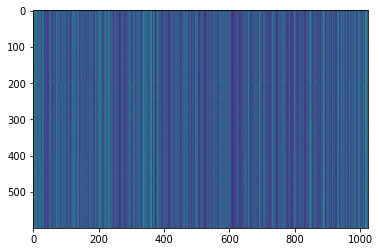

,AUC,pAUC
Source_0,0.522500,0.537895
Source_1,0.571700,0.533684
Source_2,0.607200,0.531579
Target_0,0.479600,0.543684
Target_1,0.655600,0.588421
Target_2,0.533500,0.490000
mean,0.561683,0.537544
h_mean,0.555826,0.536019


2021-06-01 20:41:07,015 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1263.418498, val_AUC_hmean:0.555826, val_pAUC_hmean:0.536019, best_flag:True
2021-06-01 20:41:07,016 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.58it/s]
2021-06-01 20:41:07,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.69it/s]
2021-06-01 20:41:07,343 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.72it/s]


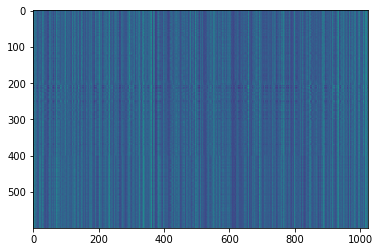

,AUC,pAUC
Source_0,0.55020,0.541053
Source_1,0.59900,0.567368
Source_2,0.66200,0.555263
Target_0,0.51380,0.576316
Target_1,0.67470,0.582632
Target_2,0.62970,0.498421
mean,0.60490,0.553509
h_mean,0.59916,0.552000


2021-06-01 20:41:09,352 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:855.847905, val_AUC_hmean:0.599160, val_pAUC_hmean:0.552000, best_flag:True
2021-06-01 20:41:09,353 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.79it/s]
2021-06-01 20:41:09,543 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.52it/s]
2021-06-01 20:41:09,586 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.43it/s]


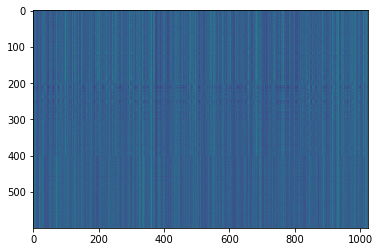

,AUC,pAUC
Source_0,0.558400,0.543158
Source_1,0.610100,0.561579
Source_2,0.643400,0.570000
Target_0,0.532600,0.580526
Target_1,0.696700,0.594211
Target_2,0.627900,0.508421
mean,0.611517,0.559649
h_mean,0.606693,0.558216


2021-06-01 20:41:11,559 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:664.898829, val_AUC_hmean:0.606693, val_pAUC_hmean:0.558216, best_flag:True
2021-06-01 20:41:11,561 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.17it/s]
2021-06-01 20:41:11,747 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 14.57it/s]
2021-06-01 20:41:11,906 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 130.13it/s]
2021-06-01 20:41:11,945 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:571.520803, val_AUC_hmean:0.625348, val_pAUC_hmean:0.554700, best_flag:False
2021-06-01 20:41:11,947 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.37it/s]
2021-06-01 20:41:12,182 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.95it/s]
2021-06-01 20:41:12,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.64it/s]


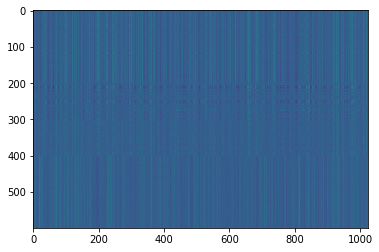

,AUC,pAUC
Source_0,0.563600,0.561579
Source_1,0.635800,0.565789
Source_2,0.728000,0.602105
Target_0,0.536000,0.613684
Target_1,0.691700,0.575263
Target_2,0.632800,0.510526
mean,0.631317,0.571491
h_mean,0.624192,0.569499


2021-06-01 20:41:13,855 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:521.737773, val_AUC_hmean:0.624192, val_pAUC_hmean:0.569499, best_flag:True
2021-06-01 20:41:13,856 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.46it/s]
2021-06-01 20:41:14,050 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 91.26it/s]
2021-06-01 20:41:14,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 111.33it/s]


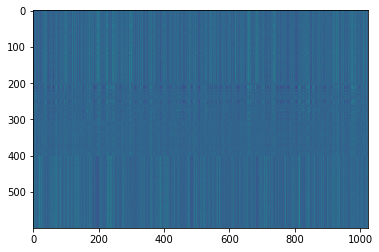

,AUC,pAUC
Source_0,0.571500,0.572105
Source_1,0.642900,0.564737
Source_2,0.771800,0.621579
Target_0,0.533400,0.613684
Target_1,0.692200,0.590526
Target_2,0.665800,0.506842
mean,0.646267,0.578246
h_mean,0.636788,0.575629


2021-06-01 20:41:16,000 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:493.529465, val_AUC_hmean:0.636788, val_pAUC_hmean:0.575629, best_flag:True
2021-06-01 20:41:16,001 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.23it/s]
2021-06-01 20:41:16,190 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.18it/s]
2021-06-01 20:41:16,227 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 140.50it/s]


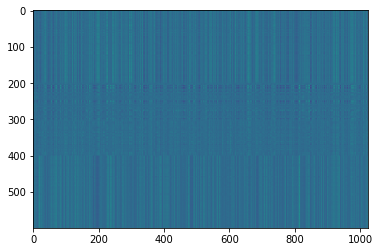

,AUC,pAUC
Source_0,0.562500,0.590000
Source_1,0.653000,0.550526
Source_2,0.764700,0.624737
Target_0,0.528800,0.624737
Target_1,0.681700,0.583684
Target_2,0.640900,0.520000
mean,0.638600,0.582281
h_mean,0.629249,0.579764


2021-06-01 20:41:17,962 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:475.182546, val_AUC_hmean:0.629249, val_pAUC_hmean:0.579764, best_flag:True
2021-06-01 20:41:17,963 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.40it/s]
2021-06-01 20:41:18,149 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 120.25it/s]
2021-06-01 20:41:18,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.57it/s]


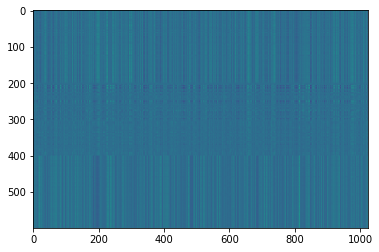

,AUC,pAUC
Source_0,0.579400,0.599474
Source_1,0.708100,0.575789
Source_2,0.812200,0.668421
Target_0,0.543200,0.633158
Target_1,0.706900,0.585263
Target_2,0.645500,0.512105
mean,0.665883,0.595702
h_mean,0.654013,0.591618


2021-06-01 20:41:20,584 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:462.548622, val_AUC_hmean:0.654013, val_pAUC_hmean:0.591618, best_flag:True
2021-06-01 20:41:20,585 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.47it/s]
2021-06-01 20:41:20,777 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.06it/s]
2021-06-01 20:41:20,813 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.19it/s]


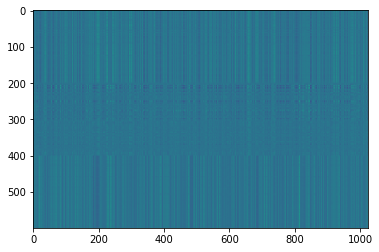

,AUC,pAUC
Source_0,0.589400,0.609474
Source_1,0.698300,0.583158
Source_2,0.806300,0.642105
Target_0,0.553000,0.630526
Target_1,0.705400,0.597368
Target_2,0.676600,0.510000
mean,0.671500,0.595439
h_mean,0.661313,0.592083


2021-06-01 20:41:23,912 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:449.916756, val_AUC_hmean:0.661313, val_pAUC_hmean:0.592083, best_flag:True
2021-06-01 20:41:23,917 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.78it/s]
2021-06-01 20:41:24,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 115.75it/s]
2021-06-01 20:41:24,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.48it/s]


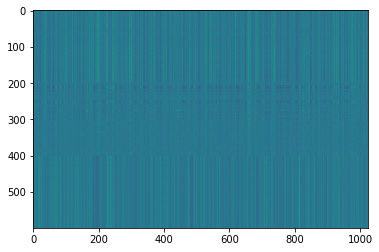

,AUC,pAUC
Source_0,0.577900,0.607368
Source_1,0.715700,0.596842
Source_2,0.800100,0.646316
Target_0,0.553200,0.637368
Target_1,0.716700,0.593684
Target_2,0.640600,0.507895
mean,0.667367,0.598246
h_mean,0.656350,0.594564


2021-06-01 20:41:28,655 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:440.843046, val_AUC_hmean:0.656350, val_pAUC_hmean:0.594564, best_flag:True
2021-06-01 20:41:28,656 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.00it/s]
2021-06-01 20:41:28,843 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 115.68it/s]
2021-06-01 20:41:28,882 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.53it/s]


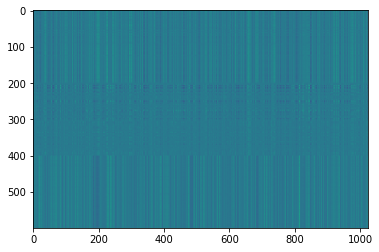

,AUC,pAUC
Source_0,0.590200,0.605789
Source_1,0.701300,0.591053
Source_2,0.815000,0.687895
Target_0,0.555700,0.630000
Target_1,0.704800,0.600526
Target_2,0.644800,0.507895
mean,0.668633,0.603860
h_mean,0.658147,0.598936


2021-06-01 20:41:32,167 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:435.519185, val_AUC_hmean:0.658147, val_pAUC_hmean:0.598936, best_flag:True
2021-06-01 20:41:32,168 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.26it/s]
2021-06-01 20:41:32,409 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 145.16it/s]
2021-06-01 20:41:32,443 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 153.13it/s]
2021-06-01 20:41:32,483 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:427.298869, val_AUC_hmean:0.675833, val_pAUC_hmean:0.598415, best_flag:False
2021-06-01 20:41:32,485 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.00it/s]
2021-06-01 20:41:32,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 121.58it/s]
2021-06-01 20:41:32,711 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 142.79it/s]


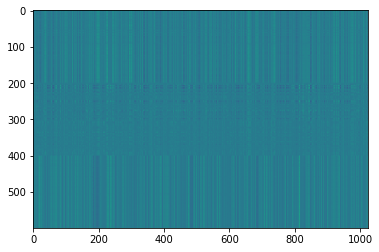

,AUC,pAUC
Source_0,0.604800,0.624211
Source_1,0.715400,0.583158
Source_2,0.820900,0.683684
Target_0,0.571300,0.643158
Target_1,0.706400,0.598947
Target_2,0.675000,0.517895
mean,0.682300,0.608509
h_mean,0.672877,0.603937


2021-06-01 20:41:36,801 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:419.065404, val_AUC_hmean:0.672877, val_pAUC_hmean:0.603937, best_flag:True
2021-06-01 20:41:36,802 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.93it/s]
2021-06-01 20:41:37,002 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.08it/s]
2021-06-01 20:41:37,053 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.09it/s]


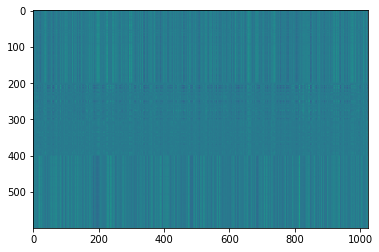

,AUC,pAUC
Source_0,0.619000,0.621053
Source_1,0.735200,0.600526
Source_2,0.824600,0.690526
Target_0,0.580000,0.636842
Target_1,0.714500,0.601053
Target_2,0.671600,0.512105
mean,0.690817,0.610351
h_mean,0.681734,0.605433


2021-06-01 20:41:40,812 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:413.072678, val_AUC_hmean:0.681734, val_pAUC_hmean:0.605433, best_flag:True
2021-06-01 20:41:40,814 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.26it/s]
2021-06-01 20:41:41,018 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 127.03it/s]
2021-06-01 20:41:41,056 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 128.82it/s]
2021-06-01 20:41:41,095 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:408.305316, val_AUC_hmean:0.677100, val_pAUC_hmean:0.602435, best_flag:False
2021-06-01 20:41:41,096 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.54it/s]
2021-06-01 20:41:41,287 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.62it/s]
2021-06-01 20:41:41,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 132.03it/s]
2021-06-01 20

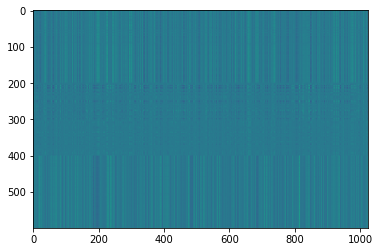

,AUC,pAUC
Source_0,0.619100,0.627895
Source_1,0.738600,0.614737
Source_2,0.813600,0.666842
Target_0,0.572900,0.641053
Target_1,0.725900,0.600000
Target_2,0.673900,0.516842
mean,0.690667,0.611228
h_mean,0.681410,0.607265


2021-06-01 20:41:45,594 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:399.391947, val_AUC_hmean:0.681410, val_pAUC_hmean:0.607265, best_flag:True
2021-06-01 20:41:45,595 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.31it/s]
2021-06-01 20:41:45,789 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 143.55it/s]
2021-06-01 20:41:45,824 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.71it/s]
2021-06-01 20:41:45,865 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:394.708054, val_AUC_hmean:0.686388, val_pAUC_hmean:0.605643, best_flag:False
2021-06-01 20:41:45,866 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.26it/s]
2021-06-01 20:41:46,058 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.28it/s]
2021-06-01 20:41:46,103 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 143.88it/s]


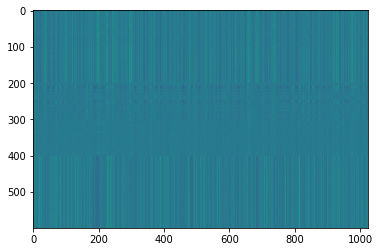

,AUC,pAUC
Source_0,0.647200,0.625789
Source_1,0.751800,0.623684
Source_2,0.814400,0.670000
Target_0,0.589600,0.644211
Target_1,0.719900,0.601053
Target_2,0.681000,0.531579
mean,0.700650,0.616053
h_mean,0.693102,0.612800


2021-06-01 20:41:48,548 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:392.757963, val_AUC_hmean:0.693102, val_pAUC_hmean:0.612800, best_flag:True
2021-06-01 20:41:48,550 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.82it/s]
2021-06-01 20:41:48,800 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 127.08it/s]
2021-06-01 20:41:48,838 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.70it/s]


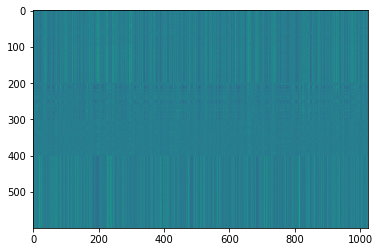

,AUC,pAUC
Source_0,0.652200,0.624737
Source_1,0.750300,0.638421
Source_2,0.808200,0.665789
Target_0,0.600200,0.646316
Target_1,0.759800,0.651053
Target_2,0.695000,0.527368
mean,0.710950,0.625614
h_mean,0.703855,0.621863


2021-06-01 20:41:50,996 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:387.158073, val_AUC_hmean:0.703855, val_pAUC_hmean:0.621863, best_flag:True
2021-06-01 20:41:50,997 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 34.41it/s]
2021-06-01 20:41:51,347 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.92it/s]
2021-06-01 20:41:51,391 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.00it/s]
2021-06-01 20:41:51,439 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:383.099986, val_AUC_hmean:0.693140, val_pAUC_hmean:0.609742, best_flag:False
2021-06-01 20:41:51,440 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.19it/s]
2021-06-01 20:41:51,629 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 112.50it/s]
2021-06-01 20:41:51,671 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 110.36it/s]
2021-06-01 20

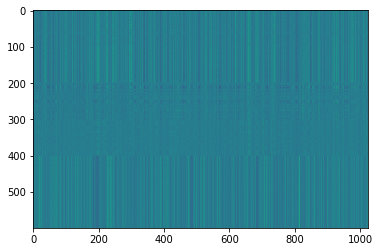

,AUC,pAUC
Source_0,0.656100,0.638421
Source_1,0.763600,0.640526
Source_2,0.819000,0.683684
Target_0,0.592800,0.646316
Target_1,0.762100,0.633158
Target_2,0.672400,0.519474
mean,0.711000,0.626930
h_mean,0.702491,0.622285


2021-06-01 20:41:56,268 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:347.827736, val_AUC_hmean:0.702491, val_pAUC_hmean:0.622285, best_flag:True
2021-06-01 20:41:56,268 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.92it/s]
2021-06-01 20:41:56,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.99it/s]
2021-06-01 20:41:56,585 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 118.27it/s]


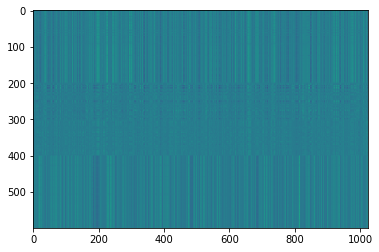

,AUC,pAUC
Source_0,0.657600,0.631579
Source_1,0.754000,0.657368
Source_2,0.825900,0.681053
Target_0,0.593900,0.645789
Target_1,0.760900,0.630000
Target_2,0.669100,0.521579
mean,0.710233,0.627895
h_mean,0.701729,0.623317


2021-06-01 20:41:59,484 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:345.931516, val_AUC_hmean:0.701729, val_pAUC_hmean:0.623317, best_flag:True
2021-06-01 20:41:59,485 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.48it/s]
2021-06-01 20:41:59,689 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.42it/s]
2021-06-01 20:41:59,726 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.25it/s]


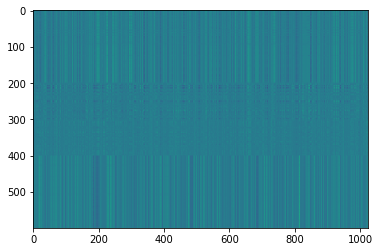

,AUC,pAUC
Source_0,0.661400,0.633158
Source_1,0.752000,0.630526
Source_2,0.820400,0.697895
Target_0,0.594700,0.648947
Target_1,0.757100,0.637368
Target_2,0.693300,0.533684
mean,0.713150,0.630263
h_mean,0.705436,0.626179


2021-06-01 20:42:03,344 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:344.412877, val_AUC_hmean:0.705436, val_pAUC_hmean:0.626179, best_flag:True
2021-06-01 20:42:03,345 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.75it/s]
2021-06-01 20:42:03,588 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 128.54it/s]
2021-06-01 20:42:03,631 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.46it/s]
2021-06-01 20:42:03,683 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:341.106753, val_AUC_hmean:0.703937, val_pAUC_hmean:0.622363, best_flag:False
2021-06-01 20:42:03,684 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.31it/s]
2021-06-01 20:42:03,930 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.27it/s]
2021-06-01 20:42:03,969 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 118.13it/s]
2021-06-01 20:

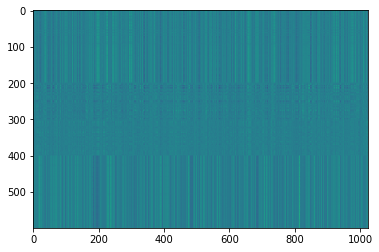

,AUC,pAUC
Source_0,0.672500,0.642105
Source_1,0.753500,0.638947
Source_2,0.814300,0.705263
Target_0,0.603800,0.654211
Target_1,0.763400,0.639474
Target_2,0.694200,0.535263
mean,0.716950,0.635877
h_mean,0.710161,0.631516


2021-06-01 20:42:07,294 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:332.223053, val_AUC_hmean:0.710161, val_pAUC_hmean:0.631516, best_flag:True
2021-06-01 20:42:07,295 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.03it/s]
2021-06-01 20:42:07,501 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.15it/s]
2021-06-01 20:42:07,536 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.72it/s]
2021-06-01 20:42:07,575 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:330.072385, val_AUC_hmean:0.713149, val_pAUC_hmean:0.627644, best_flag:False
2021-06-01 20:42:07,577 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.29it/s]
2021-06-01 20:42:07,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 115.25it/s]
2021-06-01 20:42:07,798 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 131.75it/s]
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 100.28it/s]
2021-06-01 20:42:12,621 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 135.06it/s]
2021-06-01 20:42:12,662 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:293.033348, val_AUC_hmean:0.718248, val_pAUC_hmean:0.619116, best_flag:False
2021-06-01 20:42:12,663 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.97it/s]
2021-06-01 20:42:12,862 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 120.56it/s]
2021-06-01 20:42:12,898 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 113.17it/s]
2021-06-01 20:42:12,940 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:290.674548, val_AUC_hmean:0.724783, val_pAUC_hmean:0.629402, best_flag:False
2021-06-01 20:42:12,941 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.48it/s]
2021-06-01 20:42:13,168 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-06-01 20:42:18,150 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.00it/s]
2021-06-01 20:42:18,407 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.20it/s]
2021-06-01 20:42:18,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.57it/s]
2021-06-01 20:42:18,497 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:257.079460, val_AUC_hmean:0.717376, val_pAUC_hmean:0.617497, best_flag:False
2021-06-01 20:42:18,499 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.72it/s]
2021-06-01 20:42:18,764 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.20it/s]
2021-06-01 20:42:18,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.24it/s]
2021-06-01 20:42:18,860 - pytorch_modeler.py - INFO - epoch:73/300, train_losses:254.678005, val_AUC_hmean:0.726044, val_pAUC_hmean:0.630749, best_flag:False
2021-06-01 20:4

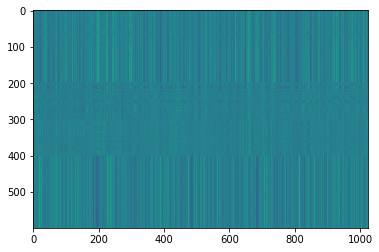

,AUC,pAUC
Source_0,0.737100,0.645789
Source_1,0.762700,0.648947
Source_2,0.823500,0.700000
Target_0,0.634100,0.643684
Target_1,0.801100,0.666316
Target_2,0.677400,0.530000
mean,0.739317,0.639123
h_mean,0.733166,0.634306


2021-06-01 20:42:20,710 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:253.429717, val_AUC_hmean:0.733166, val_pAUC_hmean:0.634306, best_flag:True
2021-06-01 20:42:20,711 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.43it/s]
2021-06-01 20:42:20,908 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.79it/s]
2021-06-01 20:42:20,950 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.83it/s]
2021-06-01 20:42:20,996 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:251.512700, val_AUC_hmean:0.722627, val_pAUC_hmean:0.624306, best_flag:False
2021-06-01 20:42:20,998 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.91it/s]
2021-06-01 20:42:21,200 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.70it/s]
2021-06-01 20:42:21,249 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 127.68it/s]
2021-06-01 20:4

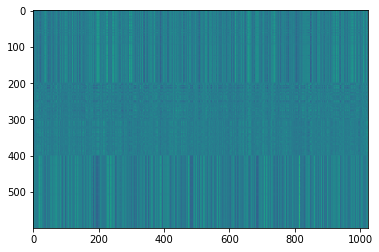

,AUC,pAUC
Source_0,0.732500,0.647368
Source_1,0.766700,0.664737
Source_2,0.829700,0.696842
Target_0,0.632900,0.647895
Target_1,0.788600,0.667368
Target_2,0.674900,0.528947
mean,0.737550,0.642193
h_mean,0.731303,0.637176


2021-06-01 20:42:25,371 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:234.913895, val_AUC_hmean:0.731303, val_pAUC_hmean:0.637176, best_flag:True
2021-06-01 20:42:25,372 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.13it/s]
2021-06-01 20:42:25,619 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.42it/s]
2021-06-01 20:42:25,660 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 140.82it/s]
2021-06-01 20:42:25,701 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:233.634941, val_AUC_hmean:0.727140, val_pAUC_hmean:0.632280, best_flag:False
2021-06-01 20:42:25,702 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.58it/s]
2021-06-01 20:42:25,947 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.63it/s]
2021-06-01 20:42:25,983 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.88it/s]
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 112.14it/s]
2021-06-01 20:42:31,463 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.34it/s]
2021-06-01 20:42:31,508 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:205.269558, val_AUC_hmean:0.728418, val_pAUC_hmean:0.624949, best_flag:False
2021-06-01 20:42:31,509 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.08it/s]
2021-06-01 20:42:31,755 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.40it/s]
2021-06-01 20:42:31,791 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.98it/s]
2021-06-01 20:42:31,839 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:203.530324, val_AUC_hmean:0.736821, val_pAUC_hmean:0.633044, best_flag:False
2021-06-01 20:42:31,840 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.63it/s]
2021-06-01 20:42:32,093 - pytorch_modeler.py - INFO - valid_source
100%|██████

2021-06-01 20:42:37,133 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.15it/s]
2021-06-01 20:42:37,401 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.41it/s]
2021-06-01 20:42:37,440 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.77it/s]
2021-06-01 20:42:37,489 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:178.801698, val_AUC_hmean:0.722385, val_pAUC_hmean:0.624562, best_flag:False
2021-06-01 20:42:37,490 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.99it/s]
2021-06-01 20:42:37,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.78it/s]
2021-06-01 20:42:37,774 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.88it/s]
2021-06-01 20:42:37,820 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:178.582990, val_AUC_hmean:0.732373, val_pAUC_hmean:0.628391, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 131.34it/s]
2021-06-01 20:42:42,592 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:157.386832, val_AUC_hmean:0.731925, val_pAUC_hmean:0.626429, best_flag:False
2021-06-01 20:42:42,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.45it/s]
2021-06-01 20:42:42,797 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.45it/s]
2021-06-01 20:42:42,841 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.67it/s]
2021-06-01 20:42:42,880 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:156.209916, val_AUC_hmean:0.723942, val_pAUC_hmean:0.622476, best_flag:False
2021-06-01 20:42:42,882 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.40it/s]
2021-06-01 20:42:43,109 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.46it/s]
2021-06-01 20:42:43,142 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 52.07it/s]
2021-06-01 20:42:48,076 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.21it/s]
2021-06-01 20:42:48,119 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.14it/s]
2021-06-01 20:42:48,167 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:136.074081, val_AUC_hmean:0.734926, val_pAUC_hmean:0.628152, best_flag:False
2021-06-01 20:42:48,168 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.78it/s]
2021-06-01 20:42:48,402 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.07it/s]
2021-06-01 20:42:48,437 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.78it/s]
2021-06-01 20:42:48,486 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:135.233668, val_AUC_hmean:0.731774, val_pAUC_hmean:0.633871, best_flag:False
2021-06-01 20:42:48,488 - pytorch_modeler.py - INFO - train
100%|████████

2021-06-01 20:42:53,600 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.94it/s]
2021-06-01 20:42:53,853 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 132.25it/s]
2021-06-01 20:42:53,889 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 133.69it/s]
2021-06-01 20:42:53,931 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:116.518355, val_AUC_hmean:0.734445, val_pAUC_hmean:0.631821, best_flag:False
2021-06-01 20:42:53,933 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.46it/s]
2021-06-01 20:42:54,178 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 117.73it/s]
2021-06-01 20:42:54,215 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 147.30it/s]
2021-06-01 20:42:54,251 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:115.897322, val_AUC_hmean:0.729053, val_pAUC_hmean:0.628031, best_flag:False
2021-06-01

100%|██████████| 2/2 [00:00<00:00, 138.11it/s]
2021-06-01 20:42:59,271 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:101.573001, val_AUC_hmean:0.726029, val_pAUC_hmean:0.626062, best_flag:False
2021-06-01 20:42:59,272 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.82it/s]
2021-06-01 20:42:59,500 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.34it/s]
2021-06-01 20:42:59,543 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 112.49it/s]
2021-06-01 20:42:59,585 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:100.304970, val_AUC_hmean:0.724146, val_pAUC_hmean:0.627616, best_flag:False
2021-06-01 20:42:59,586 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.14it/s]
2021-06-01 20:42:59,818 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 128.42it/s]
2021-06-01 20:42:59,855 - pytorch_modeler.py - INFO - valid_target
100%|██████

100%|██████████| 12/12 [00:00<00:00, 47.73it/s]
2021-06-01 20:43:04,978 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.41it/s]
2021-06-01 20:43:05,020 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.49it/s]
2021-06-01 20:43:05,077 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:85.322210, val_AUC_hmean:0.725020, val_pAUC_hmean:0.618156, best_flag:False
2021-06-01 20:43:05,080 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 41.55it/s]
2021-06-01 20:43:05,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.87it/s]
2021-06-01 20:43:05,426 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 111.61it/s]
2021-06-01 20:43:05,475 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:84.536392, val_AUC_hmean:0.725247, val_pAUC_hmean:0.620934, best_flag:False
2021-06-01 20:43:05,476 - pytorch_modeler.py - INFO - train
100%|████████

2021-06-01 20:43:10,887 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.27it/s]
2021-06-01 20:43:11,128 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 132.67it/s]
2021-06-01 20:43:11,163 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.74it/s]
2021-06-01 20:43:11,215 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:73.103358, val_AUC_hmean:0.722223, val_pAUC_hmean:0.625005, best_flag:False
2021-06-01 20:43:11,217 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.81it/s]
2021-06-01 20:43:11,461 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 120.13it/s]
2021-06-01 20:43:11,496 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 136.27it/s]
2021-06-01 20:43:11,542 - pytorch_modeler.py - INFO - epoch:219/300, train_losses:72.035569, val_AUC_hmean:0.720495, val_pAUC_hmean:0.623970, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 91.67it/s]
2021-06-01 20:43:16,802 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:61.938084, val_AUC_hmean:0.731298, val_pAUC_hmean:0.624516, best_flag:False
2021-06-01 20:43:16,803 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.65it/s]
2021-06-01 20:43:17,042 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.63it/s]
2021-06-01 20:43:17,098 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.87it/s]
2021-06-01 20:43:17,154 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:61.284856, val_AUC_hmean:0.728115, val_pAUC_hmean:0.620677, best_flag:False
2021-06-01 20:43:17,155 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.89it/s]
2021-06-01 20:43:17,393 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.53it/s]
2021-06-01 20:43:17,444 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 45.99it/s]
2021-06-01 20:43:22,715 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.93it/s]
2021-06-01 20:43:22,754 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.78it/s]
2021-06-01 20:43:22,798 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:51.782753, val_AUC_hmean:0.741001, val_pAUC_hmean:0.631000, best_flag:False
2021-06-01 20:43:22,799 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.92it/s]
2021-06-01 20:43:23,028 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.27it/s]
2021-06-01 20:43:23,080 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.04it/s]
2021-06-01 20:43:23,137 - pytorch_modeler.py - INFO - epoch:252/300, train_losses:51.427251, val_AUC_hmean:0.734106, val_pAUC_hmean:0.628325, best_flag:False
2021-06-01 20:43:23,139 - pytorch_modeler.py - INFO - train
100%|██████████

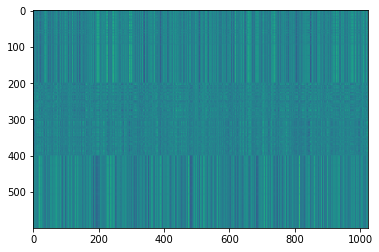

,AUC,pAUC
Source_0,0.806000,0.665789
Source_1,0.753400,0.652632
Source_2,0.819800,0.723684
Target_0,0.720100,0.646842
Target_1,0.790800,0.661579
Target_2,0.640200,0.521579
mean,0.755050,0.645351
h_mean,0.749712,0.638922


2021-06-01 20:43:27,723 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:47.463331, val_AUC_hmean:0.749712, val_pAUC_hmean:0.638922, best_flag:True
2021-06-01 20:43:27,724 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.66it/s]
2021-06-01 20:43:27,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.25it/s]
2021-06-01 20:43:28,030 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.18it/s]
2021-06-01 20:43:28,081 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:48.784060, val_AUC_hmean:0.720804, val_pAUC_hmean:0.635268, best_flag:False
2021-06-01 20:43:28,082 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.74it/s]
2021-06-01 20:43:28,335 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.89it/s]
2021-06-01 20:43:28,371 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.56it/s]
2021-06-01 20:43

100%|██████████| 2/2 [00:00<00:00, 95.07it/s]
2021-06-01 20:43:33,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.71it/s]
2021-06-01 20:43:33,794 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:37.797243, val_AUC_hmean:0.727327, val_pAUC_hmean:0.620855, best_flag:False
2021-06-01 20:43:33,796 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.05it/s]
2021-06-01 20:43:34,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.92it/s]
2021-06-01 20:43:34,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.19it/s]
2021-06-01 20:43:34,149 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:38.300080, val_AUC_hmean:0.722237, val_pAUC_hmean:0.616338, best_flag:False
2021-06-01 20:43:34,150 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.52it/s]
2021-06-01 20:43:34,416 - pytorch_modeler.py - INFO - valid_source
100%|██████████

2021-06-01 20:43:40,824 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 40.76it/s]
2021-06-01 20:43:41,121 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.70it/s]
2021-06-01 20:43:41,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.95it/s]
2021-06-01 20:43:41,207 - pytorch_modeler.py - INFO - epoch:295/300, train_losses:31.004191, val_AUC_hmean:0.721063, val_pAUC_hmean:0.620425, best_flag:False
2021-06-01 20:43:41,208 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.74it/s]
2021-06-01 20:43:41,451 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.87it/s]
2021-06-01 20:43:41,492 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.09it/s]
2021-06-01 20:43:41,541 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:31.075663, val_AUC_hmean:0.716250, val_pAUC_hmean:0.618344, best_flag:False
2021-06-01 20:4

,AUC,pAUC
Source_0,0.806000,0.665789
Source_1,0.753400,0.652632
Source_2,0.819800,0.723684
Target_0,0.720100,0.646842
Target_1,0.790800,0.661579
Target_2,0.640200,0.521579
mean,0.755050,0.645351
h_mean,0.749712,0.638922


2021-06-01 20:43:42,929 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-06-01 20:43:42,931 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:43:42,933 - 00_train.py - INFO - TRAINING


elapsed time: 163.018844366 [sec]


2021-06-01 20:43:43,376 - pytorch_modeler.py - INFO - train
 42%|████▏     | 5/12 [00:00<00:00, 45.07it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 47.63it/s]
2021-06-01 20:43:43,631 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.13it/s]
2021-06-01 20:43:43,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.31it/s]


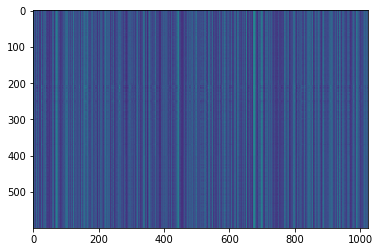

,AUC,pAUC
Source_0,0.514400,0.537368
Source_1,0.575950,0.535263
Source_2,0.572600,0.515263
Target_0,0.476400,0.538421
Target_1,0.642000,0.566316
Target_2,0.490400,0.488947
mean,0.545292,0.530263
h_mean,0.539444,0.529184


2021-06-01 20:43:45,248 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1279.304372, val_AUC_hmean:0.539444, val_pAUC_hmean:0.529184, best_flag:True
2021-06-01 20:43:45,249 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.10it/s]
2021-06-01 20:43:45,507 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.01it/s]
2021-06-01 20:43:45,559 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.30it/s]


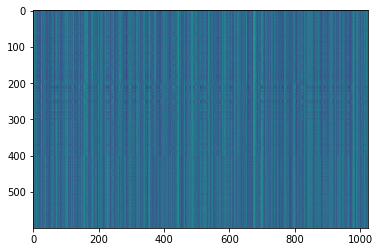

,AUC,pAUC
Source_0,0.541400,0.540000
Source_1,0.580400,0.547895
Source_2,0.642300,0.546842
Target_0,0.502400,0.566316
Target_1,0.656300,0.577895
Target_2,0.610300,0.503158
mean,0.588850,0.547018
h_mean,0.583681,0.545982


2021-06-01 20:43:47,108 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:875.934743, val_AUC_hmean:0.583681, val_pAUC_hmean:0.545982, best_flag:True
2021-06-01 20:43:47,109 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 34.12it/s]
2021-06-01 20:43:47,471 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.68it/s]
2021-06-01 20:43:47,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.29it/s]


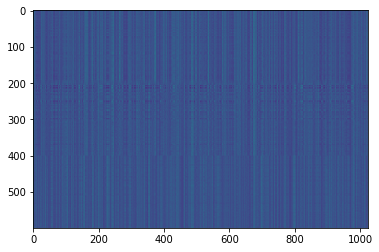

,AUC,pAUC
Source_0,0.549100,0.551053
Source_1,0.599700,0.548947
Source_2,0.669800,0.576316
Target_0,0.523400,0.577895
Target_1,0.680000,0.588421
Target_2,0.648900,0.518947
mean,0.611817,0.560263
h_mean,0.605823,0.559263


2021-06-01 20:43:49,095 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:681.812927, val_AUC_hmean:0.605823, val_pAUC_hmean:0.559263, best_flag:True
2021-06-01 20:43:49,096 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.28it/s]
2021-06-01 20:43:49,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 120.02it/s]
2021-06-01 20:43:49,373 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.61it/s]
2021-06-01 20:43:49,428 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:585.822327, val_AUC_hmean:0.612480, val_pAUC_hmean:0.555286, best_flag:False
2021-06-01 20:43:49,429 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.51it/s]
2021-06-01 20:43:49,678 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.45it/s]
2021-06-01 20:43:49,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.91it/s]


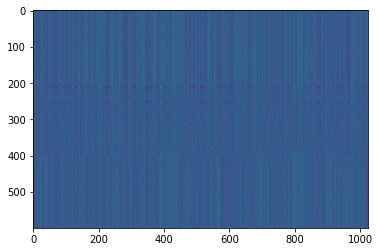

,AUC,pAUC
Source_0,0.551500,0.565263
Source_1,0.653000,0.560000
Source_2,0.735800,0.614737
Target_0,0.519000,0.603684
Target_1,0.678900,0.574211
Target_2,0.667800,0.533158
mean,0.634333,0.575175
h_mean,0.624941,0.573880


2021-06-01 20:43:51,205 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:540.384018, val_AUC_hmean:0.624941, val_pAUC_hmean:0.573880, best_flag:True
2021-06-01 20:43:51,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.99it/s]
2021-06-01 20:43:51,435 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.16it/s]
2021-06-01 20:43:51,480 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.28it/s]
2021-06-01 20:43:51,527 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:509.742864, val_AUC_hmean:0.625694, val_pAUC_hmean:0.570608, best_flag:False
2021-06-01 20:43:51,527 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.44it/s]
2021-06-01 20:43:51,767 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 145.78it/s]
2021-06-01 20:43:51,804 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.82it/s]


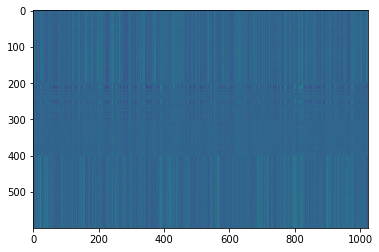

,AUC,pAUC
Source_0,0.565200,0.577895
Source_1,0.669100,0.555263
Source_2,0.788900,0.623158
Target_0,0.527100,0.614737
Target_1,0.687700,0.588947
Target_2,0.648800,0.507368
mean,0.647800,0.577895
h_mean,0.636671,0.575169


2021-06-01 20:43:53,312 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:491.262728, val_AUC_hmean:0.636671, val_pAUC_hmean:0.575169, best_flag:True
2021-06-01 20:43:53,313 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.50it/s]
2021-06-01 20:43:53,549 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.67it/s]
2021-06-01 20:43:53,588 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.04it/s]


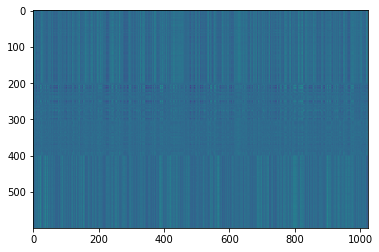

,AUC,pAUC
Source_0,0.57880,0.591053
Source_1,0.68740,0.593684
Source_2,0.78350,0.638421
Target_0,0.53580,0.625263
Target_1,0.70510,0.589474
Target_2,0.63070,0.499474
mean,0.65355,0.589561
h_mean,0.64316,0.585908


2021-06-01 20:43:55,053 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:475.481476, val_AUC_hmean:0.643160, val_pAUC_hmean:0.585908, best_flag:True
2021-06-01 20:43:55,055 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.10it/s]
2021-06-01 20:43:55,302 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.64it/s]
2021-06-01 20:43:55,362 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.93it/s]


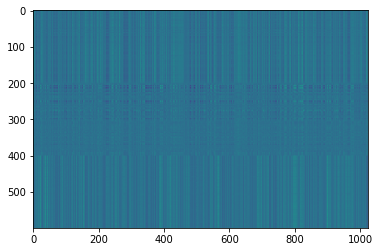

,AUC,pAUC
Source_0,0.581900,0.588421
Source_1,0.693400,0.590000
Source_2,0.787500,0.661053
Target_0,0.540900,0.634737
Target_1,0.700700,0.597368
Target_2,0.619200,0.501053
mean,0.653933,0.595439
h_mean,0.643679,0.590994


2021-06-01 20:43:56,873 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:464.924861, val_AUC_hmean:0.643679, val_pAUC_hmean:0.590994, best_flag:True
2021-06-01 20:43:56,874 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.77it/s]
2021-06-01 20:43:57,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.42it/s]
2021-06-01 20:43:57,176 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.97it/s]


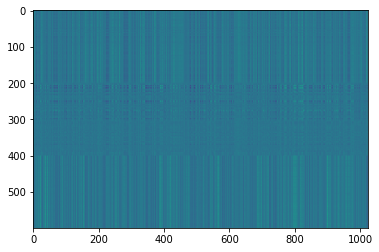

,AUC,pAUC
Source_0,0.581500,0.593684
Source_1,0.705400,0.604737
Source_2,0.788200,0.678421
Target_0,0.544400,0.636842
Target_1,0.717500,0.610000
Target_2,0.598500,0.506842
mean,0.655917,0.605088
h_mean,0.644642,0.600323


2021-06-01 20:43:58,741 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:454.916122, val_AUC_hmean:0.644642, val_pAUC_hmean:0.600323, best_flag:True
2021-06-01 20:43:58,742 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.40it/s]
2021-06-01 20:43:58,982 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.21it/s]
2021-06-01 20:43:59,030 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.99it/s]
2021-06-01 20:43:59,077 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:446.441625, val_AUC_hmean:0.657385, val_pAUC_hmean:0.596421, best_flag:False
2021-06-01 20:43:59,078 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 42.88it/s]
2021-06-01 20:43:59,361 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.94it/s]
2021-06-01 20:43:59,403 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 118.50it/s]
2021-06-01 20

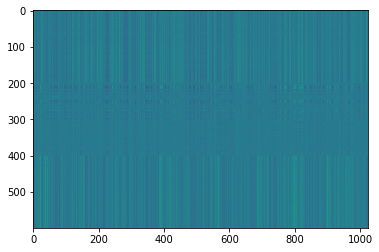

,AUC,pAUC
Source_0,0.607200,0.612105
Source_1,0.728200,0.621579
Source_2,0.811000,0.688947
Target_0,0.561600,0.641053
Target_1,0.728600,0.597368
Target_2,0.615100,0.507895
mean,0.675283,0.611491
h_mean,0.664299,0.606253


2021-06-01 20:44:01,527 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:426.038806, val_AUC_hmean:0.664299, val_pAUC_hmean:0.606253, best_flag:True
2021-06-01 20:44:01,528 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.21it/s]
2021-06-01 20:44:01,719 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.70it/s]
2021-06-01 20:44:01,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.74it/s]


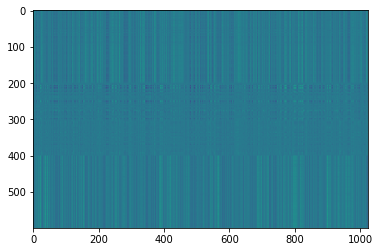

,AUC,pAUC
Source_0,0.612600,0.608421
Source_1,0.717200,0.612105
Source_2,0.819400,0.686842
Target_0,0.565500,0.644737
Target_1,0.728600,0.604211
Target_2,0.625200,0.516316
mean,0.678083,0.612105
h_mean,0.667599,0.607526


2021-06-01 20:44:03,344 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:421.452677, val_AUC_hmean:0.667599, val_pAUC_hmean:0.607526, best_flag:True
2021-06-01 20:44:03,345 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.97it/s]
2021-06-01 20:44:03,529 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.26it/s]
2021-06-01 20:44:03,568 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.18it/s]


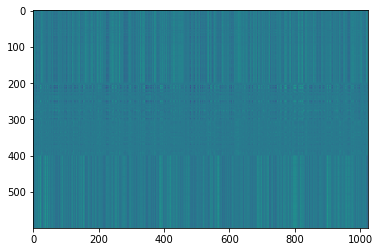

,AUC,pAUC
Source_0,0.622900,0.615263
Source_1,0.704400,0.600526
Source_2,0.812100,0.697895
Target_0,0.582500,0.643158
Target_1,0.721900,0.607895
Target_2,0.653200,0.512105
mean,0.682833,0.612807
h_mean,0.674968,0.607535


2021-06-01 20:44:05,351 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:417.242589, val_AUC_hmean:0.674968, val_pAUC_hmean:0.607535, best_flag:True
2021-06-01 20:44:05,352 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.85it/s]
2021-06-01 20:44:05,539 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.10it/s]
2021-06-01 20:44:05,576 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.86it/s]


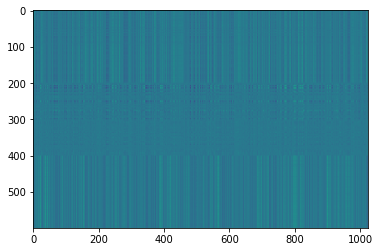

,AUC,pAUC
Source_0,0.630500,0.608947
Source_1,0.720700,0.626316
Source_2,0.816900,0.669474
Target_0,0.576400,0.645789
Target_1,0.730000,0.616316
Target_2,0.668300,0.522632
mean,0.690467,0.614912
h_mean,0.681909,0.611187


2021-06-01 20:44:07,730 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:410.159070, val_AUC_hmean:0.681909, val_pAUC_hmean:0.611187, best_flag:True
2021-06-01 20:44:07,731 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.45it/s]
2021-06-01 20:44:07,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 133.20it/s]
2021-06-01 20:44:07,957 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.35it/s]


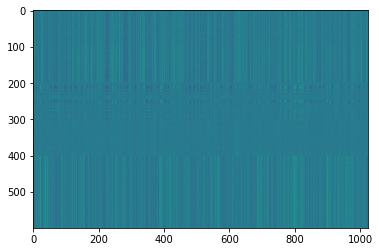

,AUC,pAUC
Source_0,0.638000,0.623684
Source_1,0.731800,0.613684
Source_2,0.820500,0.694737
Target_0,0.590000,0.646842
Target_1,0.738000,0.605263
Target_2,0.659000,0.525789
mean,0.696217,0.618333
h_mean,0.688070,0.613979


2021-06-01 20:44:09,789 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:405.776042, val_AUC_hmean:0.688070, val_pAUC_hmean:0.613979, best_flag:True
2021-06-01 20:44:09,790 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.52it/s]
2021-06-01 20:44:09,990 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 117.27it/s]
2021-06-01 20:44:10,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.27it/s]
2021-06-01 20:44:10,075 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:401.039037, val_AUC_hmean:0.682032, val_pAUC_hmean:0.611523, best_flag:False
2021-06-01 20:44:10,076 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 35.46it/s]
2021-06-01 20:44:10,416 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.81it/s]
2021-06-01 20:44:10,460 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.79it/s]


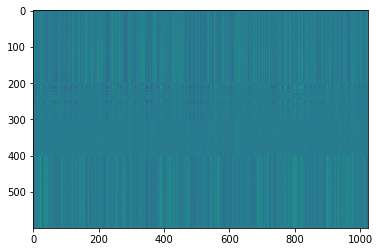

,AUC,pAUC
Source_0,0.630300,0.620000
Source_1,0.737700,0.644211
Source_2,0.821000,0.695263
Target_0,0.582300,0.642632
Target_1,0.756700,0.629474
Target_2,0.673600,0.524737
mean,0.700267,0.626053
h_mean,0.690961,0.621508


2021-06-01 20:44:12,245 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:397.375994, val_AUC_hmean:0.690961, val_pAUC_hmean:0.621508, best_flag:True
2021-06-01 20:44:12,246 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.16it/s]
2021-06-01 20:44:12,447 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.14it/s]
2021-06-01 20:44:12,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 128.11it/s]
2021-06-01 20:44:12,526 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:394.238477, val_AUC_hmean:0.692898, val_pAUC_hmean:0.617230, best_flag:False
2021-06-01 20:44:12,527 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.63it/s]
2021-06-01 20:44:12,724 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.70it/s]
2021-06-01 20:44:12,763 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.99it/s]
2021-06-01 20

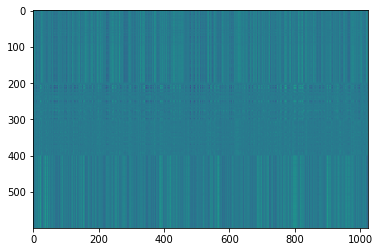

,AUC,pAUC
Source_0,0.638500,0.627368
Source_1,0.744400,0.636842
Source_2,0.834600,0.698947
Target_0,0.590700,0.647895
Target_1,0.751300,0.621053
Target_2,0.679600,0.525789
mean,0.706517,0.626316
h_mean,0.697423,0.621732


2021-06-01 20:44:15,226 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:386.034548, val_AUC_hmean:0.697423, val_pAUC_hmean:0.621732, best_flag:True
2021-06-01 20:44:15,227 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.89it/s]
2021-06-01 20:44:15,485 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.27it/s]
2021-06-01 20:44:15,537 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 131.51it/s]


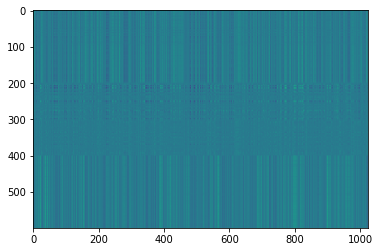

,AUC,pAUC
Source_0,0.639500,0.627895
Source_1,0.736200,0.634211
Source_2,0.822900,0.696842
Target_0,0.592400,0.650526
Target_1,0.758900,0.629474
Target_2,0.673600,0.522105
mean,0.703917,0.626842
h_mean,0.695445,0.622045


2021-06-01 20:44:18,804 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:382.857951, val_AUC_hmean:0.695445, val_pAUC_hmean:0.622045, best_flag:True
2021-06-01 20:44:18,805 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 57.58it/s]
2021-06-01 20:44:19,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 113.37it/s]
2021-06-01 20:44:19,057 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 145.42it/s]
2021-06-01 20:44:19,103 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:379.547376, val_AUC_hmean:0.696325, val_pAUC_hmean:0.621999, best_flag:False
2021-06-01 20:44:19,105 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.86it/s]
2021-06-01 20:44:19,301 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.88it/s]
2021-06-01 20:44:19,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.60it/s]
2021-06-01 20

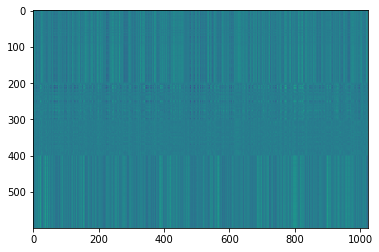

,AUC,pAUC
Source_0,0.647700,0.624737
Source_1,0.747900,0.656842
Source_2,0.802200,0.710526
Target_0,0.592800,0.658421
Target_1,0.787400,0.645789
Target_2,0.681700,0.522632
mean,0.709950,0.636491
h_mean,0.701639,0.630836


2021-06-01 20:44:22,496 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:373.217278, val_AUC_hmean:0.701639, val_pAUC_hmean:0.630836, best_flag:True
2021-06-01 20:44:22,497 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.00it/s]
2021-06-01 20:44:22,734 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.52it/s]
2021-06-01 20:44:22,780 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 122.88it/s]
2021-06-01 20:44:22,821 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:371.759171, val_AUC_hmean:0.694740, val_pAUC_hmean:0.609991, best_flag:False
2021-06-01 20:44:22,823 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.71it/s]
2021-06-01 20:44:23,063 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.77it/s]
2021-06-01 20:44:23,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.95it/s]
2021-06-01 20:4

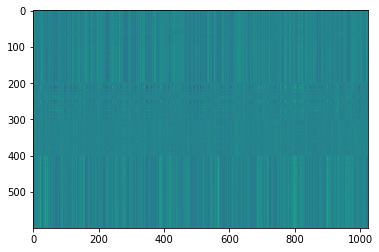

,AUC,pAUC
Source_0,0.676500,0.635789
Source_1,0.760500,0.653158
Source_2,0.818500,0.710000
Target_0,0.618500,0.653158
Target_1,0.783400,0.647895
Target_2,0.693200,0.533684
mean,0.725100,0.638947
h_mean,0.718498,0.634211


2021-06-01 20:44:26,937 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:355.419718, val_AUC_hmean:0.718498, val_pAUC_hmean:0.634211, best_flag:True
2021-06-01 20:44:26,953 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.91it/s]
2021-06-01 20:44:27,178 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.18it/s]
2021-06-01 20:44:27,222 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.08it/s]
2021-06-01 20:44:27,265 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:353.162641, val_AUC_hmean:0.703397, val_pAUC_hmean:0.617015, best_flag:False
2021-06-01 20:44:27,267 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.34it/s]
2021-06-01 20:44:27,486 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.52it/s]
2021-06-01 20:44:27,523 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.44it/s]
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 91.23it/s]
2021-06-01 20:44:32,154 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.80it/s]


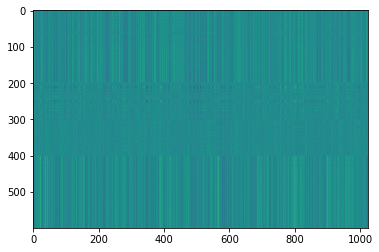

,AUC,pAUC
Source_0,0.704100,0.637368
Source_1,0.762800,0.662632
Source_2,0.822700,0.708947
Target_0,0.611700,0.652632
Target_1,0.787400,0.643158
Target_2,0.694900,0.539474
mean,0.730600,0.640702
h_mean,0.723714,0.636310


2021-06-01 20:44:34,236 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:313.151583, val_AUC_hmean:0.723714, val_pAUC_hmean:0.636310, best_flag:True
2021-06-01 20:44:34,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.92it/s]
2021-06-01 20:44:34,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 112.99it/s]
2021-06-01 20:44:34,484 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 136.59it/s]
2021-06-01 20:44:34,530 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:311.467954, val_AUC_hmean:0.716727, val_pAUC_hmean:0.622105, best_flag:False
2021-06-01 20:44:34,533 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.78it/s]
2021-06-01 20:44:34,736 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.11it/s]
2021-06-01 20:44:34,782 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.82it/s]
2021-06-01 20

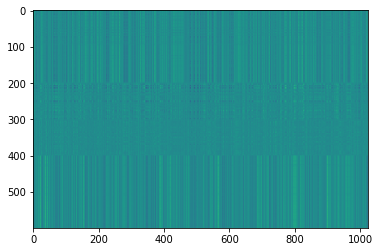

,AUC,pAUC
Source_0,0.710000,0.634737
Source_1,0.770100,0.671579
Source_2,0.811000,0.702105
Target_0,0.624300,0.654737
Target_1,0.825700,0.701579
Target_2,0.683700,0.521579
mean,0.737467,0.647719
h_mean,0.730323,0.641114


2021-06-01 20:44:39,670 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:305.767804, val_AUC_hmean:0.730323, val_pAUC_hmean:0.641114, best_flag:True
2021-06-01 20:44:39,671 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.13it/s]
2021-06-01 20:44:39,866 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.45it/s]
2021-06-01 20:44:39,906 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.53it/s]
2021-06-01 20:44:39,958 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:302.713259, val_AUC_hmean:0.726597, val_pAUC_hmean:0.629943, best_flag:False
2021-06-01 20:44:39,959 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.75it/s]
2021-06-01 20:44:40,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.82it/s]
2021-06-01 20:44:40,227 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.59it/s]
2021-06-01 20:44

100%|██████████| 2/2 [00:00<00:00, 73.03it/s]
2021-06-01 20:44:45,007 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.39it/s]
2021-06-01 20:44:45,060 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:269.295486, val_AUC_hmean:0.732208, val_pAUC_hmean:0.630005, best_flag:False
2021-06-01 20:44:45,061 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.27it/s]
2021-06-01 20:44:45,317 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.69it/s]
2021-06-01 20:44:45,367 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.62it/s]
2021-06-01 20:44:45,423 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:266.627571, val_AUC_hmean:0.732224, val_pAUC_hmean:0.629338, best_flag:False
2021-06-01 20:44:45,424 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.16it/s]
2021-06-01 20:44:45,665 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

2021-06-01 20:44:50,479 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.61it/s]
2021-06-01 20:44:50,679 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.94it/s]
2021-06-01 20:44:50,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.11it/s]
2021-06-01 20:44:50,767 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:236.768706, val_AUC_hmean:0.733033, val_pAUC_hmean:0.631651, best_flag:False
2021-06-01 20:44:50,769 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.29it/s]
2021-06-01 20:44:50,971 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.34it/s]
2021-06-01 20:44:51,008 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.38it/s]
2021-06-01 20:44:51,057 - pytorch_modeler.py - INFO - epoch:89/300, train_losses:235.371793, val_AUC_hmean:0.740630, val_pAUC_hmean:0.632425, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 116.27it/s]
2021-06-01 20:44:55,842 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:210.110700, val_AUC_hmean:0.732299, val_pAUC_hmean:0.630055, best_flag:False
2021-06-01 20:44:55,844 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 56.94it/s]
2021-06-01 20:44:56,057 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.44it/s]
2021-06-01 20:44:56,096 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.72it/s]
2021-06-01 20:44:56,148 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:208.113276, val_AUC_hmean:0.742241, val_pAUC_hmean:0.635083, best_flag:False
2021-06-01 20:44:56,150 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.48it/s]
2021-06-01 20:44:56,351 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.03it/s]
2021-06-01 20:44:56,401 - pytorch_modeler.py - INFO - valid_target
100%|██████

100%|██████████| 12/12 [00:00<00:00, 60.51it/s]
2021-06-01 20:45:01,022 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 116.90it/s]
2021-06-01 20:45:01,060 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.83it/s]
2021-06-01 20:45:01,102 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:183.067249, val_AUC_hmean:0.732318, val_pAUC_hmean:0.627214, best_flag:False
2021-06-01 20:45:01,103 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.80it/s]
2021-06-01 20:45:01,299 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.82it/s]
2021-06-01 20:45:01,338 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 127.26it/s]
2021-06-01 20:45:01,376 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:182.120903, val_AUC_hmean:0.746136, val_pAUC_hmean:0.630625, best_flag:False
2021-06-01 20:45:01,377 - pytorch_modeler.py - INFO - train
100%|█████

2021-06-01 20:45:06,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.91it/s]
2021-06-01 20:45:06,788 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.53it/s]
2021-06-01 20:45:06,832 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 123.10it/s]
2021-06-01 20:45:06,872 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:160.852327, val_AUC_hmean:0.747130, val_pAUC_hmean:0.631969, best_flag:False
2021-06-01 20:45:06,873 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 54.06it/s]
2021-06-01 20:45:07,096 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.21it/s]
2021-06-01 20:45:07,133 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.52it/s]
2021-06-01 20:45:07,177 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:158.501104, val_AUC_hmean:0.742263, val_pAUC_hmean:0.627278, best_flag:False
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 96.42it/s]
2021-06-01 20:45:11,889 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:139.582419, val_AUC_hmean:0.742320, val_pAUC_hmean:0.625032, best_flag:False
2021-06-01 20:45:11,891 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.21it/s]
2021-06-01 20:45:12,137 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.98it/s]
2021-06-01 20:45:12,180 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.10it/s]
2021-06-01 20:45:12,229 - pytorch_modeler.py - INFO - epoch:155/300, train_losses:138.189639, val_AUC_hmean:0.740522, val_pAUC_hmean:0.623594, best_flag:False
2021-06-01 20:45:12,230 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.40it/s]
2021-06-01 20:45:12,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.09it/s]
2021-06-01 20:45:12,526 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 53.44it/s]
2021-06-01 20:45:17,799 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.77it/s]
2021-06-01 20:45:17,850 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.95it/s]
2021-06-01 20:45:17,903 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:120.413253, val_AUC_hmean:0.732399, val_pAUC_hmean:0.619995, best_flag:False
2021-06-01 20:45:17,904 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.18it/s]
2021-06-01 20:45:18,145 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.00it/s]
2021-06-01 20:45:18,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.97it/s]
2021-06-01 20:45:18,230 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:118.533847, val_AUC_hmean:0.737655, val_pAUC_hmean:0.625536, best_flag:False
2021-06-01 20:45:18,231 - pytorch_modeler.py - INFO - train
100%|████████

2021-06-01 20:45:23,256 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.14it/s]
2021-06-01 20:45:23,513 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.53it/s]
2021-06-01 20:45:23,566 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.34it/s]
2021-06-01 20:45:23,610 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:102.849085, val_AUC_hmean:0.735483, val_pAUC_hmean:0.620027, best_flag:False
2021-06-01 20:45:23,611 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.20it/s]
2021-06-01 20:45:23,867 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.67it/s]
2021-06-01 20:45:23,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.08it/s]
2021-06-01 20:45:23,959 - pytorch_modeler.py - INFO - epoch:189/300, train_losses:101.001129, val_AUC_hmean:0.741427, val_pAUC_hmean:0.626735, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 113.06it/s]
2021-06-01 20:45:29,324 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:88.186138, val_AUC_hmean:0.730692, val_pAUC_hmean:0.623587, best_flag:False
2021-06-01 20:45:29,326 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.31it/s]
2021-06-01 20:45:29,572 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.81it/s]
2021-06-01 20:45:29,623 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.17it/s]
2021-06-01 20:45:29,671 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:87.127373, val_AUC_hmean:0.739622, val_pAUC_hmean:0.629186, best_flag:False
2021-06-01 20:45:29,673 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.60it/s]
2021-06-01 20:45:29,908 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 145.76it/s]
2021-06-01 20:45:29,944 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 2/2 [00:00<00:00, 59.51it/s]
2021-06-01 20:45:35,435 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.40it/s]
2021-06-01 20:45:35,491 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:75.467930, val_AUC_hmean:0.734717, val_pAUC_hmean:0.623320, best_flag:False
2021-06-01 20:45:35,492 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 40.73it/s]
2021-06-01 20:45:35,790 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.03it/s]
2021-06-01 20:45:35,857 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.70it/s]
2021-06-01 20:45:35,929 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:73.767733, val_AUC_hmean:0.737062, val_pAUC_hmean:0.618557, best_flag:False
2021-06-01 20:45:35,931 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 39.45it/s]
2021-06-01 20:45:36,240 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

2021-06-01 20:45:42,497 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.70it/s]
2021-06-01 20:45:42,762 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.45it/s]
2021-06-01 20:45:42,815 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.36it/s]
2021-06-01 20:45:42,872 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:63.189644, val_AUC_hmean:0.737508, val_pAUC_hmean:0.625642, best_flag:False
2021-06-01 20:45:42,873 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.55it/s]
2021-06-01 20:45:43,113 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.70it/s]
2021-06-01 20:45:43,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.41it/s]
2021-06-01 20:45:43,206 - pytorch_modeler.py - INFO - epoch:239/300, train_losses:63.182962, val_AUC_hmean:0.741228, val_pAUC_hmean:0.623979, best_flag:False
2021-06-01 20:45

100%|██████████| 2/2 [00:00<00:00, 72.89it/s]
2021-06-01 20:45:48,935 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:53.289932, val_AUC_hmean:0.733737, val_pAUC_hmean:0.624169, best_flag:False
2021-06-01 20:45:48,937 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.54it/s]
2021-06-01 20:45:49,214 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 126.59it/s]
2021-06-01 20:45:49,250 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.02it/s]
2021-06-01 20:45:49,300 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:52.349417, val_AUC_hmean:0.730674, val_pAUC_hmean:0.618572, best_flag:False
2021-06-01 20:45:49,301 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.78it/s]
2021-06-01 20:45:49,531 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.89it/s]
2021-06-01 20:45:49,586 - pytorch_modeler.py - INFO - valid_target
100%|██████████

100%|██████████| 12/12 [00:00<00:00, 47.17it/s]
2021-06-01 20:45:55,255 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.46it/s]
2021-06-01 20:45:55,295 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.07it/s]
2021-06-01 20:45:55,338 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:43.868216, val_AUC_hmean:0.733242, val_pAUC_hmean:0.619376, best_flag:False
2021-06-01 20:45:55,339 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.64it/s]
2021-06-01 20:45:55,588 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 116.92it/s]
2021-06-01 20:45:55,625 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 116.83it/s]
2021-06-01 20:45:55,679 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:43.404352, val_AUC_hmean:0.735705, val_pAUC_hmean:0.620004, best_flag:False
2021-06-01 20:45:55,680 - pytorch_modeler.py - INFO - train
100%|███████

2021-06-01 20:46:01,309 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 35.35it/s]
2021-06-01 20:46:01,651 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.06it/s]
2021-06-01 20:46:01,697 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.70it/s]
2021-06-01 20:46:01,758 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:39.261982, val_AUC_hmean:0.737702, val_pAUC_hmean:0.611244, best_flag:False
2021-06-01 20:46:01,759 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.63it/s]
2021-06-01 20:46:01,994 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.37it/s]
2021-06-01 20:46:02,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.17it/s]
2021-06-01 20:46:02,090 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:38.530543, val_AUC_hmean:0.738835, val_pAUC_hmean:0.611934, best_flag:False
2021-06-01 20:4

,AUC,pAUC
Source_0,0.710000,0.634737
Source_1,0.770100,0.671579
Source_2,0.811000,0.702105
Target_0,0.624300,0.654737
Target_1,0.825700,0.701579
Target_2,0.683700,0.521579
mean,0.737467,0.647719
h_mean,0.730323,0.641114


2021-06-01 20:46:05,983 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-06-01 20:46:05,984 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:46:05,985 - 00_train.py - INFO - TRAINING


elapsed time: 143.053451300 [sec]


2021-06-01 20:46:06,404 - pytorch_modeler.py - INFO - train
 42%|████▏     | 5/12 [00:00<00:00, 42.19it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 43.20it/s]
2021-06-01 20:46:06,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.75it/s]
2021-06-01 20:46:06,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.66it/s]


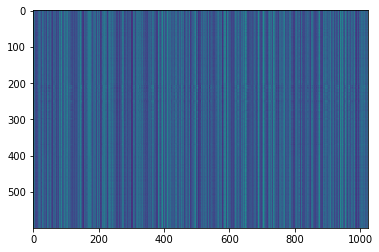

,AUC,pAUC
Source_0,0.515900,0.544737
Source_1,0.572700,0.528947
Source_2,0.581000,0.524211
Target_0,0.482700,0.552632
Target_1,0.670800,0.623684
Target_2,0.514000,0.495263
mean,0.556183,0.544912
h_mean,0.549772,0.542204


2021-06-01 20:46:08,350 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1268.841482, val_AUC_hmean:0.549772, val_pAUC_hmean:0.542204, best_flag:True
2021-06-01 20:46:08,351 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.56it/s]
2021-06-01 20:46:08,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.99it/s]
2021-06-01 20:46:08,638 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.91it/s]


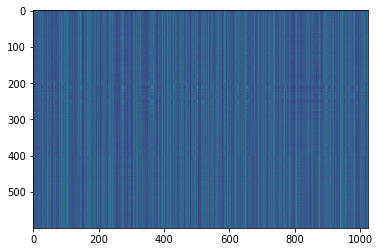

,AUC,pAUC
Source_0,0.543100,0.549474
Source_1,0.609700,0.556316
Source_2,0.655600,0.552632
Target_0,0.513600,0.586316
Target_1,0.708400,0.577368
Target_2,0.590400,0.491579
mean,0.603467,0.552281
h_mean,0.596469,0.550519


2021-06-01 20:46:10,230 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:861.473109, val_AUC_hmean:0.596469, val_pAUC_hmean:0.550519, best_flag:True
2021-06-01 20:46:10,230 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.75it/s]
2021-06-01 20:46:10,502 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.57it/s]
2021-06-01 20:46:10,565 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.34it/s]


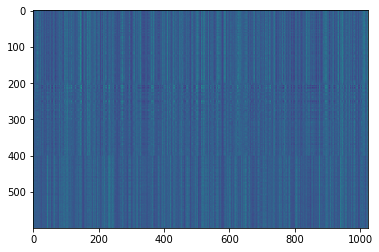

,AUC,pAUC
Source_0,0.563400,0.564737
Source_1,0.644900,0.588421
Source_2,0.685300,0.591579
Target_0,0.544100,0.600526
Target_1,0.705700,0.570000
Target_2,0.610100,0.501053
mean,0.625583,0.569386
h_mean,0.619912,0.567323


2021-06-01 20:46:12,154 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:666.645518, val_AUC_hmean:0.619912, val_pAUC_hmean:0.567323, best_flag:True
2021-06-01 20:46:12,155 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.73it/s]
2021-06-01 20:46:12,414 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.75it/s]
2021-06-01 20:46:12,475 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.89it/s]


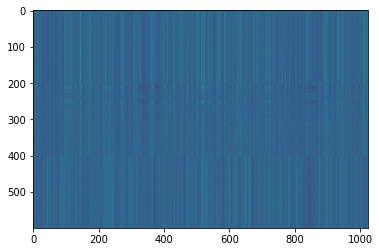

,AUC,pAUC
Source_0,0.565400,0.560526
Source_1,0.663500,0.586842
Source_2,0.733800,0.646316
Target_0,0.551200,0.598421
Target_1,0.699100,0.565789
Target_2,0.627800,0.505789
mean,0.640133,0.577281
h_mean,0.633173,0.574112


2021-06-01 20:46:14,270 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:571.684809, val_AUC_hmean:0.633173, val_pAUC_hmean:0.574112, best_flag:True
2021-06-01 20:46:14,271 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.28it/s]
2021-06-01 20:46:14,521 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.54it/s]
2021-06-01 20:46:14,583 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.33it/s]


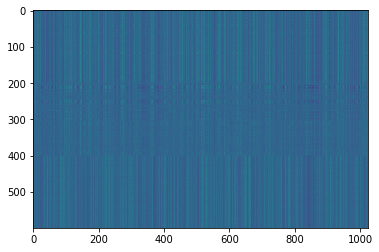

,AUC,pAUC
Source_0,0.577000,0.574211
Source_1,0.679500,0.595263
Source_2,0.776900,0.666316
Target_0,0.561100,0.605263
Target_1,0.698300,0.570526
Target_2,0.639600,0.500000
mean,0.655400,0.585263
h_mean,0.647272,0.580991


2021-06-01 20:46:16,291 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:524.811406, val_AUC_hmean:0.647272, val_pAUC_hmean:0.580991, best_flag:True
2021-06-01 20:46:16,292 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.10it/s]
2021-06-01 20:46:16,555 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.26it/s]
2021-06-01 20:46:16,596 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.81it/s]


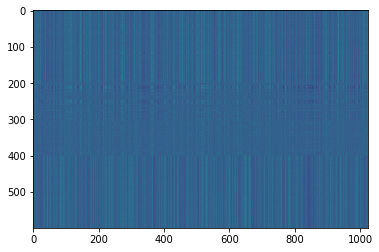

,AUC,pAUC
Source_0,0.576200,0.587895
Source_1,0.681400,0.571053
Source_2,0.791100,0.656842
Target_0,0.551600,0.613684
Target_1,0.699000,0.584737
Target_2,0.643700,0.507895
mean,0.657167,0.587018
h_mean,0.647656,0.583478


2021-06-01 20:46:18,206 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:496.001795, val_AUC_hmean:0.647656, val_pAUC_hmean:0.583478, best_flag:True
2021-06-01 20:46:18,207 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.22it/s]
2021-06-01 20:46:18,459 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.47it/s]
2021-06-01 20:46:18,514 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.84it/s]


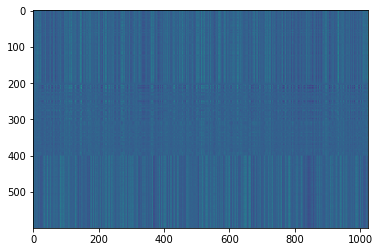

,AUC,pAUC
Source_0,0.579100,0.586842
Source_1,0.697500,0.586842
Source_2,0.784300,0.640000
Target_0,0.555800,0.633684
Target_1,0.700700,0.577368
Target_2,0.609300,0.500000
mean,0.654450,0.587456
h_mean,0.644945,0.583621


2021-06-01 20:46:20,140 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:477.081472, val_AUC_hmean:0.644945, val_pAUC_hmean:0.583621, best_flag:True
2021-06-01 20:46:20,141 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.87it/s]
2021-06-01 20:46:20,400 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.34it/s]
2021-06-01 20:46:20,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.73it/s]


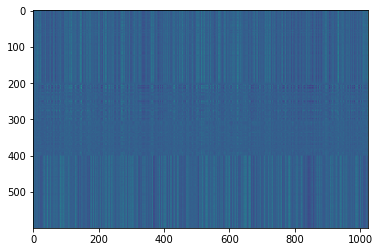

,AUC,pAUC
Source_0,0.592600,0.597895
Source_1,0.704200,0.612105
Source_2,0.777600,0.654737
Target_0,0.567900,0.626316
Target_1,0.702300,0.596316
Target_2,0.635700,0.504211
mean,0.663383,0.598596
h_mean,0.655639,0.594620


2021-06-01 20:46:22,462 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:463.160454, val_AUC_hmean:0.655639, val_pAUC_hmean:0.594620, best_flag:True
2021-06-01 20:46:22,463 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 34.21it/s]
2021-06-01 20:46:22,815 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.82it/s]
2021-06-01 20:46:22,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.75it/s]
2021-06-01 20:46:22,914 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:451.974803, val_AUC_hmean:0.651511, val_pAUC_hmean:0.593090, best_flag:False
2021-06-01 20:46:22,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.73it/s]
2021-06-01 20:46:23,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.33it/s]
2021-06-01 20:46:23,152 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 116.50it/s]
2021-06-01 20:46

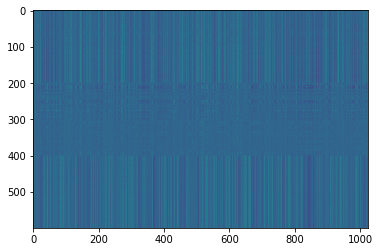

,AUC,pAUC
Source_0,0.627100,0.606842
Source_1,0.708000,0.618421
Source_2,0.816900,0.667895
Target_0,0.587100,0.628947
Target_1,0.701600,0.603684
Target_2,0.673100,0.514211
mean,0.685633,0.606667
h_mean,0.678313,0.602814


2021-06-01 20:46:25,717 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:422.775724, val_AUC_hmean:0.678313, val_pAUC_hmean:0.602814, best_flag:True
2021-06-01 20:46:25,718 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.72it/s]
2021-06-01 20:46:25,972 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.30it/s]
2021-06-01 20:46:26,027 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.94it/s]


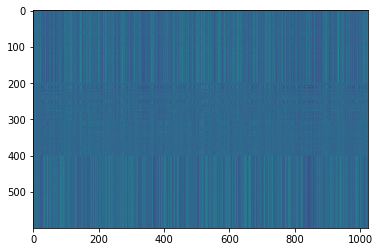

,AUC,pAUC
Source_0,0.634200,0.621053
Source_1,0.726000,0.625789
Source_2,0.806700,0.691053
Target_0,0.593400,0.637368
Target_1,0.703700,0.593158
Target_2,0.663100,0.510526
mean,0.687850,0.613158
h_mean,0.681187,0.607975


2021-06-01 20:46:27,998 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:418.003006, val_AUC_hmean:0.681187, val_pAUC_hmean:0.607975, best_flag:True
2021-06-01 20:46:27,999 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.75it/s]
2021-06-01 20:46:28,259 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.04it/s]
2021-06-01 20:46:28,320 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.84it/s]


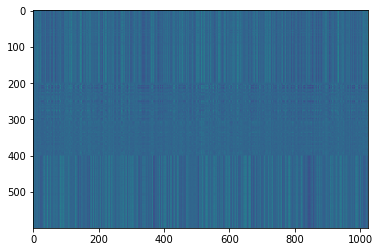

,AUC,pAUC
Source_0,0.633700,0.617895
Source_1,0.726200,0.643684
Source_2,0.800300,0.656316
Target_0,0.601100,0.639474
Target_1,0.713000,0.608947
Target_2,0.657900,0.510000
mean,0.688700,0.612719
h_mean,0.682538,0.608374


2021-06-01 20:46:29,983 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:412.192334, val_AUC_hmean:0.682538, val_pAUC_hmean:0.608374, best_flag:True
2021-06-01 20:46:29,984 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.94it/s]
2021-06-01 20:46:30,236 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.22it/s]
2021-06-01 20:46:30,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 143.34it/s]


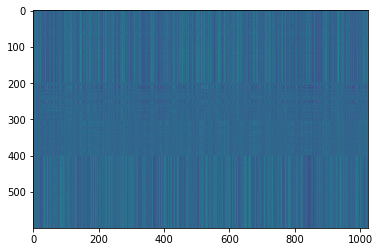

,AUC,pAUC
Source_0,0.649000,0.626842
Source_1,0.738600,0.632632
Source_2,0.811800,0.697895
Target_0,0.607000,0.634211
Target_1,0.721000,0.592632
Target_2,0.645100,0.503158
mean,0.695417,0.614561
h_mean,0.688774,0.608490


2021-06-01 20:46:31,828 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:407.731590, val_AUC_hmean:0.688774, val_pAUC_hmean:0.608490, best_flag:True
2021-06-01 20:46:31,829 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.06it/s]
2021-06-01 20:46:32,076 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 139.46it/s]
2021-06-01 20:46:32,116 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.83it/s]
2021-06-01 20:46:32,169 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:403.354518, val_AUC_hmean:0.686173, val_pAUC_hmean:0.606763, best_flag:False
2021-06-01 20:46:32,170 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.93it/s]
2021-06-01 20:46:32,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 127.18it/s]
2021-06-01 20:46:32,450 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.18it/s]


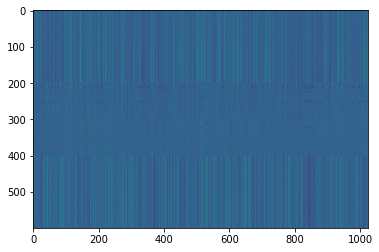

,AUC,pAUC
Source_0,0.645600,0.615263
Source_1,0.725200,0.620526
Source_2,0.818900,0.704737
Target_0,0.606600,0.636316
Target_1,0.730200,0.615263
Target_2,0.678400,0.516842
mean,0.700817,0.618158
h_mean,0.694356,0.613026


2021-06-01 20:46:34,019 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:399.580114, val_AUC_hmean:0.694356, val_pAUC_hmean:0.613026, best_flag:True
2021-06-01 20:46:34,020 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.62it/s]
2021-06-01 20:46:34,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.83it/s]
2021-06-01 20:46:34,335 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.25it/s]
2021-06-01 20:46:34,384 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:393.456942, val_AUC_hmean:0.684841, val_pAUC_hmean:0.608032, best_flag:False
2021-06-01 20:46:34,386 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.70it/s]
2021-06-01 20:46:34,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.33it/s]
2021-06-01 20:46:34,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.47it/s]


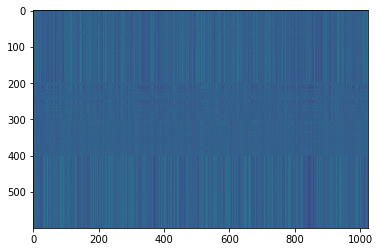

,AUC,pAUC
Source_0,0.662000,0.625263
Source_1,0.743800,0.638421
Source_2,0.792900,0.693684
Target_0,0.617600,0.639474
Target_1,0.730600,0.608947
Target_2,0.660000,0.506842
mean,0.701150,0.618772
h_mean,0.696114,0.613106


2021-06-01 20:46:36,245 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:389.699226, val_AUC_hmean:0.696114, val_pAUC_hmean:0.613106, best_flag:True
2021-06-01 20:46:36,246 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.28it/s]
2021-06-01 20:46:36,489 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.16it/s]
2021-06-01 20:46:36,537 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 111.46it/s]


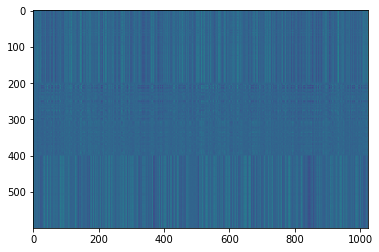

,AUC,pAUC
Source_0,0.665800,0.632632
Source_1,0.757400,0.644737
Source_2,0.810700,0.700526
Target_0,0.620500,0.641579
Target_1,0.742300,0.598947
Target_2,0.643000,0.504737
mean,0.706617,0.620526
h_mean,0.700138,0.614207


2021-06-01 20:46:38,158 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:386.116318, val_AUC_hmean:0.700138, val_pAUC_hmean:0.614207, best_flag:True
2021-06-01 20:46:38,159 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.01it/s]
2021-06-01 20:46:38,423 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.25it/s]
2021-06-01 20:46:38,469 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.39it/s]
2021-06-01 20:46:38,521 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:382.107043, val_AUC_hmean:0.705729, val_pAUC_hmean:0.610792, best_flag:False
2021-06-01 20:46:38,522 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.67it/s]
2021-06-01 20:46:38,775 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.30it/s]
2021-06-01 20:46:38,818 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.64it/s]
2021-06-01 20:46

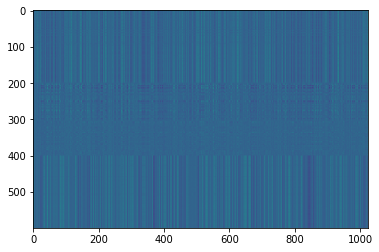

,AUC,pAUC
Source_0,0.664000,0.625263
Source_1,0.731100,0.621053
Source_2,0.808700,0.674211
Target_0,0.613400,0.644737
Target_1,0.756700,0.641053
Target_2,0.680600,0.511579
mean,0.709083,0.619649
h_mean,0.703280,0.614855


2021-06-01 20:46:40,763 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:376.889460, val_AUC_hmean:0.703280, val_pAUC_hmean:0.614855, best_flag:True
2021-06-01 20:46:40,764 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.88it/s]
2021-06-01 20:46:41,023 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.61it/s]
2021-06-01 20:46:41,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.96it/s]


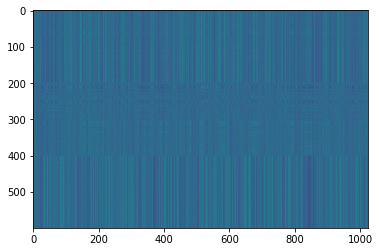

,AUC,pAUC
Source_0,0.686100,0.636842
Source_1,0.758100,0.640526
Source_2,0.807300,0.713158
Target_0,0.615200,0.640000
Target_1,0.749100,0.617895
Target_2,0.689900,0.521579
mean,0.717617,0.628333
h_mean,0.712149,0.622934


2021-06-01 20:46:42,598 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:373.032043, val_AUC_hmean:0.712149, val_pAUC_hmean:0.622934, best_flag:True
2021-06-01 20:46:42,599 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.61it/s]
2021-06-01 20:46:42,865 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.65it/s]
2021-06-01 20:46:42,913 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.91it/s]
2021-06-01 20:46:42,966 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:369.755226, val_AUC_hmean:0.708008, val_pAUC_hmean:0.619539, best_flag:False
2021-06-01 20:46:42,967 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 33.57it/s]
2021-06-01 20:46:43,327 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.90it/s]
2021-06-01 20:46:43,378 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.13it/s]
2021-06-01 20:46:

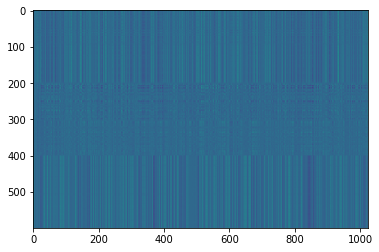

,AUC,pAUC
Source_0,0.692200,0.645789
Source_1,0.744600,0.635263
Source_2,0.823500,0.716842
Target_0,0.632400,0.658421
Target_1,0.756000,0.632632
Target_2,0.678300,0.516316
mean,0.721167,0.634211
h_mean,0.715964,0.628014


2021-06-01 20:46:47,252 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:349.978244, val_AUC_hmean:0.715964, val_pAUC_hmean:0.628014, best_flag:True
2021-06-01 20:46:47,253 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.93it/s]
2021-06-01 20:46:47,511 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.04it/s]
2021-06-01 20:46:47,561 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.48it/s]
2021-06-01 20:46:47,607 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:347.976456, val_AUC_hmean:0.701838, val_pAUC_hmean:0.620486, best_flag:False
2021-06-01 20:46:47,608 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.97it/s]
2021-06-01 20:46:47,878 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 138.05it/s]
2021-06-01 20:46:47,921 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 151.88it/s]
2021-06-01 20:

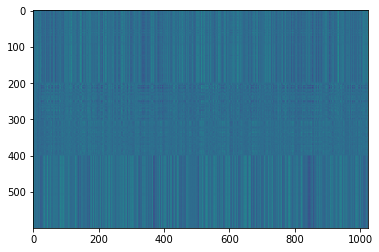

,AUC,pAUC
Source_0,0.696000,0.631579
Source_1,0.764400,0.680526
Source_2,0.824100,0.708947
Target_0,0.618400,0.650000
Target_1,0.779000,0.651579
Target_2,0.688100,0.522105
mean,0.728333,0.640789
h_mean,0.721805,0.634797


2021-06-01 20:46:51,178 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:331.176590, val_AUC_hmean:0.721805, val_pAUC_hmean:0.634797, best_flag:True
2021-06-01 20:46:51,179 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.39it/s]
2021-06-01 20:46:51,414 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 112.21it/s]
2021-06-01 20:46:51,466 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.97it/s]
2021-06-01 20:46:51,520 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:328.040909, val_AUC_hmean:0.706383, val_pAUC_hmean:0.615844, best_flag:False
2021-06-01 20:46:51,521 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.05it/s]
2021-06-01 20:46:51,758 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.32it/s]
2021-06-01 20:46:51,802 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.89it/s]
2021-06-01 20:4

100%|██████████| 2/2 [00:00<00:00, 137.36it/s]
2021-06-01 20:46:56,921 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.33it/s]
2021-06-01 20:46:56,966 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:290.884583, val_AUC_hmean:0.728970, val_pAUC_hmean:0.629054, best_flag:False
2021-06-01 20:46:56,966 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.74it/s]
2021-06-01 20:46:57,169 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.98it/s]
2021-06-01 20:46:57,206 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.07it/s]
2021-06-01 20:46:57,252 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:290.069552, val_AUC_hmean:0.721474, val_pAUC_hmean:0.618284, best_flag:False
2021-06-01 20:46:57,253 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.00it/s]
2021-06-01 20:46:57,452 - pytorch_modeler.py - INFO - valid_source
100%|████████

2021-06-01 20:47:01,697 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.06it/s]
2021-06-01 20:47:01,906 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.69it/s]
2021-06-01 20:47:01,945 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.66it/s]
2021-06-01 20:47:02,001 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:255.686330, val_AUC_hmean:0.719215, val_pAUC_hmean:0.621408, best_flag:False
2021-06-01 20:47:02,002 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.87it/s]
2021-06-01 20:47:02,201 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 144.81it/s]
2021-06-01 20:47:02,239 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.95it/s]
2021-06-01 20:47:02,290 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:254.638028, val_AUC_hmean:0.718589, val_pAUC_hmean:0.619255, best_flag:False
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 109.52it/s]
2021-06-01 20:47:07,093 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:228.068293, val_AUC_hmean:0.723781, val_pAUC_hmean:0.625218, best_flag:False
2021-06-01 20:47:07,094 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.72it/s]
2021-06-01 20:47:07,301 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 120.09it/s]
2021-06-01 20:47:07,342 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.53it/s]
2021-06-01 20:47:07,395 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:229.462095, val_AUC_hmean:0.716196, val_pAUC_hmean:0.604788, best_flag:False
2021-06-01 20:47:07,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.21it/s]
2021-06-01 20:47:07,632 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.73it/s]
2021-06-01 20:47:07,667 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 46.74it/s]
2021-06-01 20:47:12,238 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.43it/s]
2021-06-01 20:47:12,281 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.30it/s]
2021-06-01 20:47:12,330 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:199.763569, val_AUC_hmean:0.726619, val_pAUC_hmean:0.619711, best_flag:False
2021-06-01 20:47:12,330 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.49it/s]
2021-06-01 20:47:12,580 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 116.46it/s]
2021-06-01 20:47:12,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.88it/s]
2021-06-01 20:47:12,668 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:196.723970, val_AUC_hmean:0.736764, val_pAUC_hmean:0.629327, best_flag:False
2021-06-01 20:47:12,669 - pytorch_modeler.py - INFO - train
100%|██████

2021-06-01 20:47:17,361 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 56.11it/s]
2021-06-01 20:47:17,577 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.09it/s]
2021-06-01 20:47:17,616 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.35it/s]
2021-06-01 20:47:17,658 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:173.152273, val_AUC_hmean:0.735021, val_pAUC_hmean:0.620719, best_flag:False
2021-06-01 20:47:17,660 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.48it/s]
2021-06-01 20:47:17,868 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.55it/s]
2021-06-01 20:47:17,914 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 132.28it/s]
2021-06-01 20:47:17,957 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:172.576782, val_AUC_hmean:0.737135, val_pAUC_hmean:0.625273, best_flag:False
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 85.66it/s]
2021-06-01 20:47:23,192 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:151.291237, val_AUC_hmean:0.735237, val_pAUC_hmean:0.623043, best_flag:False
2021-06-01 20:47:23,193 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 56.50it/s]
2021-06-01 20:47:23,409 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.24it/s]
2021-06-01 20:47:23,456 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.99it/s]
2021-06-01 20:47:23,502 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:150.403637, val_AUC_hmean:0.724446, val_pAUC_hmean:0.621988, best_flag:False
2021-06-01 20:47:23,503 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.86it/s]
2021-06-01 20:47:23,700 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.97it/s]
2021-06-01 20:47:23,751 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 61.09it/s]
2021-06-01 20:47:28,422 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 132.49it/s]
2021-06-01 20:47:28,461 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.56it/s]
2021-06-01 20:47:28,507 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:130.552986, val_AUC_hmean:0.727475, val_pAUC_hmean:0.622302, best_flag:False
2021-06-01 20:47:28,508 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.32it/s]
2021-06-01 20:47:28,709 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.21it/s]
2021-06-01 20:47:28,751 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.35it/s]
2021-06-01 20:47:28,809 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:130.011194, val_AUC_hmean:0.722554, val_pAUC_hmean:0.622477, best_flag:False
2021-06-01 20:47:28,810 - pytorch_modeler.py - INFO - train
100%|██████

2021-06-01 20:47:33,428 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.30it/s]
2021-06-01 20:47:33,630 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 122.02it/s]
2021-06-01 20:47:33,672 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.62it/s]
2021-06-01 20:47:33,720 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:111.820669, val_AUC_hmean:0.726327, val_pAUC_hmean:0.622234, best_flag:False
2021-06-01 20:47:33,720 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.26it/s]
2021-06-01 20:47:33,918 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.54it/s]
2021-06-01 20:47:33,956 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.98it/s]
2021-06-01 20:47:34,002 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:110.418006, val_AUC_hmean:0.731451, val_pAUC_hmean:0.620639, best_flag:False
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 152.91it/s]
2021-06-01 20:47:39,182 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:96.066823, val_AUC_hmean:0.727006, val_pAUC_hmean:0.618049, best_flag:False
2021-06-01 20:47:39,183 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 54.36it/s]
2021-06-01 20:47:39,405 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.61it/s]
2021-06-01 20:47:39,451 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.30it/s]
2021-06-01 20:47:39,498 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:95.826750, val_AUC_hmean:0.726285, val_pAUC_hmean:0.617487, best_flag:False
2021-06-01 20:47:39,498 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.21it/s]
2021-06-01 20:47:39,700 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.29it/s]
2021-06-01 20:47:39,742 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 54.71it/s]
2021-06-01 20:47:44,405 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 121.00it/s]
2021-06-01 20:47:44,440 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.30it/s]
2021-06-01 20:47:44,486 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:81.796305, val_AUC_hmean:0.727407, val_pAUC_hmean:0.616802, best_flag:False
2021-06-01 20:47:44,487 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.58it/s]
2021-06-01 20:47:44,678 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.64it/s]
2021-06-01 20:47:44,725 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.91it/s]
2021-06-01 20:47:44,778 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:80.156494, val_AUC_hmean:0.734677, val_pAUC_hmean:0.617171, best_flag:False
2021-06-01 20:47:44,779 - pytorch_modeler.py - INFO - train
100%|█████████

2021-06-01 20:47:49,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.79it/s]
2021-06-01 20:47:49,781 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.78it/s]
2021-06-01 20:47:49,826 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.50it/s]
2021-06-01 20:47:49,888 - pytorch_modeler.py - INFO - epoch:224/300, train_losses:68.825554, val_AUC_hmean:0.725503, val_pAUC_hmean:0.613417, best_flag:False
2021-06-01 20:47:49,889 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.96it/s]
2021-06-01 20:47:50,141 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.15it/s]
2021-06-01 20:47:50,178 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.79it/s]
2021-06-01 20:47:50,231 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:68.087172, val_AUC_hmean:0.735607, val_pAUC_hmean:0.621254, best_flag:False
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 100.55it/s]
2021-06-01 20:47:55,440 - pytorch_modeler.py - INFO - epoch:240/300, train_losses:57.348636, val_AUC_hmean:0.731877, val_pAUC_hmean:0.618556, best_flag:False
2021-06-01 20:47:55,441 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.11it/s]
2021-06-01 20:47:55,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.67it/s]
2021-06-01 20:47:55,711 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.69it/s]
2021-06-01 20:47:55,772 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:57.048390, val_AUC_hmean:0.726460, val_pAUC_hmean:0.613727, best_flag:False
2021-06-01 20:47:55,774 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.75it/s]
2021-06-01 20:47:55,991 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 132.22it/s]
2021-06-01 20:47:56,028 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 51.04it/s]
2021-06-01 20:48:00,865 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 119.82it/s]
2021-06-01 20:48:00,903 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.12it/s]
2021-06-01 20:48:00,954 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:52.792390, val_AUC_hmean:0.721876, val_pAUC_hmean:0.600009, best_flag:False
2021-06-01 20:48:00,955 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.68it/s]
2021-06-01 20:48:01,209 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 115.99it/s]
2021-06-01 20:48:01,246 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.74it/s]
2021-06-01 20:48:01,295 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:49.692467, val_AUC_hmean:0.727389, val_pAUC_hmean:0.617351, best_flag:False
2021-06-01 20:48:01,296 - pytorch_modeler.py - INFO - train
100%|████████

2021-06-01 20:48:06,825 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.97it/s]
2021-06-01 20:48:07,083 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 113.63it/s]
2021-06-01 20:48:07,124 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.77it/s]
2021-06-01 20:48:07,178 - pytorch_modeler.py - INFO - epoch:274/300, train_losses:39.872486, val_AUC_hmean:0.727701, val_pAUC_hmean:0.613354, best_flag:False
2021-06-01 20:48:07,179 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.08it/s]
2021-06-01 20:48:07,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.23it/s]
2021-06-01 20:48:07,492 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.78it/s]
2021-06-01 20:48:07,544 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:40.490607, val_AUC_hmean:0.722248, val_pAUC_hmean:0.616004, best_flag:False
2021-06-01 20:4

100%|██████████| 2/2 [00:00<00:00, 125.24it/s]
2021-06-01 20:48:13,411 - pytorch_modeler.py - INFO - epoch:290/300, train_losses:33.307783, val_AUC_hmean:0.731287, val_pAUC_hmean:0.615027, best_flag:False
2021-06-01 20:48:13,413 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.03it/s]
2021-06-01 20:48:13,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.12it/s]
2021-06-01 20:48:13,716 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.19it/s]
2021-06-01 20:48:13,767 - pytorch_modeler.py - INFO - epoch:291/300, train_losses:32.430987, val_AUC_hmean:0.728748, val_pAUC_hmean:0.613514, best_flag:False
2021-06-01 20:48:13,768 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.68it/s]
2021-06-01 20:48:13,964 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.43it/s]
2021-06-01 20:48:14,002 - pytorch_modeler.py - INFO - valid_target
100%|████████

,AUC,pAUC
Source_0,0.696000,0.631579
Source_1,0.764400,0.680526
Source_2,0.824100,0.708947
Target_0,0.618400,0.650000
Target_1,0.779000,0.651579
Target_2,0.688100,0.522105
mean,0.728333,0.640789
h_mean,0.721805,0.634797


2021-06-01 20:48:16,489 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-06-01 20:48:16,490 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:48:16,492 - 00_train.py - INFO - TRAINING


elapsed time: 130.505908012 [sec]


2021-06-01 20:48:16,925 - pytorch_modeler.py - INFO - train
 50%|█████     | 6/12 [00:00<00:00, 54.88it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 56.59it/s]
2021-06-01 20:48:17,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.37it/s]
2021-06-01 20:48:17,191 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.33it/s]


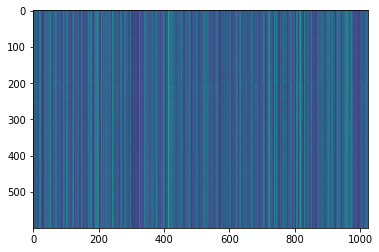

,AUC,pAUC
Source_0,0.532400,0.536842
Source_1,0.580600,0.547895
Source_2,0.629900,0.519474
Target_0,0.480300,0.556842
Target_1,0.680600,0.612105
Target_2,0.524900,0.488421
mean,0.571450,0.543596
h_mean,0.563664,0.541033


2021-06-01 20:48:18,687 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1267.745015, val_AUC_hmean:0.563664, val_pAUC_hmean:0.541033, best_flag:True
2021-06-01 20:48:18,687 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.62it/s]
2021-06-01 20:48:18,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 112.75it/s]
2021-06-01 20:48:18,959 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 152.41it/s]


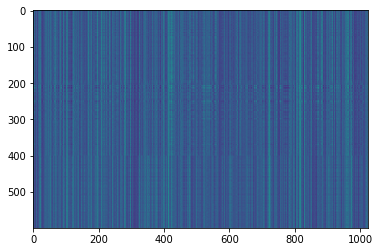

,AUC,pAUC
Source_0,0.545800,0.551053
Source_1,0.627100,0.568947
Source_2,0.664400,0.553684
Target_0,0.509900,0.585263
Target_1,0.708200,0.586316
Target_2,0.586500,0.492632
mean,0.606983,0.556316
h_mean,0.599391,0.554399


2021-06-01 20:48:20,567 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:872.708298, val_AUC_hmean:0.599391, val_pAUC_hmean:0.554399, best_flag:True
2021-06-01 20:48:20,568 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.99it/s]
2021-06-01 20:48:20,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.99it/s]
2021-06-01 20:48:20,865 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.34it/s]


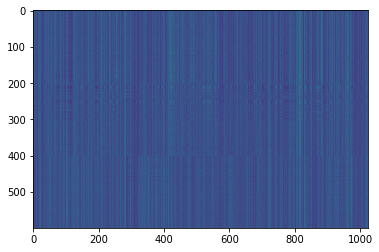

,AUC,pAUC
Source_0,0.561200,0.567368
Source_1,0.645000,0.571053
Source_2,0.681900,0.547368
Target_0,0.538600,0.598947
Target_1,0.682700,0.560526
Target_2,0.643100,0.501579
mean,0.625417,0.557807
h_mean,0.620144,0.556177


2021-06-01 20:48:22,505 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:679.715520, val_AUC_hmean:0.620144, val_pAUC_hmean:0.556177, best_flag:True
2021-06-01 20:48:22,506 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.32it/s]
2021-06-01 20:48:22,747 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.43it/s]
2021-06-01 20:48:22,802 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.91it/s]
2021-06-01 20:48:22,868 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:582.596837, val_AUC_hmean:0.623385, val_pAUC_hmean:0.552227, best_flag:False
2021-06-01 20:48:22,869 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.06it/s]
2021-06-01 20:48:23,121 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.69it/s]
2021-06-01 20:48:23,166 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.29it/s]


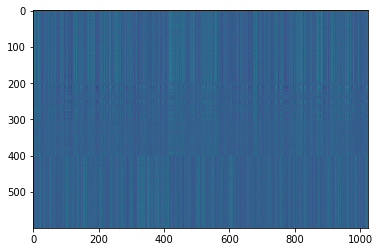

,AUC,pAUC
Source_0,0.573500,0.579474
Source_1,0.664000,0.571579
Source_2,0.754000,0.604737
Target_0,0.551100,0.624211
Target_1,0.691900,0.581053
Target_2,0.643200,0.504211
mean,0.646283,0.577544
h_mean,0.638941,0.574977


2021-06-01 20:48:24,728 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:534.677048, val_AUC_hmean:0.638941, val_pAUC_hmean:0.574977, best_flag:True
2021-06-01 20:48:24,729 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.24it/s]
2021-06-01 20:48:24,986 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.08it/s]
2021-06-01 20:48:25,038 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.84it/s]


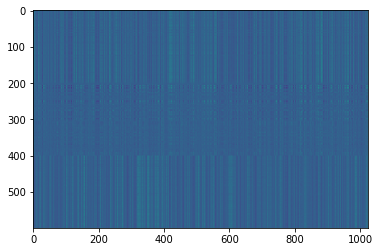

,AUC,pAUC
Source_0,0.578900,0.588947
Source_1,0.677100,0.579474
Source_2,0.806100,0.666842
Target_0,0.539500,0.624737
Target_1,0.685600,0.572632
Target_2,0.648700,0.507368
mean,0.655983,0.590000
h_mean,0.645263,0.585869


2021-06-01 20:48:26,636 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:506.027362, val_AUC_hmean:0.645263, val_pAUC_hmean:0.585869, best_flag:True
2021-06-01 20:48:26,637 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.00it/s]
2021-06-01 20:48:26,906 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 141.35it/s]
2021-06-01 20:48:26,943 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.85it/s]
2021-06-01 20:48:26,998 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:486.165148, val_AUC_hmean:0.646806, val_pAUC_hmean:0.585688, best_flag:False
2021-06-01 20:48:27,000 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.14it/s]
2021-06-01 20:48:27,275 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.28it/s]
2021-06-01 20:48:27,334 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.87it/s]
2021-06-01 20:48

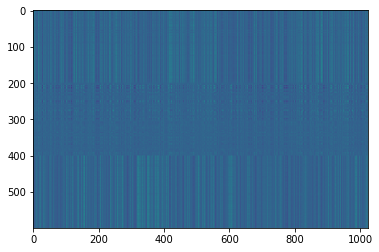

,AUC,pAUC
Source_0,0.592400,0.605263
Source_1,0.720500,0.597895
Source_2,0.795100,0.665263
Target_0,0.555400,0.634737
Target_1,0.697600,0.583684
Target_2,0.635900,0.501053
mean,0.666150,0.597982
h_mean,0.656438,0.593332


2021-06-01 20:48:29,269 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:459.959178, val_AUC_hmean:0.656438, val_pAUC_hmean:0.593332, best_flag:True
2021-06-01 20:48:29,270 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.35it/s]
2021-06-01 20:48:29,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.94it/s]
2021-06-01 20:48:29,581 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.93it/s]


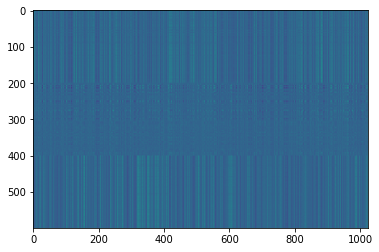

,AUC,pAUC
Source_0,0.593100,0.603684
Source_1,0.702000,0.597895
Source_2,0.806400,0.667895
Target_0,0.553400,0.638421
Target_1,0.696300,0.586842
Target_2,0.642800,0.507368
mean,0.665667,0.600351
h_mean,0.655773,0.595970


2021-06-01 20:48:31,110 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:448.664352, val_AUC_hmean:0.655773, val_pAUC_hmean:0.595970, best_flag:True
2021-06-01 20:48:31,112 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.56it/s]
2021-06-01 20:48:31,356 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.22it/s]
2021-06-01 20:48:31,397 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.80it/s]
2021-06-01 20:48:31,447 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:441.473155, val_AUC_hmean:0.660549, val_pAUC_hmean:0.593697, best_flag:False
2021-06-01 20:48:31,448 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.17it/s]
2021-06-01 20:48:31,710 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.79it/s]
2021-06-01 20:48:31,747 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.00it/s]


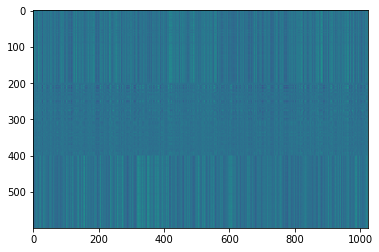

,AUC,pAUC
Source_0,0.600000,0.610000
Source_1,0.704500,0.598947
Source_2,0.812500,0.675263
Target_0,0.559400,0.637368
Target_1,0.696300,0.580000
Target_2,0.616100,0.504737
mean,0.664800,0.601053
h_mean,0.654751,0.596175


2021-06-01 20:48:33,278 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:435.490471, val_AUC_hmean:0.654751, val_pAUC_hmean:0.596175, best_flag:True
2021-06-01 20:48:33,278 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.41it/s]
2021-06-01 20:48:33,519 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.41it/s]
2021-06-01 20:48:33,563 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.44it/s]
2021-06-01 20:48:33,615 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:429.002174, val_AUC_hmean:0.665899, val_pAUC_hmean:0.595926, best_flag:False
2021-06-01 20:48:33,616 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 30.93it/s]
2021-06-01 20:48:34,006 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.77it/s]
2021-06-01 20:48:34,058 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.60it/s]
2021-06-01 20:48:

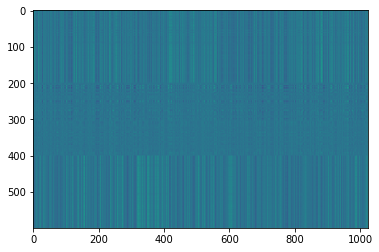

,AUC,pAUC
Source_0,0.627900,0.620526
Source_1,0.733900,0.619474
Source_2,0.818400,0.685789
Target_0,0.587500,0.651579
Target_1,0.711200,0.580000
Target_2,0.647400,0.514211
mean,0.687717,0.611930
h_mean,0.679507,0.606822


2021-06-01 20:48:35,998 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:416.300311, val_AUC_hmean:0.679507, val_pAUC_hmean:0.606822, best_flag:True
2021-06-01 20:48:35,999 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.11it/s]
2021-06-01 20:48:36,241 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.49it/s]
2021-06-01 20:48:36,295 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.53it/s]


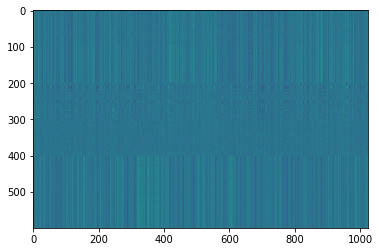

,AUC,pAUC
Source_0,0.646600,0.630526
Source_1,0.736900,0.632105
Source_2,0.802700,0.672105
Target_0,0.602600,0.654211
Target_1,0.720200,0.598421
Target_2,0.657000,0.514211
mean,0.694333,0.616930
h_mean,0.688118,0.612232


2021-06-01 20:48:37,821 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:411.877574, val_AUC_hmean:0.688118, val_pAUC_hmean:0.612232, best_flag:True
2021-06-01 20:48:37,823 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.52it/s]
2021-06-01 20:48:38,091 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.31it/s]
2021-06-01 20:48:38,137 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.01it/s]
2021-06-01 20:48:38,187 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:408.207197, val_AUC_hmean:0.686382, val_pAUC_hmean:0.607231, best_flag:False
2021-06-01 20:48:38,188 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.90it/s]
2021-06-01 20:48:38,464 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 127.92it/s]
2021-06-01 20:48:38,511 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.10it/s]
2021-06-01 20:

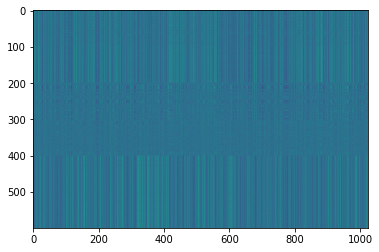

,AUC,pAUC
Source_0,0.642500,0.630000
Source_1,0.733000,0.633158
Source_2,0.808400,0.682105
Target_0,0.601400,0.651053
Target_1,0.712200,0.587368
Target_2,0.636600,0.519474
mean,0.689017,0.617193
h_mean,0.682173,0.612480


2021-06-01 20:48:40,484 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:399.683901, val_AUC_hmean:0.682173, val_pAUC_hmean:0.612480, best_flag:True
2021-06-01 20:48:40,486 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.68it/s]
2021-06-01 20:48:40,740 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.47it/s]
2021-06-01 20:48:40,783 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.96it/s]
2021-06-01 20:48:40,833 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:393.944397, val_AUC_hmean:0.691552, val_pAUC_hmean:0.610194, best_flag:False
2021-06-01 20:48:40,834 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.81it/s]
2021-06-01 20:48:41,082 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.21it/s]
2021-06-01 20:48:41,120 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.33it/s]
2021-06-01 20:4

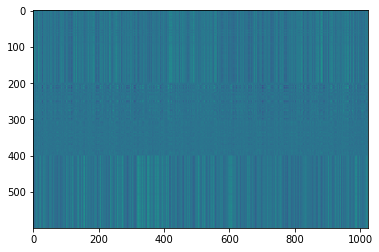

,AUC,pAUC
Source_0,0.674500,0.623158
Source_1,0.744000,0.636316
Source_2,0.832600,0.704737
Target_0,0.617400,0.652105
Target_1,0.735300,0.613684
Target_2,0.685100,0.522105
mean,0.714817,0.625351
h_mean,0.708629,0.620247


2021-06-01 20:48:43,436 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:384.551956, val_AUC_hmean:0.708629, val_pAUC_hmean:0.620247, best_flag:True
2021-06-01 20:48:43,437 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.04it/s]
2021-06-01 20:48:43,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.89it/s]
2021-06-01 20:48:43,717 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.75it/s]


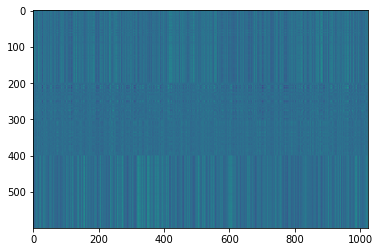

,AUC,pAUC
Source_0,0.649700,0.634211
Source_1,0.748200,0.641579
Source_2,0.815200,0.721579
Target_0,0.589500,0.644737
Target_1,0.740700,0.606316
Target_2,0.663400,0.528421
mean,0.701117,0.629474
h_mean,0.693143,0.624088


2021-06-01 20:48:45,192 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:382.494308, val_AUC_hmean:0.693143, val_pAUC_hmean:0.624088, best_flag:True
2021-06-01 20:48:45,193 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.52it/s]
2021-06-01 20:48:45,437 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.49it/s]
2021-06-01 20:48:45,482 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 133.96it/s]


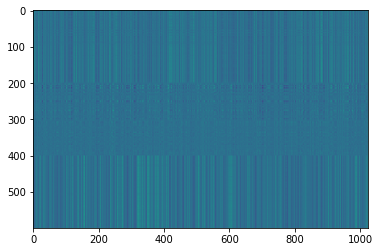

,AUC,pAUC
Source_0,0.678200,0.642632
Source_1,0.741500,0.637895
Source_2,0.812800,0.700526
Target_0,0.619600,0.655789
Target_1,0.740400,0.616842
Target_2,0.687100,0.533158
mean,0.713267,0.631140
h_mean,0.708100,0.626768


2021-06-01 20:48:46,957 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:378.234477, val_AUC_hmean:0.708100, val_pAUC_hmean:0.626768, best_flag:True
2021-06-01 20:48:46,958 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.39it/s]
2021-06-01 20:48:47,193 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.19it/s]
2021-06-01 20:48:47,237 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.65it/s]


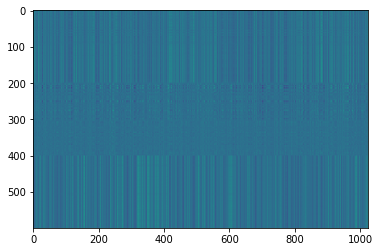

,AUC,pAUC
Source_0,0.674800,0.635263
Source_1,0.769800,0.670526
Source_2,0.808500,0.700000
Target_0,0.619700,0.661579
Target_1,0.746100,0.613158
Target_2,0.677900,0.520526
mean,0.716133,0.633509
h_mean,0.710316,0.627769


2021-06-01 20:48:48,788 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:374.212880, val_AUC_hmean:0.710316, val_pAUC_hmean:0.627769, best_flag:True
2021-06-01 20:48:48,789 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.97it/s]
2021-06-01 20:48:49,059 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.54it/s]
2021-06-01 20:48:49,111 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.17it/s]


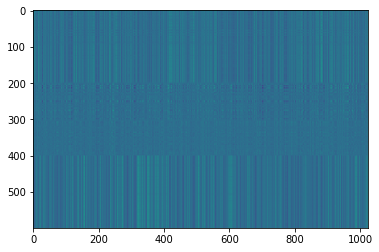

,AUC,pAUC
Source_0,0.666500,0.637895
Source_1,0.764400,0.657895
Source_2,0.821000,0.709474
Target_0,0.599600,0.651579
Target_1,0.755500,0.620000
Target_2,0.693650,0.530526
mean,0.716775,0.634561
h_mean,0.709247,0.629610


2021-06-01 20:48:50,670 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:370.943899, val_AUC_hmean:0.709247, val_pAUC_hmean:0.629610, best_flag:True
2021-06-01 20:48:50,671 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.55it/s]
2021-06-01 20:48:50,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.28it/s]
2021-06-01 20:48:50,970 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.40it/s]
2021-06-01 20:48:51,024 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:368.344093, val_AUC_hmean:0.697049, val_pAUC_hmean:0.610158, best_flag:False
2021-06-01 20:48:51,025 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.63it/s]
2021-06-01 20:48:51,290 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.02it/s]
2021-06-01 20:48:51,335 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.14it/s]
2021-06-01 20:48:

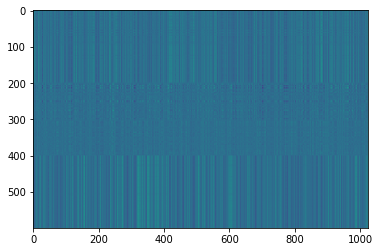

,AUC,pAUC
Source_0,0.717700,0.633684
Source_1,0.764300,0.664737
Source_2,0.823800,0.708421
Target_0,0.632100,0.652632
Target_1,0.779700,0.636842
Target_2,0.687900,0.521579
mean,0.734250,0.636316
h_mean,0.728696,0.630664


2021-06-01 20:48:56,352 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:339.983075, val_AUC_hmean:0.728696, val_pAUC_hmean:0.630664, best_flag:True
2021-06-01 20:48:56,353 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.33it/s]
2021-06-01 20:48:56,620 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.51it/s]
2021-06-01 20:48:56,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 128.86it/s]
2021-06-01 20:48:56,715 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:337.433660, val_AUC_hmean:0.714261, val_pAUC_hmean:0.618016, best_flag:False
2021-06-01 20:48:56,716 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.08it/s]
2021-06-01 20:48:56,978 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.96it/s]
2021-06-01 20:48:57,023 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.98it/s]


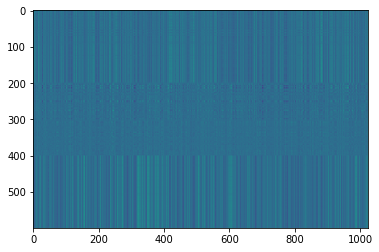

,AUC,pAUC
Source_0,0.704500,0.636842
Source_1,0.764500,0.666316
Source_2,0.817700,0.707368
Target_0,0.624200,0.647895
Target_1,0.769500,0.642105
Target_2,0.694300,0.533684
mean,0.729117,0.639035
h_mean,0.723560,0.634294


2021-06-01 20:48:58,691 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:334.885231, val_AUC_hmean:0.723560, val_pAUC_hmean:0.634294, best_flag:True
2021-06-01 20:48:58,692 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.96it/s]
2021-06-01 20:48:58,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.67it/s]
2021-06-01 20:48:59,016 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.64it/s]
2021-06-01 20:48:59,062 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:332.396734, val_AUC_hmean:0.721662, val_pAUC_hmean:0.627528, best_flag:False
2021-06-01 20:48:59,063 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.19it/s]
2021-06-01 20:48:59,320 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.45it/s]
2021-06-01 20:48:59,364 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.68it/s]
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 138.69it/s]
2021-06-01 20:49:04,686 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.15it/s]
2021-06-01 20:49:04,746 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:296.567258, val_AUC_hmean:0.726368, val_pAUC_hmean:0.626193, best_flag:False
2021-06-01 20:49:04,747 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.53it/s]
2021-06-01 20:49:05,001 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.64it/s]
2021-06-01 20:49:05,053 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.02it/s]
2021-06-01 20:49:05,105 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:293.984136, val_AUC_hmean:0.727035, val_pAUC_hmean:0.625747, best_flag:False
2021-06-01 20:49:05,107 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.80it/s]
2021-06-01 20:49:05,384 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-06-01 20:49:11,016 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.09it/s]
2021-06-01 20:49:11,278 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.18it/s]
2021-06-01 20:49:11,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 114.26it/s]
2021-06-01 20:49:11,367 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:261.961792, val_AUC_hmean:0.718352, val_pAUC_hmean:0.614378, best_flag:False
2021-06-01 20:49:11,368 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.35it/s]
2021-06-01 20:49:11,635 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.48it/s]
2021-06-01 20:49:11,692 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.20it/s]
2021-06-01 20:49:11,754 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:259.624219, val_AUC_hmean:0.714488, val_pAUC_hmean:0.616163, best_flag:False
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 126.55it/s]
2021-06-01 20:49:17,160 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:232.179567, val_AUC_hmean:0.733186, val_pAUC_hmean:0.625857, best_flag:False
2021-06-01 20:49:17,161 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.96it/s]
2021-06-01 20:49:17,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.41it/s]
2021-06-01 20:49:17,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.54it/s]
2021-06-01 20:49:17,496 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:231.437603, val_AUC_hmean:0.729737, val_pAUC_hmean:0.622665, best_flag:False
2021-06-01 20:49:17,497 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 40.12it/s]
2021-06-01 20:49:17,798 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.72it/s]
2021-06-01 20:49:17,854 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 46.28it/s]
2021-06-01 20:49:23,449 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 91.74it/s]
2021-06-01 20:49:23,493 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.11it/s]
2021-06-01 20:49:23,554 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:204.381026, val_AUC_hmean:0.734336, val_pAUC_hmean:0.622805, best_flag:False
2021-06-01 20:49:23,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.01it/s]
2021-06-01 20:49:23,812 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 122.36it/s]
2021-06-01 20:49:23,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.32it/s]


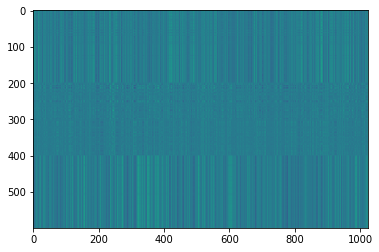

,AUC,pAUC
Source_0,0.747900,0.644211
Source_1,0.771200,0.665263
Source_2,0.832700,0.704737
Target_0,0.665100,0.656316
Target_1,0.764300,0.652105
Target_2,0.677600,0.520526
mean,0.743133,0.640526
h_mean,0.738699,0.634739


2021-06-01 20:49:25,467 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:202.019318, val_AUC_hmean:0.738699, val_pAUC_hmean:0.634739, best_flag:True
2021-06-01 20:49:25,468 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.21it/s]
2021-06-01 20:49:25,724 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.44it/s]
2021-06-01 20:49:25,758 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 141.41it/s]
2021-06-01 20:49:25,796 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:200.970057, val_AUC_hmean:0.724870, val_pAUC_hmean:0.617223, best_flag:False
2021-06-01 20:49:25,797 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.75it/s]
2021-06-01 20:49:26,035 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 158.25it/s]
2021-06-01 20:49:26,068 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 160.89it/s]
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 99.12it/s]
2021-06-01 20:49:31,402 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.35it/s]
2021-06-01 20:49:31,454 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:176.862456, val_AUC_hmean:0.741314, val_pAUC_hmean:0.623198, best_flag:False
2021-06-01 20:49:31,455 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.40it/s]
2021-06-01 20:49:31,701 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.91it/s]
2021-06-01 20:49:31,752 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.38it/s]
2021-06-01 20:49:31,827 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:174.875632, val_AUC_hmean:0.737707, val_pAUC_hmean:0.627288, best_flag:False
2021-06-01 20:49:31,828 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 32.81it/s]
2021-06-01 20:49:32,196 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-06-01 20:49:37,946 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 38.32it/s]
2021-06-01 20:49:38,262 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.35it/s]
2021-06-01 20:49:38,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.52it/s]
2021-06-01 20:49:38,396 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:154.145186, val_AUC_hmean:0.725467, val_pAUC_hmean:0.618451, best_flag:False
2021-06-01 20:49:38,405 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.18it/s]
2021-06-01 20:49:38,690 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.88it/s]
2021-06-01 20:49:38,735 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.13it/s]
2021-06-01 20:49:38,790 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:153.249574, val_AUC_hmean:0.734772, val_pAUC_hmean:0.631583, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 83.97it/s]
2021-06-01 20:49:44,205 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:134.534194, val_AUC_hmean:0.737638, val_pAUC_hmean:0.624898, best_flag:False
2021-06-01 20:49:44,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.39it/s]
2021-06-01 20:49:44,433 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.53it/s]
2021-06-01 20:49:44,475 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.14it/s]
2021-06-01 20:49:44,520 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:133.087541, val_AUC_hmean:0.741942, val_pAUC_hmean:0.627487, best_flag:False
2021-06-01 20:49:44,521 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.06it/s]
2021-06-01 20:49:44,773 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 121.72it/s]
2021-06-01 20:49:44,815 - pytorch_modeler.py - INFO - valid_target
100%|██████

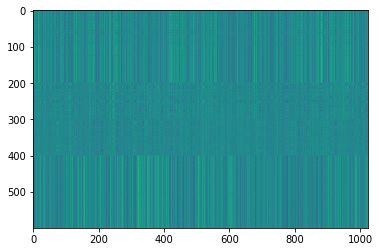

,AUC,pAUC
Source_0,0.736800,0.642632
Source_1,0.773200,0.670000
Source_2,0.828300,0.705263
Target_0,0.659500,0.655263
Target_1,0.762600,0.647368
Target_2,0.674600,0.522105
mean,0.739167,0.640439
h_mean,0.734592,0.634740


2021-06-01 20:49:50,007 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:121.858560, val_AUC_hmean:0.734592, val_pAUC_hmean:0.634740, best_flag:True
2021-06-01 20:49:50,008 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.88it/s]
2021-06-01 20:49:50,189 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.99it/s]
2021-06-01 20:49:50,237 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.68it/s]
2021-06-01 20:49:50,287 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:120.653888, val_AUC_hmean:0.734195, val_pAUC_hmean:0.625645, best_flag:False
2021-06-01 20:49:50,288 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.41it/s]
2021-06-01 20:49:50,533 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.34it/s]
2021-06-01 20:49:50,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.67it/s]
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 107.83it/s]
2021-06-01 20:49:55,211 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 151.27it/s]
2021-06-01 20:49:55,248 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:105.116798, val_AUC_hmean:0.726161, val_pAUC_hmean:0.618256, best_flag:False
2021-06-01 20:49:55,250 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.69it/s]
2021-06-01 20:49:55,443 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.41it/s]
2021-06-01 20:49:55,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.97it/s]
2021-06-01 20:49:55,531 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:103.818546, val_AUC_hmean:0.733332, val_pAUC_hmean:0.631032, best_flag:False
2021-06-01 20:49:55,532 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.93it/s]
2021-06-01 20:49:55,731 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-06-01 20:50:00,000 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.74it/s]
2021-06-01 20:50:00,197 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.99it/s]
2021-06-01 20:50:00,243 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.53it/s]
2021-06-01 20:50:00,293 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:89.308857, val_AUC_hmean:0.734112, val_pAUC_hmean:0.622831, best_flag:False
2021-06-01 20:50:00,294 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 54.41it/s]
2021-06-01 20:50:00,516 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.85it/s]
2021-06-01 20:50:00,555 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 110.35it/s]
2021-06-01 20:50:00,611 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:88.183559, val_AUC_hmean:0.730746, val_pAUC_hmean:0.619963, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 88.40it/s]
2021-06-01 20:50:05,375 - pytorch_modeler.py - INFO - epoch:220/300, train_losses:76.952346, val_AUC_hmean:0.735787, val_pAUC_hmean:0.626181, best_flag:False
2021-06-01 20:50:05,377 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.45it/s]
2021-06-01 20:50:05,614 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.90it/s]
2021-06-01 20:50:05,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.77it/s]
2021-06-01 20:50:05,718 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:76.037778, val_AUC_hmean:0.728690, val_pAUC_hmean:0.625208, best_flag:False
2021-06-01 20:50:05,720 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.96it/s]
2021-06-01 20:50:05,962 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.09it/s]
2021-06-01 20:50:06,006 - pytorch_modeler.py - INFO - valid_target
100%|██████████

100%|██████████| 12/12 [00:00<00:00, 48.65it/s]
2021-06-01 20:50:11,282 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.75it/s]
2021-06-01 20:50:11,329 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.63it/s]
2021-06-01 20:50:11,392 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:77.050596, val_AUC_hmean:0.714786, val_pAUC_hmean:0.612143, best_flag:False
2021-06-01 20:50:11,394 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.21it/s]
2021-06-01 20:50:11,631 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.33it/s]
2021-06-01 20:50:11,667 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.91it/s]
2021-06-01 20:50:11,715 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:71.437390, val_AUC_hmean:0.726232, val_pAUC_hmean:0.601358, best_flag:False
2021-06-01 20:50:11,717 - pytorch_modeler.py - INFO - train
100%|█████████

2021-06-01 20:50:16,531 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.22it/s]
2021-06-01 20:50:16,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.84it/s]
2021-06-01 20:50:16,767 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 112.84it/s]
2021-06-01 20:50:16,816 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:54.863994, val_AUC_hmean:0.731741, val_pAUC_hmean:0.614154, best_flag:False
2021-06-01 20:50:16,817 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 37.85it/s]
2021-06-01 20:50:17,136 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.81it/s]
2021-06-01 20:50:17,170 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 132.75it/s]
2021-06-01 20:50:17,218 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:54.278927, val_AUC_hmean:0.738131, val_pAUC_hmean:0.620831, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 110.01it/s]
2021-06-01 20:50:21,881 - pytorch_modeler.py - INFO - epoch:270/300, train_losses:47.073142, val_AUC_hmean:0.730763, val_pAUC_hmean:0.616879, best_flag:False
2021-06-01 20:50:21,882 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.54it/s]
2021-06-01 20:50:22,160 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.39it/s]
2021-06-01 20:50:22,207 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.31it/s]
2021-06-01 20:50:22,261 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:45.796668, val_AUC_hmean:0.736443, val_pAUC_hmean:0.620130, best_flag:False
2021-06-01 20:50:22,262 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.88it/s]
2021-06-01 20:50:22,496 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.92it/s]
2021-06-01 20:50:22,540 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 42.73it/s]
2021-06-01 20:50:27,472 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.79it/s]
2021-06-01 20:50:27,514 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.85it/s]
2021-06-01 20:50:27,559 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:38.898921, val_AUC_hmean:0.729504, val_pAUC_hmean:0.616035, best_flag:False
2021-06-01 20:50:27,560 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.49it/s]
2021-06-01 20:50:27,810 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.44it/s]
2021-06-01 20:50:27,859 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.16it/s]
2021-06-01 20:50:27,917 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:37.970075, val_AUC_hmean:0.731322, val_pAUC_hmean:0.622439, best_flag:False
2021-06-01 20:50:27,918 - pytorch_modeler.py - INFO - train
100%|████████

,AUC,pAUC
Source_0,0.736800,0.642632
Source_1,0.773200,0.670000
Source_2,0.828300,0.705263
Target_0,0.659500,0.655263
Target_1,0.762600,0.647368
Target_2,0.674600,0.522105
mean,0.739167,0.640439
h_mean,0.734592,0.634740


2021-06-01 20:50:32,455 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-06-01 20:50:32,456 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:50:32,579 - 00_train.py - INFO - TRAINING


elapsed time: 135.965210915 [sec]


2021-06-01 20:50:33,000 - pytorch_modeler.py - INFO - train
 42%|████▏     | 5/12 [00:00<00:00, 45.46it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 45.84it/s]
2021-06-01 20:50:33,264 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.22it/s]
2021-06-01 20:50:33,303 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.51it/s]


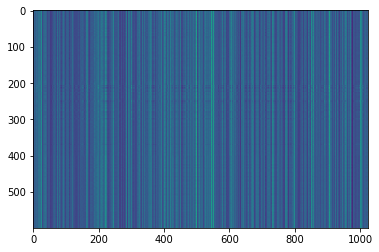

,AUC,pAUC
Source_0,0.524500,0.538947
Source_1,0.574900,0.532105
Source_2,0.594200,0.538421
Target_0,0.479600,0.534211
Target_1,0.656100,0.591579
Target_2,0.573400,0.514737
mean,0.567117,0.541667
h_mean,0.561684,0.540680


2021-06-01 20:50:35,342 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1273.014272, val_AUC_hmean:0.561684, val_pAUC_hmean:0.540680, best_flag:True
2021-06-01 20:50:35,343 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 54.60it/s]
2021-06-01 20:50:35,565 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.89it/s]
2021-06-01 20:50:35,614 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.97it/s]


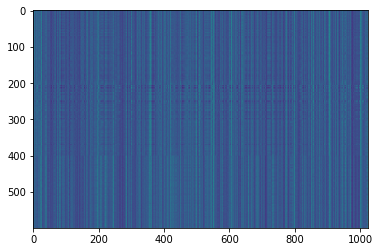

,AUC,pAUC
Source_0,0.537700,0.543684
Source_1,0.591200,0.543158
Source_2,0.665200,0.578421
Target_0,0.497000,0.570000
Target_1,0.671500,0.571053
Target_2,0.647800,0.512105
mean,0.601733,0.553070
h_mean,0.594088,0.552105


2021-06-01 20:50:37,691 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:870.646861, val_AUC_hmean:0.594088, val_pAUC_hmean:0.552105, best_flag:True
2021-06-01 20:50:37,692 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.12it/s]
2021-06-01 20:50:37,966 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.64it/s]
2021-06-01 20:50:38,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.23it/s]


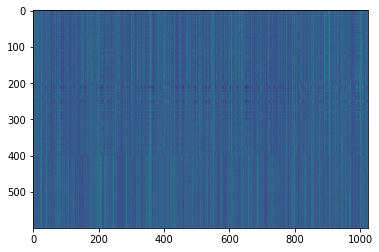

,AUC,pAUC
Source_0,0.547700,0.565789
Source_1,0.607900,0.535789
Source_2,0.687800,0.578947
Target_0,0.520900,0.587895
Target_1,0.700200,0.591579
Target_2,0.673000,0.532632
mean,0.622917,0.565439
h_mean,0.614846,0.564442


2021-06-01 20:50:39,906 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:678.050364, val_AUC_hmean:0.614846, val_pAUC_hmean:0.564442, best_flag:True
2021-06-01 20:50:39,907 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.27it/s]
2021-06-01 20:50:40,126 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 144.59it/s]
2021-06-01 20:50:40,172 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 143.54it/s]
2021-06-01 20:50:40,216 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:582.828115, val_AUC_hmean:0.627520, val_pAUC_hmean:0.562900, best_flag:False
2021-06-01 20:50:40,218 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.72it/s]
2021-06-01 20:50:40,409 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.37it/s]
2021-06-01 20:50:40,450 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 126.21it/s]


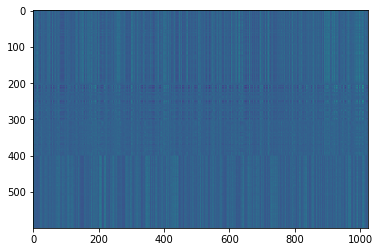

,AUC,pAUC
Source_0,0.555700,0.568947
Source_1,0.643500,0.543158
Source_2,0.777100,0.636842
Target_0,0.521200,0.607368
Target_1,0.700900,0.570000
Target_2,0.671400,0.513158
mean,0.644967,0.573246
h_mean,0.633233,0.570423


2021-06-01 20:50:42,463 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:535.306285, val_AUC_hmean:0.633233, val_pAUC_hmean:0.570423, best_flag:True
2021-06-01 20:50:42,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.21it/s]
2021-06-01 20:50:42,721 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.18it/s]
2021-06-01 20:50:42,758 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.95it/s]


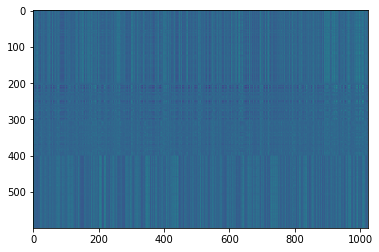

,AUC,pAUC
Source_0,0.561800,0.588421
Source_1,0.621700,0.533684
Source_2,0.802300,0.658421
Target_0,0.520700,0.610000
Target_1,0.686500,0.585789
Target_2,0.676600,0.512632
mean,0.644933,0.581491
h_mean,0.632242,0.577524


2021-06-01 20:50:44,698 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:506.441109, val_AUC_hmean:0.632242, val_pAUC_hmean:0.577524, best_flag:True
2021-06-01 20:50:44,699 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.78it/s]
2021-06-01 20:50:44,896 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.21it/s]
2021-06-01 20:50:44,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.80it/s]


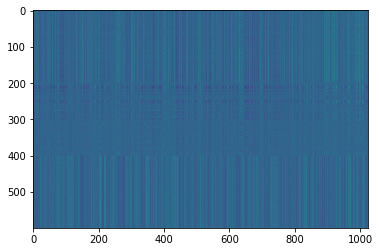

,AUC,pAUC
Source_0,0.558800,0.594737
Source_1,0.650500,0.560526
Source_2,0.811900,0.672105
Target_0,0.517300,0.622105
Target_1,0.700800,0.594211
Target_2,0.681300,0.511053
mean,0.653433,0.592456
h_mean,0.639227,0.588212


2021-06-01 20:50:46,876 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:489.835800, val_AUC_hmean:0.639227, val_pAUC_hmean:0.588212, best_flag:True
2021-06-01 20:50:46,877 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.95it/s]
2021-06-01 20:50:47,140 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.13it/s]
2021-06-01 20:50:47,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.87it/s]


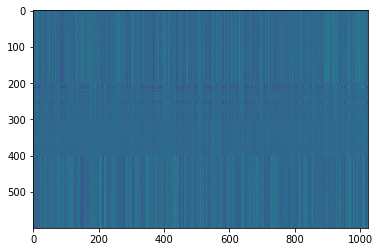

,AUC,pAUC
Source_0,0.565400,0.597368
Source_1,0.672100,0.570526
Source_2,0.818500,0.684737
Target_0,0.523400,0.622632
Target_1,0.705700,0.595789
Target_2,0.697000,0.510526
mean,0.663683,0.596930
h_mean,0.649307,0.592272


2021-06-01 20:50:48,971 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:475.110591, val_AUC_hmean:0.649307, val_pAUC_hmean:0.592272, best_flag:True
2021-06-01 20:50:48,971 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.73it/s]
2021-06-01 20:50:49,216 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.07it/s]
2021-06-01 20:50:49,268 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.34it/s]


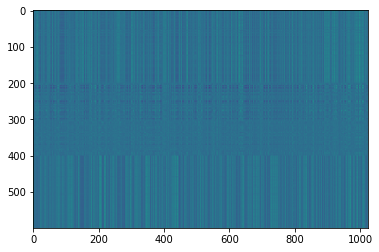

,AUC,pAUC
Source_0,0.581400,0.599474
Source_1,0.663800,0.558947
Source_2,0.813800,0.684211
Target_0,0.537800,0.630526
Target_1,0.705400,0.599474
Target_2,0.670800,0.524737
mean,0.662167,0.599561
h_mean,0.650541,0.595323


2021-06-01 20:50:51,040 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:466.143143, val_AUC_hmean:0.650541, val_pAUC_hmean:0.595323, best_flag:True
2021-06-01 20:50:51,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.63it/s]
2021-06-01 20:50:51,299 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.85it/s]
2021-06-01 20:50:51,341 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.15it/s]


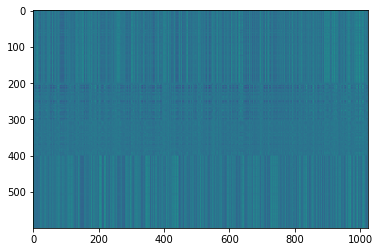

,AUC,pAUC
Source_0,0.570300,0.602105
Source_1,0.702700,0.616316
Source_2,0.818700,0.650526
Target_0,0.528300,0.625263
Target_1,0.716300,0.596316
Target_2,0.685000,0.509474
mean,0.670217,0.600000
h_mean,0.655969,0.596439


2021-06-01 20:50:52,943 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:457.455132, val_AUC_hmean:0.655969, val_pAUC_hmean:0.596439, best_flag:True
2021-06-01 20:50:52,943 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 32.04it/s]
2021-06-01 20:50:53,320 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 139.61it/s]
2021-06-01 20:50:53,358 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.10it/s]


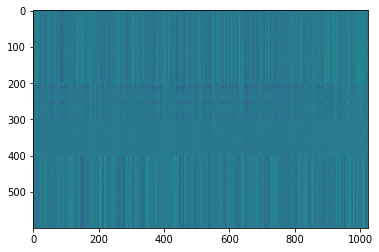

,AUC,pAUC
Source_0,0.586700,0.606316
Source_1,0.709300,0.593158
Source_2,0.804500,0.686842
Target_0,0.547700,0.638947
Target_1,0.727100,0.612105
Target_2,0.689000,0.517895
mean,0.677383,0.609211
h_mean,0.665940,0.604789


2021-06-01 20:50:54,973 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:448.286545, val_AUC_hmean:0.665940, val_pAUC_hmean:0.604789, best_flag:True
2021-06-01 20:50:54,974 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.31it/s]
2021-06-01 20:50:55,172 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.09it/s]
2021-06-01 20:50:55,214 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 131.03it/s]


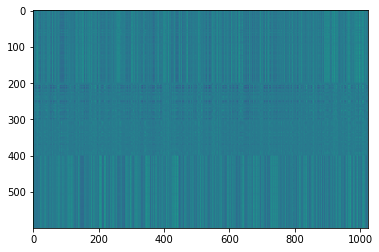

,AUC,pAUC
Source_0,0.584400,0.606316
Source_1,0.729200,0.604737
Source_2,0.811700,0.705263
Target_0,0.548100,0.638421
Target_1,0.724300,0.612105
Target_2,0.693400,0.519474
mean,0.681850,0.614386
h_mean,0.669508,0.609389


2021-06-01 20:50:57,264 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:441.836619, val_AUC_hmean:0.669508, val_pAUC_hmean:0.609389, best_flag:True
2021-06-01 20:50:57,265 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 56.80it/s]
2021-06-01 20:50:57,478 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.32it/s]
2021-06-01 20:50:57,520 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.61it/s]
2021-06-01 20:50:57,563 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:435.295364, val_AUC_hmean:0.653291, val_pAUC_hmean:0.599037, best_flag:False
2021-06-01 20:50:57,564 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.90it/s]
2021-06-01 20:50:57,763 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.28it/s]
2021-06-01 20:50:57,799 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 127.06it/s]
2021-06-01 20

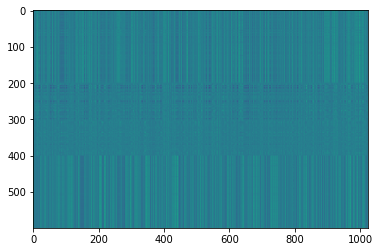

,AUC,pAUC
Source_0,0.612100,0.616842
Source_1,0.737800,0.625263
Source_2,0.814900,0.720000
Target_0,0.572700,0.638421
Target_1,0.736400,0.610526
Target_2,0.681400,0.522105
mean,0.692550,0.622193
h_mean,0.682758,0.616713


2021-06-01 20:51:00,766 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:410.059024, val_AUC_hmean:0.682758, val_pAUC_hmean:0.616713, best_flag:True
2021-06-01 20:51:00,767 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 42.04it/s]
2021-06-01 20:51:01,055 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.46it/s]
2021-06-01 20:51:01,110 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.08it/s]


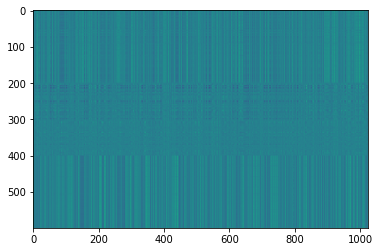

,AUC,pAUC
Source_0,0.622100,0.625789
Source_1,0.718200,0.606842
Source_2,0.816100,0.718947
Target_0,0.568900,0.640526
Target_1,0.732900,0.610526
Target_2,0.707800,0.534737
mean,0.694333,0.622895
h_mean,0.684914,0.618174


2021-06-01 20:51:03,032 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:404.426109, val_AUC_hmean:0.684914, val_pAUC_hmean:0.618174, best_flag:True
2021-06-01 20:51:03,033 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.77it/s]
2021-06-01 20:51:03,287 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.78it/s]
2021-06-01 20:51:03,343 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.52it/s]


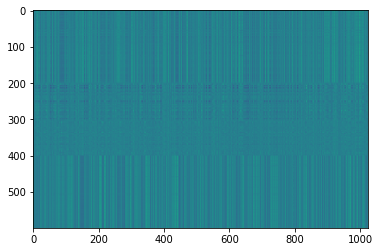

,AUC,pAUC
Source_0,0.630400,0.616316
Source_1,0.727000,0.628947
Source_2,0.813900,0.710000
Target_0,0.583200,0.646842
Target_1,0.745200,0.611053
Target_2,0.691700,0.528947
mean,0.698567,0.623684
h_mean,0.690228,0.618940


2021-06-01 20:51:05,096 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:400.809235, val_AUC_hmean:0.690228, val_pAUC_hmean:0.618940, best_flag:True
2021-06-01 20:51:05,097 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 41.32it/s]
2021-06-01 20:51:05,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.11it/s]
2021-06-01 20:51:05,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 112.32it/s]
2021-06-01 20:51:05,494 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:398.959320, val_AUC_hmean:0.686775, val_pAUC_hmean:0.617114, best_flag:False
2021-06-01 20:51:05,495 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 42.99it/s]
2021-06-01 20:51:05,776 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.65it/s]
2021-06-01 20:51:05,825 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 122.37it/s]
2021-06-01 20:5

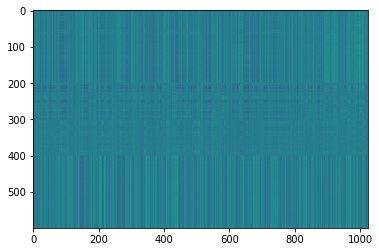

,AUC,pAUC
Source_0,0.643700,0.637368
Source_1,0.724100,0.624737
Source_2,0.816800,0.723684
Target_0,0.582200,0.640526
Target_1,0.746800,0.628947
Target_2,0.719400,0.532105
mean,0.705500,0.631228
h_mean,0.697224,0.626178


2021-06-01 20:51:08,731 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:380.876208, val_AUC_hmean:0.697224, val_pAUC_hmean:0.626178, best_flag:True
2021-06-01 20:51:08,732 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.38it/s]
2021-06-01 20:51:08,994 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.77it/s]
2021-06-01 20:51:09,037 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.99it/s]
2021-06-01 20:51:09,098 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:378.383657, val_AUC_hmean:0.686263, val_pAUC_hmean:0.616963, best_flag:False
2021-06-01 20:51:09,099 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.92it/s]
2021-06-01 20:51:09,328 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.21it/s]
2021-06-01 20:51:09,369 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 119.46it/s]
2021-06-01 20:51

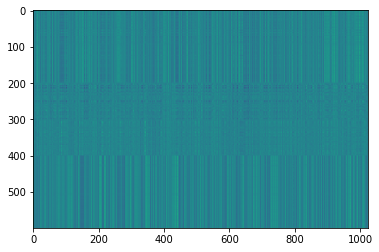

,AUC,pAUC
Source_0,0.67470,0.632105
Source_1,0.74530,0.642105
Source_2,0.82280,0.714211
Target_0,0.59840,0.642105
Target_1,0.75330,0.636842
Target_2,0.69010,0.522632
mean,0.71410,0.631667
h_mean,0.70697,0.626268


2021-06-01 20:51:15,270 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:345.917440, val_AUC_hmean:0.706970, val_pAUC_hmean:0.626268, best_flag:True
2021-06-01 20:51:15,271 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.49it/s]
2021-06-01 20:51:15,468 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.01it/s]
2021-06-01 20:51:15,511 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 112.37it/s]
2021-06-01 20:51:15,567 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:341.744939, val_AUC_hmean:0.708459, val_pAUC_hmean:0.623802, best_flag:False
2021-06-01 20:51:15,568 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.11it/s]
2021-06-01 20:51:15,773 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.71it/s]
2021-06-01 20:51:15,808 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.50it/s]


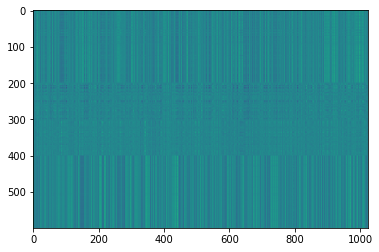

,AUC,pAUC
Source_0,0.675700,0.637895
Source_1,0.742900,0.638947
Source_2,0.825900,0.716842
Target_0,0.604500,0.644737
Target_1,0.755400,0.634211
Target_2,0.700000,0.531579
mean,0.717400,0.634035
h_mean,0.710609,0.629148


2021-06-01 20:51:17,830 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:339.140490, val_AUC_hmean:0.710609, val_pAUC_hmean:0.629148, best_flag:True
2021-06-01 20:51:17,831 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.05it/s]
2021-06-01 20:51:18,020 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 133.65it/s]
2021-06-01 20:51:18,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 131.39it/s]
2021-06-01 20:51:18,102 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:336.065867, val_AUC_hmean:0.710089, val_pAUC_hmean:0.621387, best_flag:False
2021-06-01 20:51:18,103 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 56.63it/s]
2021-06-01 20:51:18,317 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.62it/s]
2021-06-01 20:51:18,359 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.35it/s]
2021-06-01 20:5

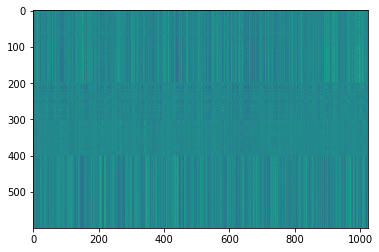

,AUC,pAUC
Source_0,0.663800,0.632632
Source_1,0.758600,0.662632
Source_2,0.815400,0.707895
Target_0,0.592700,0.641579
Target_1,0.764300,0.642105
Target_2,0.697700,0.526842
mean,0.715417,0.635614
h_mean,0.707551,0.630477


2021-06-01 20:51:20,875 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:327.993594, val_AUC_hmean:0.707551, val_pAUC_hmean:0.630477, best_flag:True
2021-06-01 20:51:20,876 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.35it/s]
2021-06-01 20:51:21,137 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.79it/s]
2021-06-01 20:51:21,191 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.77it/s]
2021-06-01 20:51:21,246 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:325.579613, val_AUC_hmean:0.706635, val_pAUC_hmean:0.618019, best_flag:False
2021-06-01 20:51:21,247 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.70it/s]
2021-06-01 20:51:21,496 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.38it/s]
2021-06-01 20:51:21,543 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.37it/s]
2021-06-01 20:51:

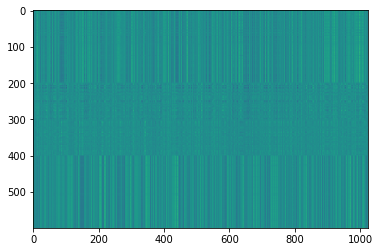

,AUC,pAUC
Source_0,0.710500,0.637368
Source_1,0.758800,0.662105
Source_2,0.822100,0.702632
Target_0,0.622900,0.650000
Target_1,0.764900,0.648947
Target_2,0.674500,0.521053
mean,0.725617,0.637018
h_mean,0.719678,0.631505


2021-06-01 20:51:27,627 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:295.656039, val_AUC_hmean:0.719678, val_pAUC_hmean:0.631505, best_flag:True
2021-06-01 20:51:27,628 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.68it/s]
2021-06-01 20:51:27,872 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 14.27it/s]
2021-06-01 20:51:28,034 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.77it/s]
2021-06-01 20:51:28,086 - pytorch_modeler.py - INFO - epoch:61/300, train_losses:292.745514, val_AUC_hmean:0.716373, val_pAUC_hmean:0.619853, best_flag:False
2021-06-01 20:51:28,087 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.75it/s]
2021-06-01 20:51:28,317 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.67it/s]
2021-06-01 20:51:28,364 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.70it/s]
2021-06-01 20:51:

100%|██████████| 2/2 [00:00<00:00, 76.70it/s]
2021-06-01 20:51:33,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.12it/s]
2021-06-01 20:51:33,721 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:261.213801, val_AUC_hmean:0.712185, val_pAUC_hmean:0.616058, best_flag:False
2021-06-01 20:51:33,723 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.65it/s]
2021-06-01 20:51:33,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.78it/s]
2021-06-01 20:51:34,015 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.84it/s]
2021-06-01 20:51:34,070 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:259.389989, val_AUC_hmean:0.729396, val_pAUC_hmean:0.629638, best_flag:False
2021-06-01 20:51:34,071 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.49it/s]
2021-06-01 20:51:34,316 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

2021-06-01 20:51:40,040 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.35it/s]
2021-06-01 20:51:40,286 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.87it/s]
2021-06-01 20:51:40,335 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.81it/s]
2021-06-01 20:51:40,381 - pytorch_modeler.py - INFO - epoch:94/300, train_losses:229.068572, val_AUC_hmean:0.719247, val_pAUC_hmean:0.618095, best_flag:False
2021-06-01 20:51:40,382 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.55it/s]
2021-06-01 20:51:40,621 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.42it/s]
2021-06-01 20:51:40,670 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.17it/s]
2021-06-01 20:51:40,721 - pytorch_modeler.py - INFO - epoch:95/300, train_losses:228.146712, val_AUC_hmean:0.715754, val_pAUC_hmean:0.623200, best_flag:False
2021-06-01 20:51

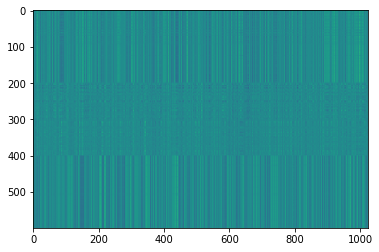

,AUC,pAUC
Source_0,0.744600,0.646842
Source_1,0.760200,0.663684
Source_2,0.822900,0.705263
Target_0,0.642100,0.658421
Target_1,0.756700,0.631053
Target_2,0.669600,0.520000
mean,0.732683,0.637544
h_mean,0.727625,0.631769


2021-06-01 20:51:45,403 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:213.239011, val_AUC_hmean:0.727625, val_pAUC_hmean:0.631769, best_flag:True
2021-06-01 20:51:45,404 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.75it/s]
2021-06-01 20:51:45,643 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 133.23it/s]
2021-06-01 20:51:45,685 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 117.47it/s]
2021-06-01 20:51:45,730 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:211.818099, val_AUC_hmean:0.726847, val_pAUC_hmean:0.621999, best_flag:False
2021-06-01 20:51:45,731 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.96it/s]
2021-06-01 20:51:45,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.19it/s]
2021-06-01 20:51:46,014 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.87it/s]
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 79.79it/s]
2021-06-01 20:51:51,329 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.11it/s]
2021-06-01 20:51:51,383 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:186.383163, val_AUC_hmean:0.722164, val_pAUC_hmean:0.625500, best_flag:False
2021-06-01 20:51:51,385 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.13it/s]
2021-06-01 20:51:51,627 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.38it/s]
2021-06-01 20:51:51,686 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 12.36it/s]
2021-06-01 20:51:51,890 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:185.470062, val_AUC_hmean:0.725173, val_pAUC_hmean:0.622549, best_flag:False
2021-06-01 20:51:51,891 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 43.76it/s]
2021-06-01 20:51:52,167 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-06-01 20:51:56,950 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.34it/s]
2021-06-01 20:51:57,135 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.76it/s]
2021-06-01 20:51:57,171 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.76it/s]
2021-06-01 20:51:57,218 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:163.068361, val_AUC_hmean:0.727358, val_pAUC_hmean:0.617467, best_flag:False
2021-06-01 20:51:57,220 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.56it/s]
2021-06-01 20:51:57,426 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.81it/s]
2021-06-01 20:51:57,464 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 141.26it/s]
2021-06-01 20:51:57,502 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:161.659512, val_AUC_hmean:0.722286, val_pAUC_hmean:0.614487, best_flag:False
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 73.46it/s]
2021-06-01 20:52:02,340 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:142.695517, val_AUC_hmean:0.726727, val_pAUC_hmean:0.623238, best_flag:False
2021-06-01 20:52:02,341 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.92it/s]
2021-06-01 20:52:02,610 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.34it/s]
2021-06-01 20:52:02,656 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.59it/s]
2021-06-01 20:52:02,700 - pytorch_modeler.py - INFO - epoch:155/300, train_losses:141.269489, val_AUC_hmean:0.724215, val_pAUC_hmean:0.619925, best_flag:False
2021-06-01 20:52:02,702 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 28.72it/s]
2021-06-01 20:52:03,124 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.34it/s]
2021-06-01 20:52:03,168 - pytorch_modeler.py - INFO - valid_target
100%|██████

100%|██████████| 12/12 [00:00<00:00, 48.94it/s]
2021-06-01 20:52:08,924 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.46it/s]
2021-06-01 20:52:08,968 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.46it/s]
2021-06-01 20:52:09,026 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:124.273034, val_AUC_hmean:0.729953, val_pAUC_hmean:0.629735, best_flag:False
2021-06-01 20:52:09,027 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.61it/s]
2021-06-01 20:52:09,271 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.74it/s]
2021-06-01 20:52:09,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.37it/s]
2021-06-01 20:52:09,372 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:121.671272, val_AUC_hmean:0.727539, val_pAUC_hmean:0.618472, best_flag:False
2021-06-01 20:52:09,373 - pytorch_modeler.py - INFO - train
100%|█████████

2021-06-01 20:52:15,197 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.02it/s]
2021-06-01 20:52:15,473 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.24it/s]
2021-06-01 20:52:15,524 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.56it/s]
2021-06-01 20:52:15,578 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:106.424334, val_AUC_hmean:0.729131, val_pAUC_hmean:0.621218, best_flag:False
2021-06-01 20:52:15,579 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.82it/s]
2021-06-01 20:52:15,832 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.52it/s]
2021-06-01 20:52:15,893 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.23it/s]
2021-06-01 20:52:15,949 - pytorch_modeler.py - INFO - epoch:189/300, train_losses:105.035620, val_AUC_hmean:0.718108, val_pAUC_hmean:0.615080, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 99.97it/s]
2021-06-01 20:52:20,861 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:90.669515, val_AUC_hmean:0.734899, val_pAUC_hmean:0.628851, best_flag:False
2021-06-01 20:52:20,863 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 57.77it/s]
2021-06-01 20:52:21,074 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 119.48it/s]
2021-06-01 20:52:21,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 112.50it/s]
2021-06-01 20:52:21,159 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:90.641104, val_AUC_hmean:0.733361, val_pAUC_hmean:0.622257, best_flag:False
2021-06-01 20:52:21,160 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.85it/s]
2021-06-01 20:52:21,403 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.37it/s]
2021-06-01 20:52:21,464 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 43.66it/s]
2021-06-01 20:52:26,840 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.02it/s]
2021-06-01 20:52:26,894 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.29it/s]
2021-06-01 20:52:26,935 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:77.518583, val_AUC_hmean:0.723340, val_pAUC_hmean:0.613430, best_flag:False
2021-06-01 20:52:26,938 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.72it/s]
2021-06-01 20:52:27,192 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.50it/s]
2021-06-01 20:52:27,230 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 142.17it/s]
2021-06-01 20:52:27,269 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:77.013386, val_AUC_hmean:0.723738, val_pAUC_hmean:0.608373, best_flag:False
2021-06-01 20:52:27,270 - pytorch_modeler.py - INFO - train
100%|████████

2021-06-01 20:52:32,563 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.93it/s]
2021-06-01 20:52:32,810 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.44it/s]
2021-06-01 20:52:32,864 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.65it/s]
2021-06-01 20:52:32,918 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:65.354711, val_AUC_hmean:0.727404, val_pAUC_hmean:0.616350, best_flag:False
2021-06-01 20:52:32,919 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.21it/s]
2021-06-01 20:52:33,175 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 130.88it/s]
2021-06-01 20:52:33,217 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.45it/s]
2021-06-01 20:52:33,268 - pytorch_modeler.py - INFO - epoch:239/300, train_losses:64.887457, val_AUC_hmean:0.731076, val_pAUC_hmean:0.620427, best_flag:False
2021-06-01 20:5

100%|██████████| 2/2 [00:00<00:00, 74.08it/s]
2021-06-01 20:52:38,571 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:55.816012, val_AUC_hmean:0.724079, val_pAUC_hmean:0.609631, best_flag:False
2021-06-01 20:52:38,572 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.11it/s]
2021-06-01 20:52:38,835 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 118.85it/s]
2021-06-01 20:52:38,879 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.40it/s]
2021-06-01 20:52:38,924 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:54.746475, val_AUC_hmean:0.722714, val_pAUC_hmean:0.613790, best_flag:False
2021-06-01 20:52:38,925 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.68it/s]
2021-06-01 20:52:39,184 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.79it/s]
2021-06-01 20:52:39,245 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 2/2 [00:00<00:00, 69.93it/s]
2021-06-01 20:52:44,528 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.85it/s]
2021-06-01 20:52:44,571 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:48.682045, val_AUC_hmean:0.735144, val_pAUC_hmean:0.601204, best_flag:False
2021-06-01 20:52:44,572 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.56it/s]
2021-06-01 20:52:44,821 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.14it/s]
2021-06-01 20:52:44,871 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 126.12it/s]
2021-06-01 20:52:44,926 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:48.072652, val_AUC_hmean:0.732246, val_pAUC_hmean:0.608563, best_flag:False
2021-06-01 20:52:44,927 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 33.09it/s]
2021-06-01 20:52:45,292 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-06-01 20:52:49,804 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 57.43it/s]
2021-06-01 20:52:50,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.42it/s]
2021-06-01 20:52:50,052 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 141.55it/s]
2021-06-01 20:52:50,091 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:39.319653, val_AUC_hmean:0.720499, val_pAUC_hmean:0.610908, best_flag:False
2021-06-01 20:52:50,092 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.82it/s]
2021-06-01 20:52:50,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 122.15it/s]
2021-06-01 20:52:50,346 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 114.59it/s]
2021-06-01 20:52:50,387 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:37.961691, val_AUC_hmean:0.727368, val_pAUC_hmean:0.612928, best_flag:False
2021-06-01 2

,AUC,pAUC
Source_0,0.744600,0.646842
Source_1,0.760200,0.663684
Source_2,0.822900,0.705263
Target_0,0.642100,0.658421
Target_1,0.756700,0.631053
Target_2,0.669600,0.520000
mean,0.732683,0.637544
h_mean,0.727625,0.631769


2021-06-01 20:52:53,620 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-06-01 20:52:53,621 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:52:53,623 - 00_train.py - INFO - TRAINING


elapsed time: 141.165104151 [sec]


2021-06-01 20:52:54,012 - pytorch_modeler.py - INFO - train
 58%|█████▊    | 7/12 [00:00<00:00, 67.86it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 64.61it/s]
2021-06-01 20:52:54,200 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 149.10it/s]
2021-06-01 20:52:54,232 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 147.43it/s]


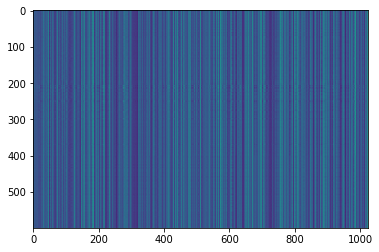

,AUC,pAUC
Source_0,0.530100,0.533684
Source_1,0.581600,0.524211
Source_2,0.635500,0.522632
Target_0,0.484300,0.544737
Target_1,0.637900,0.582105
Target_2,0.510600,0.494211
mean,0.563333,0.533596
h_mean,0.557085,0.532298


2021-06-01 20:52:56,098 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1284.314087, val_AUC_hmean:0.557085, val_pAUC_hmean:0.532298, best_flag:True
2021-06-01 20:52:56,099 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.87it/s]
2021-06-01 20:52:56,306 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 143.78it/s]
2021-06-01 20:52:56,341 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 148.05it/s]


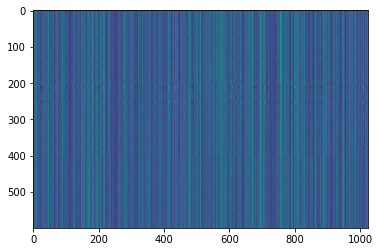

,AUC,pAUC
Source_0,0.548800,0.554737
Source_1,0.587000,0.547895
Source_2,0.660900,0.552632
Target_0,0.514300,0.585263
Target_1,0.670500,0.569474
Target_2,0.593200,0.492632
mean,0.595783,0.550439
h_mean,0.590527,0.548852


2021-06-01 20:52:58,238 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:874.294134, val_AUC_hmean:0.590527, val_pAUC_hmean:0.548852, best_flag:True
2021-06-01 20:52:58,239 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 41.78it/s]
2021-06-01 20:52:58,528 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 157.21it/s]
2021-06-01 20:52:58,558 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.73it/s]


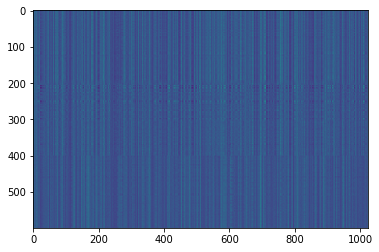

,AUC,pAUC
Source_0,0.560800,0.563158
Source_1,0.591900,0.541579
Source_2,0.678000,0.567895
Target_0,0.546000,0.598421
Target_1,0.654200,0.562105
Target_2,0.603400,0.516316
mean,0.605717,0.558246
h_mean,0.602112,0.557107


2021-06-01 20:53:00,264 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:679.184189, val_AUC_hmean:0.602112, val_pAUC_hmean:0.557107, best_flag:True
2021-06-01 20:53:00,265 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.07it/s]
2021-06-01 20:53:00,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 152.71it/s]
2021-06-01 20:53:00,480 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 154.60it/s]


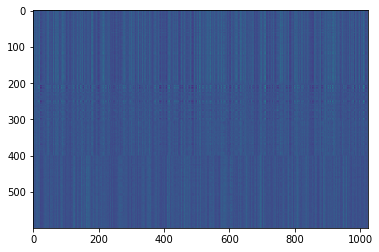

,AUC,pAUC
Source_0,0.567700,0.588947
Source_1,0.630200,0.557895
Source_2,0.728200,0.575789
Target_0,0.555100,0.619474
Target_1,0.677100,0.560000
Target_2,0.638600,0.503158
mean,0.632817,0.567544
h_mean,0.627233,0.565260


2021-06-01 20:53:02,349 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:582.665426, val_AUC_hmean:0.627233, val_pAUC_hmean:0.565260, best_flag:True
2021-06-01 20:53:02,350 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.99it/s]
2021-06-01 20:53:02,549 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.84it/s]
2021-06-01 20:53:02,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 142.10it/s]


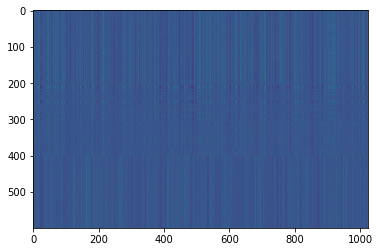

,AUC,pAUC
Source_0,0.576700,0.585789
Source_1,0.634100,0.570000
Source_2,0.767500,0.578421
Target_0,0.553900,0.621579
Target_1,0.680400,0.564211
Target_2,0.654500,0.498947
mean,0.644517,0.569825
h_mean,0.637148,0.567336


2021-06-01 20:53:04,580 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:532.334391, val_AUC_hmean:0.637148, val_pAUC_hmean:0.567336, best_flag:True
2021-06-01 20:53:04,581 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.21it/s]
2021-06-01 20:53:04,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 138.48it/s]
2021-06-01 20:53:04,827 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.96it/s]


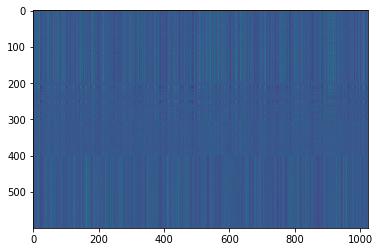

,AUC,pAUC
Source_0,0.586800,0.590000
Source_1,0.666800,0.563684
Source_2,0.808000,0.633158
Target_0,0.562900,0.628421
Target_1,0.679700,0.567368
Target_2,0.653700,0.504211
mean,0.659650,0.581140
h_mean,0.650831,0.577731


2021-06-01 20:53:06,829 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:504.120893, val_AUC_hmean:0.650831, val_pAUC_hmean:0.577731, best_flag:True
2021-06-01 20:53:06,830 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.49it/s]
2021-06-01 20:53:07,034 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 133.38it/s]
2021-06-01 20:53:07,069 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 140.10it/s]
2021-06-01 20:53:07,114 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:483.272471, val_AUC_hmean:0.651643, val_pAUC_hmean:0.577499, best_flag:False
2021-06-01 20:53:07,116 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 57.10it/s]
2021-06-01 20:53:07,328 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.50it/s]
2021-06-01 20:53:07,366 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.93it/s]


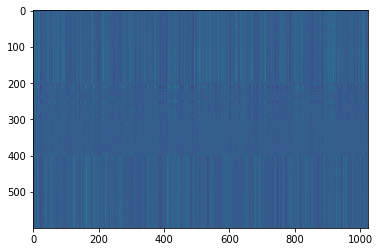

,AUC,pAUC
Source_0,0.592300,0.591053
Source_1,0.687300,0.595789
Source_2,0.804500,0.631053
Target_0,0.568400,0.637895
Target_1,0.693500,0.587895
Target_2,0.700100,0.511053
mean,0.674350,0.592456
h_mean,0.665486,0.589369


2021-06-01 20:53:09,449 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:471.003253, val_AUC_hmean:0.665486, val_pAUC_hmean:0.589369, best_flag:True
2021-06-01 20:53:09,450 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.03it/s]
2021-06-01 20:53:09,683 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 123.72it/s]
2021-06-01 20:53:09,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 118.62it/s]
2021-06-01 20:53:09,766 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:458.238813, val_AUC_hmean:0.650408, val_pAUC_hmean:0.585525, best_flag:False
2021-06-01 20:53:09,767 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 59.81it/s]
2021-06-01 20:53:09,971 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 150.89it/s]
2021-06-01 20:53:10,009 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.31it/s]
2021-06-01 20:5

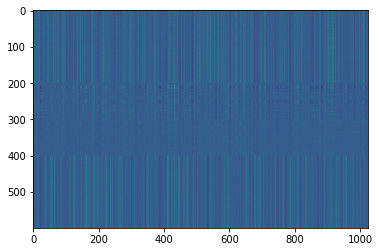

,AUC,pAUC
Source_0,0.618400,0.610526
Source_1,0.700000,0.583158
Source_2,0.815200,0.664737
Target_0,0.588800,0.645789
Target_1,0.700600,0.590000
Target_2,0.672600,0.502632
mean,0.682600,0.599474
h_mean,0.675309,0.594647


2021-06-01 20:53:14,206 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:441.724854, val_AUC_hmean:0.675309, val_pAUC_hmean:0.594647, best_flag:True
2021-06-01 20:53:14,217 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.43it/s]
2021-06-01 20:53:14,483 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.35it/s]
2021-06-01 20:53:14,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 136.50it/s]


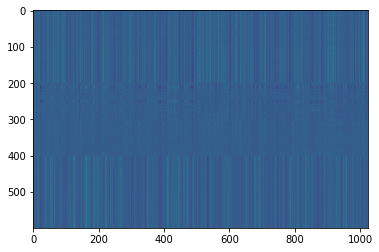

,AUC,pAUC
Source_0,0.626500,0.615263
Source_1,0.711100,0.611053
Source_2,0.828200,0.677368
Target_0,0.590200,0.641579
Target_1,0.701600,0.590000
Target_2,0.696100,0.513158
mean,0.692283,0.608070
h_mean,0.684454,0.603596


2021-06-01 20:53:16,377 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:434.126714, val_AUC_hmean:0.684454, val_pAUC_hmean:0.603596, best_flag:True
2021-06-01 20:53:16,378 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.15it/s]
2021-06-01 20:53:16,629 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.45it/s]
2021-06-01 20:53:16,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.44it/s]
2021-06-01 20:53:16,732 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:432.435109, val_AUC_hmean:0.682982, val_pAUC_hmean:0.590842, best_flag:False
2021-06-01 20:53:16,733 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.43it/s]
2021-06-01 20:53:16,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 150.83it/s]
2021-06-01 20:53:17,000 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 143.91it/s]


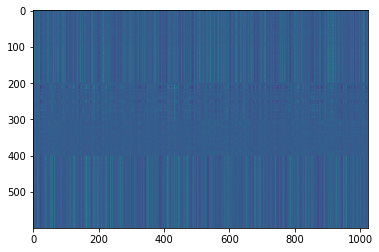

,AUC,pAUC
Source_0,0.641000,0.620000
Source_1,0.691800,0.585789
Source_2,0.812600,0.701579
Target_0,0.604900,0.651579
Target_1,0.709600,0.603158
Target_2,0.694800,0.517368
mean,0.692450,0.613246
h_mean,0.686667,0.607848


2021-06-01 20:53:19,695 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:425.437749, val_AUC_hmean:0.686667, val_pAUC_hmean:0.607848, best_flag:True
2021-06-01 20:53:19,696 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 68.94it/s]
2021-06-01 20:53:19,872 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 132.18it/s]
2021-06-01 20:53:19,909 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 156.96it/s]
2021-06-01 20:53:19,945 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:421.077977, val_AUC_hmean:0.686716, val_pAUC_hmean:0.597788, best_flag:False
2021-06-01 20:53:19,949 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.33it/s]
2021-06-01 20:53:20,158 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.09it/s]
2021-06-01 20:53:20,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 134.30it/s]


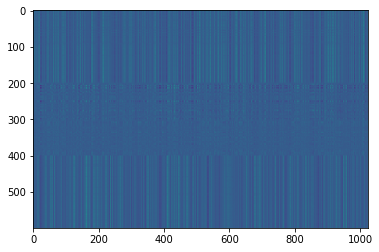

,AUC,pAUC
Source_0,0.662500,0.627368
Source_1,0.721000,0.607368
Source_2,0.833200,0.678421
Target_0,0.619600,0.650526
Target_1,0.719600,0.597895
Target_2,0.692000,0.518421
mean,0.707983,0.613333
h_mean,0.702142,0.608945


2021-06-01 20:53:23,908 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:415.078295, val_AUC_hmean:0.702142, val_pAUC_hmean:0.608945, best_flag:True
2021-06-01 20:53:23,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 41.03it/s]
2021-06-01 20:53:24,212 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.60it/s]
2021-06-01 20:53:24,273 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.61it/s]


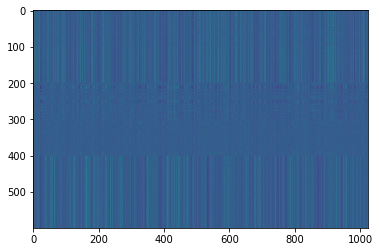

,AUC,pAUC
Source_0,0.655900,0.618421
Source_1,0.733300,0.626316
Source_2,0.826300,0.676316
Target_0,0.618100,0.654737
Target_1,0.718000,0.591579
Target_2,0.699600,0.529474
mean,0.708533,0.616140
h_mean,0.702696,0.612329


2021-06-01 20:53:27,771 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:408.878456, val_AUC_hmean:0.702696, val_pAUC_hmean:0.612329, best_flag:True
2021-06-01 20:53:27,772 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.80it/s]
2021-06-01 20:53:27,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 148.82it/s]
2021-06-01 20:53:27,989 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 139.34it/s]
2021-06-01 20:53:28,029 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:404.554815, val_AUC_hmean:0.699133, val_pAUC_hmean:0.609766, best_flag:False
2021-06-01 20:53:28,030 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 57.65it/s]
2021-06-01 20:53:28,241 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 119.00it/s]
2021-06-01 20:53:28,280 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 122.17it/s]


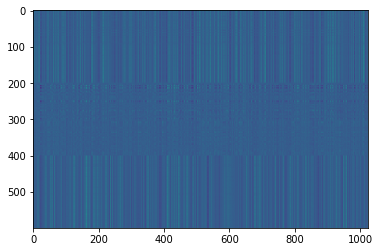

,AUC,pAUC
Source_0,0.666400,0.624737
Source_1,0.723900,0.620000
Source_2,0.838800,0.697895
Target_0,0.614800,0.652105
Target_1,0.712500,0.590000
Target_2,0.691500,0.522632
mean,0.707983,0.617895
h_mean,0.701724,0.612979


2021-06-01 20:53:32,092 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:400.555941, val_AUC_hmean:0.701724, val_pAUC_hmean:0.612979, best_flag:True
2021-06-01 20:53:32,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.62it/s]
2021-06-01 20:53:32,348 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.20it/s]
2021-06-01 20:53:32,398 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.23it/s]


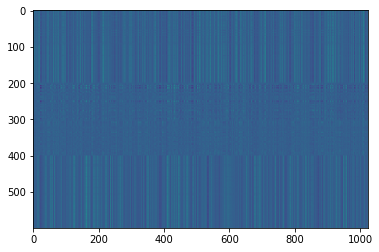

,AUC,pAUC
Source_0,0.667800,0.622632
Source_1,0.745800,0.648421
Source_2,0.838200,0.713684
Target_0,0.622800,0.644737
Target_1,0.728400,0.590526
Target_2,0.693000,0.519474
mean,0.716000,0.623246
h_mean,0.709819,0.617352


2021-06-01 20:53:35,789 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:396.749700, val_AUC_hmean:0.709819, val_pAUC_hmean:0.617352, best_flag:True
2021-06-01 20:53:35,792 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 30.43it/s]
2021-06-01 20:53:36,194 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.01it/s]
2021-06-01 20:53:36,253 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 113.07it/s]
2021-06-01 20:53:36,307 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:392.100858, val_AUC_hmean:0.704310, val_pAUC_hmean:0.616078, best_flag:False
2021-06-01 20:53:36,309 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.80it/s]
2021-06-01 20:53:36,551 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.19it/s]
2021-06-01 20:53:36,611 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.39it/s]
2021-06-01 20:5

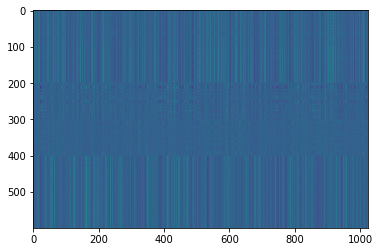

,AUC,pAUC
Source_0,0.674400,0.631579
Source_1,0.755600,0.649474
Source_2,0.812500,0.691053
Target_0,0.630100,0.656316
Target_1,0.744200,0.610000
Target_2,0.687900,0.531053
mean,0.717450,0.628246
h_mean,0.712463,0.623949


2021-06-01 20:53:40,224 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:386.356046, val_AUC_hmean:0.712463, val_pAUC_hmean:0.623949, best_flag:True
2021-06-01 20:53:40,226 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.29it/s]
2021-06-01 20:53:40,483 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.89it/s]
2021-06-01 20:53:40,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.97it/s]
2021-06-01 20:53:40,585 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:383.448374, val_AUC_hmean:0.711322, val_pAUC_hmean:0.617798, best_flag:False
2021-06-01 20:53:40,586 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.39it/s]
2021-06-01 20:53:40,847 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.37it/s]
2021-06-01 20:53:40,892 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.73it/s]


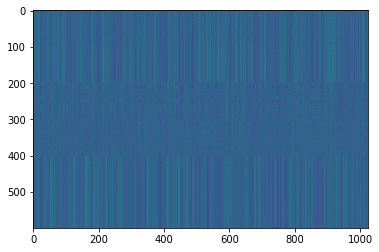

,AUC,pAUC
Source_0,0.667500,0.625263
Source_1,0.751500,0.666842
Source_2,0.816800,0.702632
Target_0,0.615300,0.649474
Target_1,0.756300,0.626316
Target_2,0.711400,0.537368
mean,0.719800,0.634649
h_mean,0.713757,0.630290


2021-06-01 20:53:42,885 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:379.926531, val_AUC_hmean:0.713757, val_pAUC_hmean:0.630290, best_flag:True
2021-06-01 20:53:42,886 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.11it/s]
2021-06-01 20:53:43,149 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.35it/s]
2021-06-01 20:53:43,206 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.31it/s]
2021-06-01 20:53:43,254 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:375.666763, val_AUC_hmean:0.722498, val_pAUC_hmean:0.628233, best_flag:False
2021-06-01 20:53:43,255 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 41.41it/s]
2021-06-01 20:53:43,547 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 126.97it/s]
2021-06-01 20:53:43,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 144.50it/s]
2021-06-01 20:

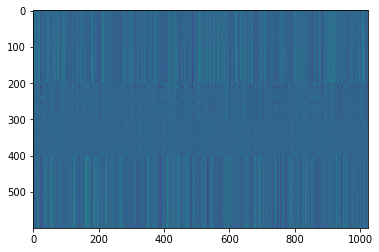

,AUC,pAUC
Source_0,0.701600,0.635789
Source_1,0.766300,0.661053
Source_2,0.827200,0.701579
Target_0,0.645000,0.664211
Target_1,0.753000,0.623158
Target_2,0.705800,0.542105
mean,0.733150,0.637982
h_mean,0.728648,0.633856


2021-06-01 20:53:46,748 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:361.040321, val_AUC_hmean:0.728648, val_pAUC_hmean:0.633856, best_flag:True
2021-06-01 20:53:46,749 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.07it/s]
2021-06-01 20:53:46,981 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.82it/s]
2021-06-01 20:53:47,025 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.41it/s]
2021-06-01 20:53:47,070 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:358.464081, val_AUC_hmean:0.715101, val_pAUC_hmean:0.620002, best_flag:False
2021-06-01 20:53:47,072 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.51it/s]
2021-06-01 20:53:47,316 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.18it/s]
2021-06-01 20:53:47,355 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.96it/s]
2021-06-01 20:53

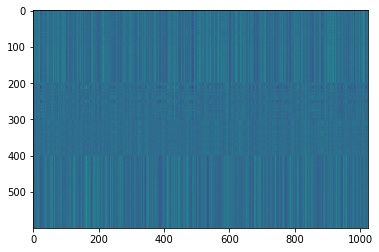

,AUC,pAUC
Source_0,0.689900,0.637368
Source_1,0.767000,0.674737
Source_2,0.824800,0.713684
Target_0,0.614500,0.657368
Target_1,0.785800,0.641579
Target_2,0.709500,0.541579
mean,0.731917,0.644386
h_mean,0.725071,0.639760


2021-06-01 20:53:52,197 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:331.728086, val_AUC_hmean:0.725071, val_pAUC_hmean:0.639760, best_flag:True
2021-06-01 20:53:52,198 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.24it/s]
2021-06-01 20:53:52,446 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.07it/s]
2021-06-01 20:53:52,486 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.69it/s]
2021-06-01 20:53:52,534 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:329.669334, val_AUC_hmean:0.730807, val_pAUC_hmean:0.622816, best_flag:False
2021-06-01 20:53:52,535 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.27it/s]
2021-06-01 20:53:52,767 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.29it/s]
2021-06-01 20:53:52,824 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.82it/s]
2021-06-01 20:53:

100%|██████████| 2/2 [00:00<00:00, 88.96it/s]
2021-06-01 20:53:58,017 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.54it/s]
2021-06-01 20:53:58,067 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:292.202311, val_AUC_hmean:0.728677, val_pAUC_hmean:0.626088, best_flag:False
2021-06-01 20:53:58,069 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.75it/s]
2021-06-01 20:53:58,312 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 91.79it/s]
2021-06-01 20:53:58,352 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.96it/s]
2021-06-01 20:53:58,404 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:290.686188, val_AUC_hmean:0.727492, val_pAUC_hmean:0.632470, best_flag:False
2021-06-01 20:53:58,405 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 47.94it/s]
2021-06-01 20:53:58,658 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

2021-06-01 20:54:03,581 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.20it/s]
2021-06-01 20:54:03,827 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.53it/s]
2021-06-01 20:54:03,866 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.52it/s]
2021-06-01 20:54:03,905 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:258.544174, val_AUC_hmean:0.722573, val_pAUC_hmean:0.630955, best_flag:False
2021-06-01 20:54:03,906 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.07it/s]
2021-06-01 20:54:04,152 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.67it/s]
2021-06-01 20:54:04,196 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 125.76it/s]
2021-06-01 20:54:04,233 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:256.922958, val_AUC_hmean:0.730940, val_pAUC_hmean:0.624563, best_flag:False
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 90.92it/s]
2021-06-01 20:54:09,237 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:228.907352, val_AUC_hmean:0.730648, val_pAUC_hmean:0.625034, best_flag:False
2021-06-01 20:54:09,238 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.49it/s]
2021-06-01 20:54:09,482 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.62it/s]
2021-06-01 20:54:09,522 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.51it/s]
2021-06-01 20:54:09,570 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:226.714246, val_AUC_hmean:0.737760, val_pAUC_hmean:0.630220, best_flag:False
2021-06-01 20:54:09,571 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.49it/s]
2021-06-01 20:54:09,811 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.18it/s]
2021-06-01 20:54:09,861 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 46.89it/s]
2021-06-01 20:54:14,920 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.21it/s]
2021-06-01 20:54:14,954 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 130.59it/s]
2021-06-01 20:54:14,992 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:200.115667, val_AUC_hmean:0.741130, val_pAUC_hmean:0.622765, best_flag:False
2021-06-01 20:54:14,993 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.98it/s]
2021-06-01 20:54:15,257 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.68it/s]
2021-06-01 20:54:15,294 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.10it/s]
2021-06-01 20:54:15,351 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:199.116756, val_AUC_hmean:0.737017, val_pAUC_hmean:0.629460, best_flag:False
2021-06-01 20:54:15,353 - pytorch_modeler.py - INFO - train
100%|██████

2021-06-01 20:54:20,394 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.58it/s]
2021-06-01 20:54:20,654 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.08it/s]
2021-06-01 20:54:20,705 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.25it/s]
2021-06-01 20:54:20,766 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:174.971663, val_AUC_hmean:0.731809, val_pAUC_hmean:0.628851, best_flag:False
2021-06-01 20:54:20,767 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.79it/s]
2021-06-01 20:54:21,026 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 150.93it/s]
2021-06-01 20:54:21,061 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.94it/s]
2021-06-01 20:54:21,106 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:173.059713, val_AUC_hmean:0.740550, val_pAUC_hmean:0.629505, best_flag:False
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 68.77it/s]
2021-06-01 20:54:26,288 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:153.254607, val_AUC_hmean:0.744783, val_pAUC_hmean:0.632754, best_flag:False
2021-06-01 20:54:26,289 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.47it/s]
2021-06-01 20:54:26,529 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.73it/s]
2021-06-01 20:54:26,573 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.62it/s]
2021-06-01 20:54:26,622 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:152.073371, val_AUC_hmean:0.736981, val_pAUC_hmean:0.625534, best_flag:False
2021-06-01 20:54:26,624 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.83it/s]
2021-06-01 20:54:26,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.44it/s]
2021-06-01 20:54:26,903 - pytorch_modeler.py - INFO - valid_target
100%|████████

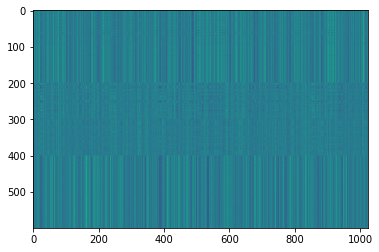

,AUC,pAUC
Source_0,0.776900,0.645263
Source_1,0.777700,0.664737
Source_2,0.849400,0.710000
Target_0,0.638500,0.648421
Target_1,0.824000,0.654737
Target_2,0.669100,0.542632
mean,0.755933,0.644298
h_mean,0.747699,0.640002


2021-06-01 20:54:30,900 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:142.377822, val_AUC_hmean:0.747699, val_pAUC_hmean:0.640002, best_flag:True
2021-06-01 20:54:30,901 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.11it/s]
2021-06-01 20:54:31,138 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.63it/s]
2021-06-01 20:54:31,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.09it/s]
2021-06-01 20:54:31,223 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:142.052879, val_AUC_hmean:0.731370, val_pAUC_hmean:0.619696, best_flag:False
2021-06-01 20:54:31,224 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.31it/s]
2021-06-01 20:54:31,455 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 129.98it/s]
2021-06-01 20:54:31,490 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 132.55it/s]
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 62.89it/s]
2021-06-01 20:54:36,558 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.49it/s]
2021-06-01 20:54:36,610 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:123.243450, val_AUC_hmean:0.743163, val_pAUC_hmean:0.622222, best_flag:False
2021-06-01 20:54:36,612 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 48.62it/s]
2021-06-01 20:54:36,860 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.79it/s]
2021-06-01 20:54:36,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.30it/s]
2021-06-01 20:54:36,968 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:122.069197, val_AUC_hmean:0.743038, val_pAUC_hmean:0.625418, best_flag:False
2021-06-01 20:54:36,969 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.12it/s]
2021-06-01 20:54:37,243 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-06-01 20:54:42,271 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.64it/s]
2021-06-01 20:54:42,534 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.02it/s]
2021-06-01 20:54:42,598 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.69it/s]
2021-06-01 20:54:42,651 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:104.665699, val_AUC_hmean:0.734059, val_pAUC_hmean:0.622844, best_flag:False
2021-06-01 20:54:42,653 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.13it/s]
2021-06-01 20:54:42,899 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.41it/s]
2021-06-01 20:54:42,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.10it/s]
2021-06-01 20:54:42,993 - pytorch_modeler.py - INFO - epoch:186/300, train_losses:103.831628, val_AUC_hmean:0.731866, val_pAUC_hmean:0.622203, best_flag:False
2021-06-01 20:

100%|██████████| 2/2 [00:00<00:00, 122.31it/s]
2021-06-01 20:54:48,298 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:90.663976, val_AUC_hmean:0.735669, val_pAUC_hmean:0.616669, best_flag:False
2021-06-01 20:54:48,299 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.78it/s]
2021-06-01 20:54:48,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.90it/s]
2021-06-01 20:54:48,608 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 144.99it/s]
2021-06-01 20:54:48,644 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:89.164070, val_AUC_hmean:0.732035, val_pAUC_hmean:0.618838, best_flag:False
2021-06-01 20:54:48,646 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.41it/s]
2021-06-01 20:54:48,892 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.74it/s]
2021-06-01 20:54:48,938 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 49.10it/s]
2021-06-01 20:54:54,019 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 89.58it/s]
2021-06-01 20:54:54,061 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.11it/s]
2021-06-01 20:54:54,105 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:77.511773, val_AUC_hmean:0.742947, val_pAUC_hmean:0.623149, best_flag:False
2021-06-01 20:54:54,106 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 50.78it/s]
2021-06-01 20:54:54,344 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.17it/s]
2021-06-01 20:54:54,393 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.16it/s]
2021-06-01 20:54:54,442 - pytorch_modeler.py - INFO - epoch:219/300, train_losses:75.555255, val_AUC_hmean:0.742585, val_pAUC_hmean:0.614022, best_flag:False
2021-06-01 20:54:54,443 - pytorch_modeler.py - INFO - train
100%|██████████

2021-06-01 20:54:59,810 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 53.15it/s]
2021-06-01 20:55:00,038 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 117.10it/s]
2021-06-01 20:55:00,077 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 124.02it/s]
2021-06-01 20:55:00,121 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:86.978922, val_AUC_hmean:0.719975, val_pAUC_hmean:0.586355, best_flag:False
2021-06-01 20:55:00,124 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.43it/s]
2021-06-01 20:55:00,396 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.36it/s]
2021-06-01 20:55:00,433 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.85it/s]
2021-06-01 20:55:00,484 - pytorch_modeler.py - INFO - epoch:236/300, train_losses:73.986734, val_AUC_hmean:0.686742, val_pAUC_hmean:0.589877, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 94.32it/s]
2021-06-01 20:55:05,621 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:54.577284, val_AUC_hmean:0.743093, val_pAUC_hmean:0.620362, best_flag:False
2021-06-01 20:55:05,622 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.38it/s]
2021-06-01 20:55:05,858 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.86it/s]
2021-06-01 20:55:05,910 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.62it/s]
2021-06-01 20:55:05,958 - pytorch_modeler.py - INFO - epoch:252/300, train_losses:53.686931, val_AUC_hmean:0.731227, val_pAUC_hmean:0.610962, best_flag:False
2021-06-01 20:55:05,959 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.06it/s]
2021-06-01 20:55:06,209 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 109.89it/s]
2021-06-01 20:55:06,250 - pytorch_modeler.py - INFO - valid_target
100%|██████████

100%|██████████| 12/12 [00:00<00:00, 46.03it/s]
2021-06-01 20:55:11,423 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 124.79it/s]
2021-06-01 20:55:11,465 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.46it/s]
2021-06-01 20:55:11,524 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:45.392969, val_AUC_hmean:0.731505, val_pAUC_hmean:0.615101, best_flag:False
2021-06-01 20:55:11,526 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.30it/s]
2021-06-01 20:55:11,787 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.01it/s]
2021-06-01 20:55:11,826 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.16it/s]
2021-06-01 20:55:11,877 - pytorch_modeler.py - INFO - epoch:269/300, train_losses:44.564374, val_AUC_hmean:0.731478, val_pAUC_hmean:0.616112, best_flag:False
2021-06-01 20:55:11,878 - pytorch_modeler.py - INFO - train
100%|█████████

2021-06-01 20:55:17,166 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 49.00it/s]
2021-06-01 20:55:17,413 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.05it/s]
2021-06-01 20:55:17,462 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.36it/s]
2021-06-01 20:55:17,508 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:37.907208, val_AUC_hmean:0.725239, val_pAUC_hmean:0.615910, best_flag:False
2021-06-01 20:55:17,508 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 46.48it/s]
2021-06-01 20:55:17,769 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.08it/s]
2021-06-01 20:55:17,819 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.75it/s]
2021-06-01 20:55:17,867 - pytorch_modeler.py - INFO - epoch:286/300, train_losses:37.979098, val_AUC_hmean:0.724240, val_pAUC_hmean:0.611618, best_flag:False
2021-06-01 20:55

,AUC,pAUC
Source_0,0.776900,0.645263
Source_1,0.777700,0.664737
Source_2,0.849400,0.710000
Target_0,0.638500,0.648421
Target_1,0.824000,0.654737
Target_2,0.669100,0.542632
mean,0.755933,0.644298
h_mean,0.747699,0.640002


2021-06-01 20:55:22,976 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-06-01 20:55:22,978 - 00_train.py - INFO - MAKE DATA_LOADER
2021-06-01 20:55:22,996 - 00_train.py - INFO - TRAINING


elapsed time: 149.355453730 [sec]


2021-06-01 20:55:23,599 - pytorch_modeler.py - INFO - train
 42%|████▏     | 5/12 [00:00<00:00, 41.79it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 42.07it/s]
2021-06-01 20:55:23,892 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.96it/s]
2021-06-01 20:55:23,961 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.28it/s]


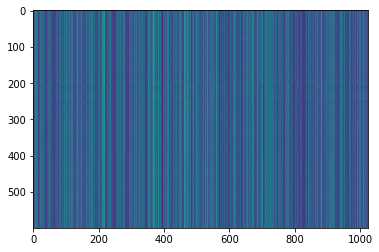

,AUC,pAUC
Source_0,0.518900,0.542105
Source_1,0.561200,0.533158
Source_2,0.565400,0.539474
Target_0,0.484400,0.543158
Target_1,0.661500,0.582632
Target_2,0.525900,0.483684
mean,0.552883,0.537368
h_mean,0.547678,0.535770


2021-06-01 20:55:26,161 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:1263.499624, val_AUC_hmean:0.547678, val_pAUC_hmean:0.535770, best_flag:True
2021-06-01 20:55:26,162 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 44.65it/s]
2021-06-01 20:55:26,433 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.25it/s]
2021-06-01 20:55:26,480 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.84it/s]


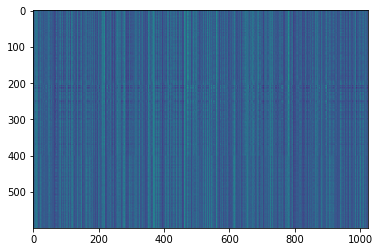

,AUC,pAUC
Source_0,0.546900,0.554211
Source_1,0.588300,0.549474
Source_2,0.651800,0.561579
Target_0,0.520500,0.586316
Target_1,0.678200,0.573684
Target_2,0.612700,0.494211
mean,0.599733,0.553246
h_mean,0.594627,0.551618


2021-06-01 20:55:28,187 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:861.496714, val_AUC_hmean:0.594627, val_pAUC_hmean:0.551618, best_flag:True
2021-06-01 20:55:28,188 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 45.68it/s]
2021-06-01 20:55:28,456 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 122.63it/s]
2021-06-01 20:55:28,496 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 120.43it/s]


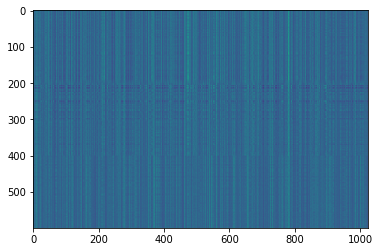

,AUC,pAUC
Source_0,0.567100,0.568947
Source_1,0.629200,0.571053
Source_2,0.629800,0.564211
Target_0,0.544600,0.594211
Target_1,0.681700,0.564737
Target_2,0.612800,0.500526
mean,0.610867,0.560614
h_mean,0.607566,0.559039


2021-06-01 20:55:30,195 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:661.607117, val_AUC_hmean:0.607566, val_pAUC_hmean:0.559039, best_flag:True
2021-06-01 20:55:30,196 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 51.43it/s]
2021-06-01 20:55:30,431 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.22it/s]
2021-06-01 20:55:30,473 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.06it/s]


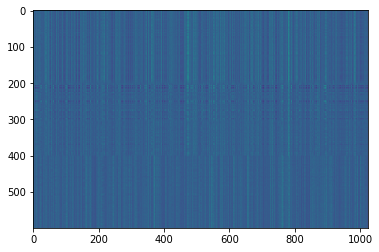

,AUC,pAUC
Source_0,0.562600,0.571053
Source_1,0.654900,0.575263
Source_2,0.676250,0.576842
Target_0,0.549200,0.609474
Target_1,0.678500,0.563684
Target_2,0.593900,0.499474
mean,0.619225,0.565965
h_mean,0.614653,0.563911


2021-06-01 20:55:31,978 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:564.856227, val_AUC_hmean:0.614653, val_pAUC_hmean:0.563911, best_flag:True
2021-06-01 20:55:31,979 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.07it/s]
2021-06-01 20:55:32,160 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.35it/s]
2021-06-01 20:55:32,194 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 157.36it/s]


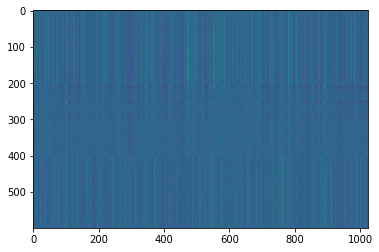

,AUC,pAUC
Source_0,0.572500,0.573158
Source_1,0.662200,0.580000
Source_2,0.745600,0.628947
Target_0,0.551700,0.615789
Target_1,0.685700,0.570000
Target_2,0.639900,0.497895
mean,0.642933,0.577632
h_mean,0.636150,0.574405


2021-06-01 20:55:33,616 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:512.924795, val_AUC_hmean:0.636150, val_pAUC_hmean:0.574405, best_flag:True
2021-06-01 20:55:33,617 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.31it/s]
2021-06-01 20:55:33,807 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 146.85it/s]
2021-06-01 20:55:33,838 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.53it/s]


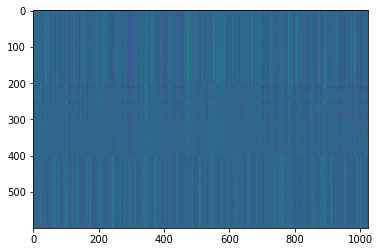

,AUC,pAUC
Source_0,0.576100,0.585789
Source_1,0.706900,0.602105
Source_2,0.773100,0.628421
Target_0,0.547400,0.622632
Target_1,0.701200,0.578421
Target_2,0.636400,0.505263
mean,0.656850,0.587105
h_mean,0.647374,0.584037


2021-06-01 20:55:35,450 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:483.889997, val_AUC_hmean:0.647374, val_pAUC_hmean:0.584037, best_flag:True
2021-06-01 20:55:35,451 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.96it/s]
2021-06-01 20:55:35,641 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.75it/s]
2021-06-01 20:55:35,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 148.57it/s]
2021-06-01 20:55:35,712 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:464.799436, val_AUC_hmean:0.647018, val_pAUC_hmean:0.583240, best_flag:False
2021-06-01 20:55:35,713 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.00it/s]
2021-06-01 20:55:35,915 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 110.40it/s]
2021-06-01 20:55:35,964 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 114.79it/s]


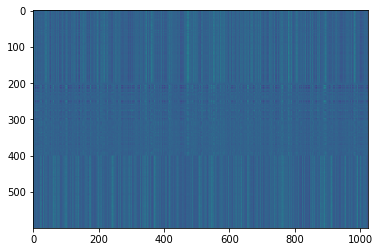

,AUC,pAUC
Source_0,0.567500,0.586842
Source_1,0.665800,0.577895
Source_2,0.805800,0.678947
Target_0,0.542700,0.627895
Target_1,0.681600,0.587895
Target_2,0.623200,0.503684
mean,0.647767,0.593860
h_mean,0.636979,0.589026


2021-06-01 20:55:38,018 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:449.882614, val_AUC_hmean:0.636979, val_pAUC_hmean:0.589026, best_flag:True
2021-06-01 20:55:38,019 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.62it/s]
2021-06-01 20:55:38,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.97it/s]
2021-06-01 20:55:38,263 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.17it/s]


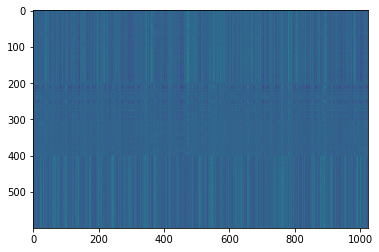

,AUC,pAUC
Source_0,0.580200,0.604737
Source_1,0.703000,0.588421
Source_2,0.791800,0.677895
Target_0,0.552400,0.634737
Target_1,0.697000,0.590000
Target_2,0.661000,0.513158
mean,0.664233,0.601491
h_mean,0.654534,0.597174


2021-06-01 20:55:39,793 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:439.371112, val_AUC_hmean:0.654534, val_pAUC_hmean:0.597174, best_flag:True
2021-06-01 20:55:39,793 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.24it/s]
2021-06-01 20:55:39,976 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 143.30it/s]
2021-06-01 20:55:40,011 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 127.90it/s]
2021-06-01 20:55:40,052 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:432.018667, val_AUC_hmean:0.650310, val_pAUC_hmean:0.595684, best_flag:False
2021-06-01 20:55:40,053 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.03it/s]
2021-06-01 20:55:40,235 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 131.45it/s]
2021-06-01 20:55:40,273 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 135.44it/s]
2021-06-01 20:

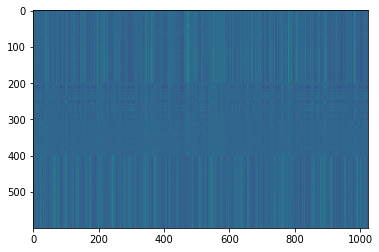

,AUC,pAUC
Source_0,0.598400,0.611579
Source_1,0.698200,0.606316
Source_2,0.808200,0.674737
Target_0,0.569500,0.641053
Target_1,0.704900,0.605789
Target_2,0.678600,0.522632
mean,0.676300,0.610351
h_mean,0.667491,0.606640


2021-06-01 20:55:42,324 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:416.082372, val_AUC_hmean:0.667491, val_pAUC_hmean:0.606640, best_flag:True
2021-06-01 20:55:42,325 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 52.92it/s]
2021-06-01 20:55:42,553 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.77it/s]
2021-06-01 20:55:42,591 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 118.62it/s]
2021-06-01 20:55:42,634 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:410.203186, val_AUC_hmean:0.674772, val_pAUC_hmean:0.598599, best_flag:False
2021-06-01 20:55:42,635 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.32it/s]
2021-06-01 20:55:42,843 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 121.72it/s]
2021-06-01 20:55:42,880 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 130.12it/s]
2021-06-01 20

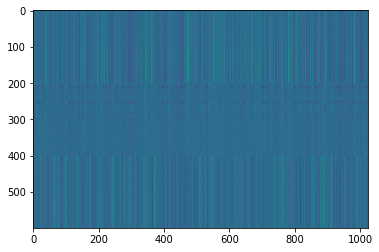

,AUC,pAUC
Source_0,0.622100,0.618421
Source_1,0.715500,0.609474
Source_2,0.811700,0.687368
Target_0,0.593500,0.637368
Target_1,0.708100,0.597368
Target_2,0.652600,0.523158
mean,0.683917,0.612193
h_mean,0.676701,0.608085


2021-06-01 20:55:44,721 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:398.363022, val_AUC_hmean:0.676701, val_pAUC_hmean:0.608085, best_flag:True
2021-06-01 20:55:44,722 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.02it/s]
2021-06-01 20:55:44,905 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.44it/s]
2021-06-01 20:55:44,937 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 164.61it/s]
2021-06-01 20:55:44,970 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:394.126404, val_AUC_hmean:0.676489, val_pAUC_hmean:0.604431, best_flag:False
2021-06-01 20:55:44,971 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 69.48it/s]
2021-06-01 20:55:45,145 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 154.81it/s]
2021-06-01 20:55:45,177 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 144.31it/s]
2021-06-01 20

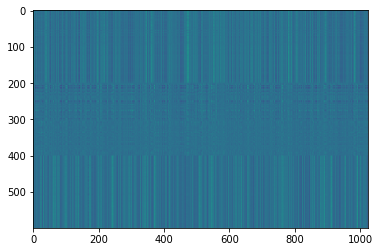

,AUC,pAUC
Source_0,0.630400,0.618421
Source_1,0.705900,0.611053
Source_2,0.809300,0.700526
Target_0,0.600800,0.642632
Target_1,0.717900,0.610000
Target_2,0.673200,0.522105
mean,0.689583,0.617456
h_mean,0.683262,0.612757


2021-06-01 20:55:47,107 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:385.979952, val_AUC_hmean:0.683262, val_pAUC_hmean:0.612757, best_flag:True
2021-06-01 20:55:47,108 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.64it/s]
2021-06-01 20:55:47,293 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 138.73it/s]
2021-06-01 20:55:47,327 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.13it/s]


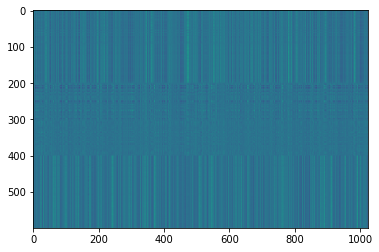

,AUC,pAUC
Source_0,0.630600,0.624211
Source_1,0.744300,0.621579
Source_2,0.791700,0.684737
Target_0,0.598700,0.656842
Target_1,0.743800,0.610526
Target_2,0.683000,0.525789
mean,0.698683,0.620614
h_mean,0.691938,0.616427


2021-06-01 20:55:48,796 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:381.253548, val_AUC_hmean:0.691938, val_pAUC_hmean:0.616427, best_flag:True
2021-06-01 20:55:48,797 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 68.34it/s]
2021-06-01 20:55:48,975 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.08it/s]
2021-06-01 20:55:49,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 138.79it/s]
2021-06-01 20:55:49,051 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:376.954325, val_AUC_hmean:0.688812, val_pAUC_hmean:0.615060, best_flag:False
2021-06-01 20:55:49,052 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.23it/s]
2021-06-01 20:55:49,253 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 128.21it/s]
2021-06-01 20:55:49,288 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.68it/s]
2021-06-01 20

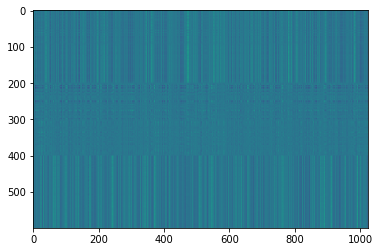

,AUC,pAUC
Source_0,0.6462,0.626316
Source_1,0.7381,0.613684
Source_2,0.8061,0.706842
Target_0,0.5993,0.650000
Target_1,0.7450,0.605263
Target_2,0.6875,0.534737
mean,0.7037,0.622807
h_mean,0.6970,0.618455


2021-06-01 20:55:51,260 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:366.401746, val_AUC_hmean:0.697000, val_pAUC_hmean:0.618455, best_flag:True
2021-06-01 20:55:51,261 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 68.56it/s]
2021-06-01 20:55:51,438 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.36it/s]
2021-06-01 20:55:51,471 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 135.06it/s]
2021-06-01 20:55:51,510 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:363.333104, val_AUC_hmean:0.699726, val_pAUC_hmean:0.616978, best_flag:False
2021-06-01 20:55:51,511 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.12it/s]
2021-06-01 20:55:51,695 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 144.22it/s]
2021-06-01 20:55:51,735 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 146.62it/s]
2021-06-01 20

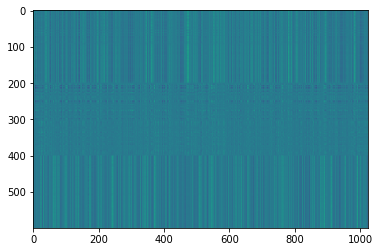

,AUC,pAUC
Source_0,0.64370,0.624737
Source_1,0.74170,0.634737
Source_2,0.82240,0.695263
Target_0,0.60250,0.656316
Target_1,0.73920,0.607368
Target_2,0.68740,0.526842
mean,0.70615,0.624211
h_mean,0.69889,0.619666


2021-06-01 20:55:53,522 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:355.905426, val_AUC_hmean:0.698890, val_pAUC_hmean:0.619666, best_flag:True
2021-06-01 20:55:53,523 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.37it/s]
2021-06-01 20:55:53,703 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 154.36it/s]
2021-06-01 20:55:53,738 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 131.16it/s]
2021-06-01 20:55:53,777 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:352.983437, val_AUC_hmean:0.697011, val_pAUC_hmean:0.611216, best_flag:False
2021-06-01 20:55:53,778 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.77it/s]
2021-06-01 20:55:53,962 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.41it/s]
2021-06-01 20:55:53,998 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 144.51it/s]
2021-06-01 20

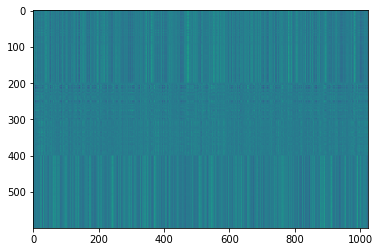

,AUC,pAUC
Source_0,0.654600,0.624211
Source_1,0.756000,0.642632
Source_2,0.813300,0.712632
Target_0,0.594200,0.650526
Target_1,0.764100,0.612105
Target_2,0.694200,0.529474
mean,0.712733,0.628596
h_mean,0.704876,0.623638


2021-06-01 20:55:56,194 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:343.897675, val_AUC_hmean:0.704876, val_pAUC_hmean:0.623638, best_flag:True
2021-06-01 20:55:56,195 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.24it/s]
2021-06-01 20:55:56,378 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.01it/s]
2021-06-01 20:55:56,411 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.41it/s]
2021-06-01 20:55:56,446 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:340.708847, val_AUC_hmean:0.714541, val_pAUC_hmean:0.623407, best_flag:False
2021-06-01 20:55:56,447 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 32.72it/s]
2021-06-01 20:55:56,816 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 122.29it/s]
2021-06-01 20:55:56,854 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.76it/s]
2021-06-01 20

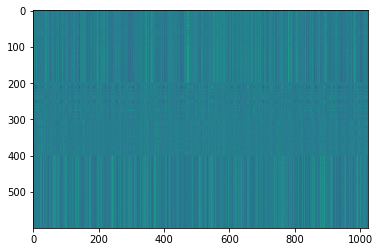

,AUC,pAUC
Source_0,0.690200,0.635789
Source_1,0.755700,0.639474
Source_2,0.809600,0.712105
Target_0,0.620800,0.663158
Target_1,0.780500,0.632105
Target_2,0.691100,0.534737
mean,0.724650,0.636228
h_mean,0.718879,0.631516


2021-06-01 20:55:59,190 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:330.711787, val_AUC_hmean:0.718879, val_pAUC_hmean:0.631516, best_flag:True
2021-06-01 20:55:59,191 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 70.00it/s]
2021-06-01 20:55:59,364 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 155.30it/s]
2021-06-01 20:55:59,400 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 115.11it/s]
2021-06-01 20:55:59,443 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:328.533412, val_AUC_hmean:0.705835, val_pAUC_hmean:0.619480, best_flag:False
2021-06-01 20:55:59,444 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.62it/s]
2021-06-01 20:55:59,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 148.89it/s]
2021-06-01 20:55:59,672 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 166.79it/s]
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 139.97it/s]
2021-06-01 20:56:03,416 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 141.02it/s]
2021-06-01 20:56:03,452 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:290.130653, val_AUC_hmean:0.722985, val_pAUC_hmean:0.624678, best_flag:False
2021-06-01 20:56:03,453 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 62.54it/s]
2021-06-01 20:56:03,648 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 161.27it/s]
2021-06-01 20:56:03,676 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 169.55it/s]
2021-06-01 20:56:03,707 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:287.432035, val_AUC_hmean:0.720179, val_pAUC_hmean:0.623504, best_flag:False
2021-06-01 20:56:03,708 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.35it/s]
2021-06-01 20:56:03,910 - pytorch_modeler.py - INFO - valid_source
100%|███████

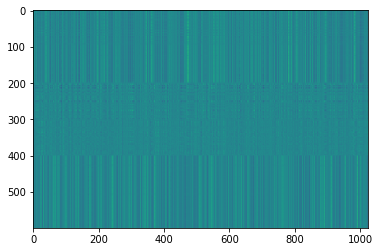

,AUC,pAUC
Source_0,0.706800,0.636842
Source_1,0.767900,0.650526
Source_2,0.818800,0.706316
Target_0,0.628500,0.665789
Target_1,0.807200,0.650000
Target_2,0.676200,0.523158
mean,0.734233,0.638772
h_mean,0.727522,0.633234


2021-06-01 20:56:07,890 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:265.063995, val_AUC_hmean:0.727522, val_pAUC_hmean:0.633234, best_flag:True
2021-06-01 20:56:07,891 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 71.58it/s]
2021-06-01 20:56:08,060 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 155.68it/s]
2021-06-01 20:56:08,090 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 151.66it/s]
2021-06-01 20:56:08,123 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:262.352475, val_AUC_hmean:0.722821, val_pAUC_hmean:0.625290, best_flag:False
2021-06-01 20:56:08,124 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 70.18it/s]
2021-06-01 20:56:08,297 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 156.80it/s]
2021-06-01 20:56:08,326 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.02it/s]
2021-06-01 20

100%|██████████| 2/2 [00:00<00:00, 155.59it/s]
2021-06-01 20:56:12,162 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 164.68it/s]
2021-06-01 20:56:12,195 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:232.085578, val_AUC_hmean:0.721048, val_pAUC_hmean:0.618396, best_flag:False
2021-06-01 20:56:12,196 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 69.09it/s]
2021-06-01 20:56:12,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.55it/s]
2021-06-01 20:56:12,411 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 150.98it/s]
2021-06-01 20:56:12,446 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:230.619455, val_AUC_hmean:0.724167, val_pAUC_hmean:0.619756, best_flag:False
2021-06-01 20:56:12,447 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.04it/s]
2021-06-01 20:56:12,645 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-06-01 20:56:16,320 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.82it/s]
2021-06-01 20:56:16,511 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 114.56it/s]
2021-06-01 20:56:16,546 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 149.23it/s]
2021-06-01 20:56:16,581 - pytorch_modeler.py - INFO - epoch:98/300, train_losses:203.935360, val_AUC_hmean:0.738253, val_pAUC_hmean:0.628454, best_flag:False
2021-06-01 20:56:16,582 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 61.62it/s]
2021-06-01 20:56:16,779 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.12it/s]
2021-06-01 20:56:16,816 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 129.32it/s]
2021-06-01 20:56:16,853 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:202.803932, val_AUC_hmean:0.726937, val_pAUC_hmean:0.617678, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 151.73it/s]
2021-06-01 20:56:20,574 - pytorch_modeler.py - INFO - epoch:114/300, train_losses:178.933186, val_AUC_hmean:0.739852, val_pAUC_hmean:0.628817, best_flag:False
2021-06-01 20:56:20,574 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.80it/s]
2021-06-01 20:56:20,781 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 116.27it/s]
2021-06-01 20:56:20,819 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.76it/s]
2021-06-01 20:56:20,879 - pytorch_modeler.py - INFO - epoch:115/300, train_losses:178.052728, val_AUC_hmean:0.727271, val_pAUC_hmean:0.618035, best_flag:False
2021-06-01 20:56:20,880 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 55.48it/s]
2021-06-01 20:56:21,099 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 162.02it/s]
2021-06-01 20:56:21,131 - pytorch_modeler.py - INFO - valid_target
100%|██████

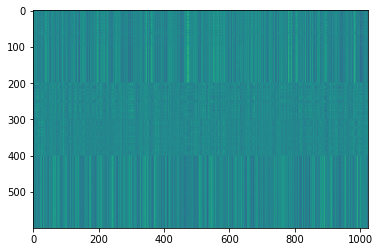

,AUC,pAUC
Source_0,0.764200,0.650526
Source_1,0.764900,0.671579
Source_2,0.821600,0.705263
Target_0,0.670400,0.664737
Target_1,0.808400,0.641579
Target_2,0.646200,0.514211
mean,0.745950,0.641316
h_mean,0.739898,0.634793


2021-06-01 20:56:26,030 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:158.366055, val_AUC_hmean:0.739898, val_pAUC_hmean:0.634793, best_flag:True
2021-06-01 20:56:26,031 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.09it/s]
2021-06-01 20:56:26,223 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.21it/s]
2021-06-01 20:56:26,254 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 168.99it/s]
2021-06-01 20:56:26,285 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:156.735944, val_AUC_hmean:0.735941, val_pAUC_hmean:0.618446, best_flag:False
2021-06-01 20:56:26,286 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.96it/s]
2021-06-01 20:56:26,464 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 160.16it/s]
2021-06-01 20:56:26,494 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 152.88it/s]
2021-06-01 

100%|██████████| 2/2 [00:00<00:00, 153.44it/s]
2021-06-01 20:56:30,135 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.41it/s]
2021-06-01 20:56:30,178 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:136.165900, val_AUC_hmean:0.733902, val_pAUC_hmean:0.624283, best_flag:False
2021-06-01 20:56:30,179 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.31it/s]
2021-06-01 20:56:30,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 137.56it/s]
2021-06-01 20:56:30,405 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 130.97it/s]
2021-06-01 20:56:30,445 - pytorch_modeler.py - INFO - epoch:147/300, train_losses:135.577527, val_AUC_hmean:0.728149, val_pAUC_hmean:0.620021, best_flag:False
2021-06-01 20:56:30,446 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.22it/s]
2021-06-01 20:56:30,629 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-06-01 20:56:34,272 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.05it/s]
2021-06-01 20:56:34,455 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 152.62it/s]
2021-06-01 20:56:34,486 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 168.35it/s]
2021-06-01 20:56:34,517 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:117.865166, val_AUC_hmean:0.740305, val_pAUC_hmean:0.621323, best_flag:False
2021-06-01 20:56:34,518 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 70.50it/s]
2021-06-01 20:56:34,691 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 162.10it/s]
2021-06-01 20:56:34,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 162.65it/s]
2021-06-01 20:56:34,755 - pytorch_modeler.py - INFO - epoch:164/300, train_losses:115.977091, val_AUC_hmean:0.729808, val_pAUC_hmean:0.620320, best_flag:False
2021-06-01

100%|██████████| 2/2 [00:00<00:00, 139.46it/s]
2021-06-01 20:56:38,533 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:101.951590, val_AUC_hmean:0.728941, val_pAUC_hmean:0.625142, best_flag:False
2021-06-01 20:56:38,534 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 64.70it/s]
2021-06-01 20:56:38,721 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.00it/s]
2021-06-01 20:56:38,755 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 159.05it/s]
2021-06-01 20:56:38,790 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:100.891490, val_AUC_hmean:0.743402, val_pAUC_hmean:0.628381, best_flag:False
2021-06-01 20:56:38,791 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.15it/s]
2021-06-01 20:56:38,975 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 111.30it/s]
2021-06-01 20:56:39,010 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 64.91it/s]
2021-06-01 20:56:43,003 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 138.01it/s]
2021-06-01 20:56:43,039 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.15it/s]
2021-06-01 20:56:43,084 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:87.302713, val_AUC_hmean:0.720408, val_pAUC_hmean:0.610635, best_flag:False
2021-06-01 20:56:43,085 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 58.68it/s]
2021-06-01 20:56:43,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 142.24it/s]
2021-06-01 20:56:43,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 137.76it/s]
2021-06-01 20:56:43,360 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:85.688658, val_AUC_hmean:0.732834, val_pAUC_hmean:0.629144, best_flag:False
2021-06-01 20:56:43,361 - pytorch_modeler.py - INFO - train
100%|███████

2021-06-01 20:56:47,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.66it/s]
2021-06-01 20:56:47,511 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.14it/s]
2021-06-01 20:56:47,556 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 144.27it/s]
2021-06-01 20:56:47,592 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:72.585252, val_AUC_hmean:0.728749, val_pAUC_hmean:0.620105, best_flag:False
2021-06-01 20:56:47,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 60.56it/s]
2021-06-01 20:56:47,793 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 125.59it/s]
2021-06-01 20:56:47,830 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 127.84it/s]
2021-06-01 20:56:47,869 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:72.869041, val_AUC_hmean:0.728256, val_pAUC_hmean:0.624211, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 133.45it/s]
2021-06-01 20:56:52,016 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:63.683847, val_AUC_hmean:0.726954, val_pAUC_hmean:0.618486, best_flag:False
2021-06-01 20:56:52,017 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 68.32it/s]
2021-06-01 20:56:52,194 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 140.59it/s]
2021-06-01 20:56:52,230 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 134.78it/s]
2021-06-01 20:56:52,267 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:61.984063, val_AUC_hmean:0.730940, val_pAUC_hmean:0.623541, best_flag:False
2021-06-01 20:56:52,268 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.11it/s]
2021-06-01 20:56:52,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.38it/s]
2021-06-01 20:56:52,487 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 61.78it/s]
2021-06-01 20:56:56,469 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 147.74it/s]
2021-06-01 20:56:56,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 111.51it/s]
2021-06-01 20:56:56,545 - pytorch_modeler.py - INFO - epoch:246/300, train_losses:51.921820, val_AUC_hmean:0.716208, val_pAUC_hmean:0.620216, best_flag:False
2021-06-01 20:56:56,546 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.43it/s]
2021-06-01 20:56:56,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 146.95it/s]
2021-06-01 20:56:56,761 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 128.88it/s]
2021-06-01 20:56:56,800 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:50.978214, val_AUC_hmean:0.714547, val_pAUC_hmean:0.619091, best_flag:False
2021-06-01 20:56:56,802 - pytorch_modeler.py - INFO - train
100%|███████

2021-06-01 20:57:00,894 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.50it/s]
2021-06-01 20:57:01,076 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 149.88it/s]
2021-06-01 20:57:01,113 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 133.80it/s]
2021-06-01 20:57:01,153 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:44.902137, val_AUC_hmean:0.722430, val_pAUC_hmean:0.618377, best_flag:False
2021-06-01 20:57:01,154 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 66.16it/s]
2021-06-01 20:57:01,339 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 134.40it/s]
2021-06-01 20:57:01,375 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 121.10it/s]
2021-06-01 20:57:01,415 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:42.918550, val_AUC_hmean:0.721292, val_pAUC_hmean:0.619713, best_flag:False
2021-06-01 2

100%|██████████| 2/2 [00:00<00:00, 122.76it/s]
2021-06-01 20:57:05,419 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:36.438389, val_AUC_hmean:0.718783, val_pAUC_hmean:0.617427, best_flag:False
2021-06-01 20:57:05,421 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 67.44it/s]
2021-06-01 20:57:05,601 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 135.82it/s]
2021-06-01 20:57:05,635 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 154.10it/s]
2021-06-01 20:57:05,672 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:35.857297, val_AUC_hmean:0.733203, val_pAUC_hmean:0.621103, best_flag:False
2021-06-01 20:57:05,673 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 63.96it/s]
2021-06-01 20:57:05,862 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 143.35it/s]
2021-06-01 20:57:05,897 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 62.31it/s]
2021-06-01 20:57:10,008 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.44it/s]
2021-06-01 20:57:10,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 141.51it/s]
2021-06-01 20:57:10,087 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:29.798655, val_AUC_hmean:0.716722, val_pAUC_hmean:0.619555, best_flag:False
2021-06-01 20:57:10,088 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 65.50it/s]
2021-06-01 20:57:10,274 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 139.85it/s]
2021-06-01 20:57:10,308 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 135.03it/s]
2021-06-01 20:57:10,345 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:29.318370, val_AUC_hmean:0.724010, val_pAUC_hmean:0.619966, best_flag:False
2021-06-01 20:57:10,346 - pytorch_modeler.py - INFO - train
100%|███████

,AUC,pAUC
Source_0,0.764200,0.650526
Source_1,0.764900,0.671579
Source_2,0.821600,0.705263
Target_0,0.670400,0.664737
Target_1,0.808400,0.641579
Target_2,0.646200,0.514211
mean,0.745950,0.641316
h_mean,0.739898,0.634793


elapsed time: 108.175701857 [sec]


In [15]:
for machine_type in machine_types:
    run(machine_type)

In [16]:
#run(machine_types[2])